# "Euphotic zone residence time of Antarctic Bottom Water"

### Code for Visualizing the Euphotic Zone Residence Locations 
Used for generating Figure 2

Corresponding to Yinghuan Xie (yinghuan.xie@utas.edu.au)

In [3]:
# Importing the relevant modules. 
import numpy as np
import xarray as xr
import math
import time
import datetime as dt
from datetime import timedelta
import calendar
import os
import re
from glob import glob
#
import netCDF4 as nc
import pandas as pd
import gsw
#
import cartopy.crs as ccrs
from scipy.io import loadmat
#
import matplotlib.pyplot as plt
import matplotlib.colors as col

#
import cosima_cookbook as cc
#session =cc.database.create_session('cosima_master_2022-08-30.db')
session =cc.database.create_session()
expt = '01deg_jra55v13_ryf9091'
#
from os import sys
sys.path.append('/home/581/yx9454/PhD_Ch1')
from My_Py_Func import Ch1_defs as c1d

import pygamma

In [2]:
# In each experiment, we define 06-18, release-06, 05-release, 87-05,
# loop_start_point-87 (if availiable) as No 0,1,2,3,4(if availiable)

master_path = '/g/data/jk72/yx9454/runs/parcels/output_after_Aug/'
traj_input = {'MLS_ON':[{'out_freq': 5,
                        'exp_path':'CORE_Curtain_Forward(out_freq=5days)_Following_MLS_ON/'},
                        {'out_freq': 5,
                        'exp_path':'CORE_Curtain_Forward(out_freq=5days)_Jan-Dec_MLS_ON/'},
                        {'out_freq': 0.25,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=6hrs)_Jan-Dec_MLS_ON/'},
                        {'out_freq': 0.25,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=6hrs)_Following_MLS_ON/'},
                        {'out_freq': 0.25,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=6hrs)_Following_Loop_MLS_ON/'}],
              'MLS_OFF':[{'out_freq': 5,
                        'exp_path':'CORE_Curtain_Forward(out_freq=5days)_Following_MLS_OFF/'},
                        {'out_freq': 5,
                        'exp_path':'CORE_Curtain_Forward(out_freq=5days)_Jan-Dec_MLS_OFF/'},
                        {'out_freq': 5,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=5day)_Jan-Dec_MLS_OFF/'},
                        {'out_freq': 5,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=5days)_Following_MLS_OFF/'},
                        {'out_freq': 5,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=5days)_Following_Loop_MLS_OFF/'}],
              'MLS_Weak':[{'out_freq': 5,
                        'exp_path':'CORE_Curtain_Forward(out_freq=5days)_Following_MLS_ON_middle_forw/'},
                        {'out_freq': 5,
                        'exp_path':'CORE_Curtain_Forward(out_freq=5days)_Jan-Dec_MLS_ON_middle_forw/'},
                          {'out_freq': 0.25,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=6hrs)_Jan-Dec_MLS_ON_middle_back/'},
                        {'out_freq': 0.25,
                        'exp_path':'CORE_Curtain_Backwards(out_freq=6hrs)_Following_MLS_ON_middle_back/'},
                        ]
        }

## Load MLS_ON

In [3]:
%%time
exp_name = 'MLS_ON'

# Load traj files 0
# From 5days freq npz file
var_in_arrs_0 = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_0.npz')
var_in_arrs_0['x']   =npzfile['x']
var_in_arrs_0['y']   =npzfile['y']
var_in_arrs_0['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_0_CS_Eu_date.npz')
var_in_arrs_0['CS_Eu_date']=npzfile['CS_Eu_date']

# Load traj files 1
# From 5days freq npz file
var_in_arrs_1 = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_1.npz')
var_in_arrs_1['x']   =npzfile['x']
var_in_arrs_1['y']   =npzfile['y']
var_in_arrs_1['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_1_CS_Eu_date.npz')
var_in_arrs_1['CS_Eu_date']=npzfile['CS_Eu_date']

# Load traj files 3
# From 5days freq npz file
var_in_arrs_3 = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_3_5days_freq.npz')
var_in_arrs_3['x']   =npzfile['x']
var_in_arrs_3['y']   =npzfile['y']
var_in_arrs_3['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_3_5days_freq_CS_Eu_date.npz')
var_in_arrs_3['CS_Eu_date']=npzfile['CS_Eu_date']

# Manually reset
traj_input[exp_name][3]['out_freq'] = 5

# Load traj files 2
# From 5days freq npz file
var_in_arrs_2 = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_2_5days_freq.npz')
var_in_arrs_2['x']   =npzfile['x']
var_in_arrs_2['y']   =npzfile['y']
var_in_arrs_2['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_2_5days_freq_CS_Eu_date.npz')
var_in_arrs_2['CS_Eu_date']=npzfile['CS_Eu_date']

# Manually reset
traj_input[exp_name][2]['out_freq'] = 5

# Load traj files 4
# From 5days freq npz file
var_in_arrs_4 = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_5days_freq.npz')
var_in_arrs_4['x']   =npzfile['x']
var_in_arrs_4['y']   =npzfile['y']
var_in_arrs_4['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_5days_freq_CS_Eu_date.npz')
var_in_arrs_4['CS_Eu_date']=npzfile['CS_Eu_date']

# Manually reset
traj_input[exp_name][4]['out_freq'] = 5

CPU times: user 1min 53s, sys: 22min 20s, total: 24min 14s
Wall time: 29min 31s


In [4]:
exp_name = 'MLS_ON'
AABW_inds = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/AABW_inds.npz')['AABW_inds']

stopsign_list = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/stopsign_list_for_20yrs_150m_thre.npz')['stopsign_list']
CDW_inds = ~(np.isnan(stopsign_list))
AABW_shallower_than_EZD_plus_CDW =  (var_in_arrs_0['CS_Eu_date'][:,-1]>0) & (CDW_inds)

In [5]:
print('AABW: ',sum(AABW_inds))
print('AABW_CDW: ',sum(CDW_inds))
print('AABW&EZD: ',sum(var_in_arrs_0['CS_Eu_date'][:,-1]>0))
print('AABW&cdw&EZD: ',sum(AABW_shallower_than_EZD_plus_CDW))

AABW:  94123
AABW_CDW:  88809
AABW&EZD:  41013
AABW&cdw&EZD:  36161


### If we need to get z

In [6]:
%%time
# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_0.npz')
var_in_arrs_0['z']   =npzfile['z']

# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_1.npz')
var_in_arrs_1['z']   =npzfile['z']

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_3_5days_freq.npz')
var_in_arrs_3['z']   =npzfile['z']

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_2_5days_freq.npz')
var_in_arrs_2['z']   =npzfile['z']

# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_5days_freq.npz')
var_in_arrs_4['z']   =npzfile['z']

CPU times: user 50 s, sys: 7min 13s, total: 8min 3s
Wall time: 11min 15s


### If we need to get T & S

In [26]:
%%time
# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_0.npz')
var_in_arrs_0['T']   =npzfile['T']
var_in_arrs_0['S']   =npzfile['S']

# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_1.npz')
var_in_arrs_1['T']   =npzfile['T']
var_in_arrs_1['S']   =npzfile['S']

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_3_5days_freq.npz')
var_in_arrs_3['T']   =npzfile['T']
var_in_arrs_3['S']   =npzfile['S']

# Manually reset
#traj_input[exp_name][3]['out_freq'] = 5

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_2_5days_freq.npz')
var_in_arrs_2['T']   =npzfile['T']
var_in_arrs_2['S']   =npzfile['S']

# Manually reset
#traj_input[exp_name][2]['out_freq'] = 5

# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_5days_freq.npz')
var_in_arrs_4['T']   =npzfile['T']
var_in_arrs_4['S']   =npzfile['S']

CPU times: user 1min 7s, sys: 8min 47s, total: 9min 55s
Wall time: 11min 36s


## If we need to anaysis MLS OFF version, execute the following chunks

In [6]:
%%time
# Load traj files 0
# From 5days freq npz file
var_in_arrs_0_MLS_OFF = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_0.npz')
var_in_arrs_0_MLS_OFF['x']   =npzfile['x']
var_in_arrs_0_MLS_OFF['y']   =npzfile['y']
var_in_arrs_0_MLS_OFF['z']   =npzfile['z']
var_in_arrs_0_MLS_OFF['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_0_CS_Eu_date.npz')
var_in_arrs_0_MLS_OFF['CS_Eu_date']=npzfile['CS_Eu_date']

# Load traj files 1
# From 5days freq npz file
var_in_arrs_1_MLS_OFF = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_1.npz')
var_in_arrs_1_MLS_OFF['x']   =npzfile['x']
var_in_arrs_1_MLS_OFF['y']   =npzfile['y']
var_in_arrs_1_MLS_OFF['z']   =npzfile['z']
var_in_arrs_1_MLS_OFF['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_1_CS_Eu_date.npz')
var_in_arrs_1_MLS_OFF['CS_Eu_date']=npzfile['CS_Eu_date']

# Load traj files 3
# From 5days freq npz file
var_in_arrs_3_MLS_OFF = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_3.npz')
var_in_arrs_3_MLS_OFF['x']   =npzfile['x']
var_in_arrs_3_MLS_OFF['y']   =npzfile['y']
var_in_arrs_3_MLS_OFF['z']   =npzfile['z']
var_in_arrs_3_MLS_OFF['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_3_CS_Eu_date.npz')
var_in_arrs_3_MLS_OFF['CS_Eu_date']=npzfile['CS_Eu_date']


# Load traj files 2
# From 5days freq npz file
var_in_arrs_2_MLS_OFF = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_2.npz')
var_in_arrs_2_MLS_OFF['x']   =npzfile['x']
var_in_arrs_2_MLS_OFF['y']   =npzfile['y']
var_in_arrs_2_MLS_OFF['z']   =npzfile['z']
var_in_arrs_2_MLS_OFF['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_2_CS_Eu_date.npz')
var_in_arrs_2_MLS_OFF['CS_Eu_date']=npzfile['CS_Eu_date']

# Load traj files 4
# From 5days freq npz file
var_in_arrs_4_MLS_OFF = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_4.npz')
var_in_arrs_4_MLS_OFF['x']   =npzfile['x']
var_in_arrs_4_MLS_OFF['y']   =npzfile['y']
var_in_arrs_4_MLS_OFF['z']   =npzfile['z']
var_in_arrs_4_MLS_OFF['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_OFF/var_in_arrs_4_CS_Eu_date.npz')
var_in_arrs_4_MLS_OFF['CS_Eu_date']=npzfile['CS_Eu_date']

CPU times: user 1min 53s, sys: 1min 38s, total: 3min 32s
Wall time: 3min 37s


In [7]:
AABW_inds_MLS_OFF = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_OFF/AABW_inds.npz')['AABW_inds']
#
stopsign_list = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_OFF/stopsign_list_for_20yrs_150m_thre.npz')['stopsign_list']
CDW_inds_MLS_OFF = ~(np.isnan(stopsign_list))
#
AABW_shallower_than_EZD_plus_CDW_MLS_OFF =  (var_in_arrs_0_MLS_OFF['CS_Eu_date'][:,-1]>0) & (CDW_inds_MLS_OFF)
sum(AABW_shallower_than_EZD_plus_CDW_MLS_OFF)

15509

## Load MLS_Weak if we need

In [3]:
%%time
# Load traj files 0
# From 5days freq npz file
var_in_arrs_0_MLS_Weak = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_0.npz')
var_in_arrs_0_MLS_Weak['x']   =npzfile['x']
var_in_arrs_0_MLS_Weak['y']   =npzfile['y']
var_in_arrs_0_MLS_Weak['z']   =npzfile['z']
var_in_arrs_0_MLS_Weak['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_0_CS_Eu_date.npz')
var_in_arrs_0_MLS_Weak['CS_Eu_date']=npzfile['CS_Eu_date']


# Load traj files 1
# From 5days freq npz file
var_in_arrs_1_MLS_Weak = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_1.npz')
var_in_arrs_1_MLS_Weak['x']   =npzfile['x']
var_in_arrs_1_MLS_Weak['y']   =npzfile['y']
var_in_arrs_1_MLS_Weak['z']   =npzfile['z']
var_in_arrs_1_MLS_Weak['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_1_CS_Eu_date.npz')
var_in_arrs_1_MLS_Weak['CS_Eu_date']=npzfile['CS_Eu_date']


# Load traj files 2
# From 5days freq npz file
var_in_arrs_2_MLS_Weak = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_2_5days_freq.npz')
var_in_arrs_2_MLS_Weak['x']   =npzfile['x']
var_in_arrs_2_MLS_Weak['y']   =npzfile['y']
var_in_arrs_2_MLS_Weak['z']   =npzfile['z']
var_in_arrs_2_MLS_Weak['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_2_5days_freq_CS_Eu_date.npz')
var_in_arrs_2_MLS_Weak['CS_Eu_date']=npzfile['CS_Eu_date']


# Load traj files 3
# From 5days freq npz file
var_in_arrs_3_MLS_Weak = {}
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_3_5days_freq.npz')
var_in_arrs_3_MLS_Weak['x']   =npzfile['x']
var_in_arrs_3_MLS_Weak['y']   =npzfile['y']
var_in_arrs_3_MLS_Weak['z']   =npzfile['z']
var_in_arrs_3_MLS_Weak['timeshort'] = npzfile['time']

npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_Weak/var_in_arrs_3_5days_freq_CS_Eu_date.npz')
var_in_arrs_3_MLS_Weak['CS_Eu_date']=npzfile['CS_Eu_date']

#
# MLS_Weak does not have var in arrs 4
#

CPU times: user 1min, sys: 1min 27s, total: 2min 28s
Wall time: 2min 34s


In [4]:
AABW_inds_MLS_Weak = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_Weak/AABW_inds.npz')['AABW_inds']
#
stopsign_list = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_Weak/stopsign_list_for_10yrs_150m_thre.npz')['stopsign_list']
CDW_inds_MLS_Weak = ~(np.isnan(stopsign_list))
#
AABW_shallower_than_EZD_plus_CDW_MLS_Weak =  (var_in_arrs_0_MLS_Weak['CS_Eu_date'][:,-1]>0) & (CDW_inds_MLS_Weak)
sum(AABW_shallower_than_EZD_plus_CDW_MLS_Weak)

22285

## Load PARZ for MLS ON / OFF and Weak versions

In [6]:
%%time
exp_name = 'MLS_ON'

# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_0_AABW_only_PARS_Z.npz')
var_in_arrs_0['PARZ']   =npzfile['PARZ']
#var_in_arrs_0['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_1_AABW_only_PARS_Z.npz')
var_in_arrs_1['PARZ']   =npzfile['PARZ']
#var_in_arrs_1['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_2_AABW_only_PARS_Z.npz')
var_in_arrs_2['PARZ']   =npzfile['PARZ']
#var_in_arrs_2['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][3]['out_freq'] = 5

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_3_AABW_only_PARS_Z.npz')
var_in_arrs_3['PARZ']   =npzfile['PARZ']
#var_in_arrs_3['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][2]['out_freq'] = 5


# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_4_AABW_only_PARS_Z.npz')
var_in_arrs_4['PARZ']   =npzfile['PARZ']
#var_in_arrs_4['Pt_ind']   =npzfile['Pt_ind']



CPU times: user 1min 19s, sys: 30min 18s, total: 31min 37s
Wall time: 37min 27s


In [7]:
%%time
exp_name = 'MLS_ON'
'''
# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_0_datetime.npz',allow_pickle=True)
var_in_arrs_0['datetime']   =npzfile['datetime']
#var_in_arrs_0['Pt_ind']   =npzfile['Pt_ind']
'''
# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_1_datetime.npz',allow_pickle=True)
var_in_arrs_1['datetime']   =npzfile['datetime']
#var_in_arrs_1['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_2_datetime.npz',allow_pickle=True)
var_in_arrs_2['datetime']   =npzfile['datetime']
#var_in_arrs_2['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][3]['out_freq'] = 5

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_3_datetime.npz',allow_pickle=True)
var_in_arrs_3['datetime']   =npzfile['datetime']
#var_in_arrs_3['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][2]['out_freq'] = 5
'''
# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_datetime.npz',allow_pickle=True)
var_in_arrs_4['datetime']   =npzfile['datetime']
#var_in_arrs_4['Pt_ind']   =npzfile['Pt_ind']
'''


CPU times: user 10.7 ms, sys: 23.7 ms, total: 34.4 ms
Wall time: 212 ms


"\n# Load traj files 4\n# From 5days freq npz file\nnpzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_datetime.npz',allow_pickle=True)\nvar_in_arrs_4['datetime']   =npzfile['datetime']\n#var_in_arrs_4['Pt_ind']   =npzfile['Pt_ind']\n"

In [7]:
%%time
exp_name = 'MLS_OFF'

# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_0_AABW_only_PARS_Z.npz')
var_in_arrs_0_MLS_OFF['PARZ']   =npzfile['PARZ']
#var_in_arrs_0['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_1_AABW_only_PARS_Z.npz')
var_in_arrs_1_MLS_OFF['PARZ']   =npzfile['PARZ']
#var_in_arrs_1['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_2_AABW_only_PARS_Z.npz')
var_in_arrs_2_MLS_OFF['PARZ']   =npzfile['PARZ']
#var_in_arrs_2['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][3]['out_freq'] = 5

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_3_AABW_only_PARS_Z.npz')
var_in_arrs_3_MLS_OFF['PARZ']   =npzfile['PARZ']
#var_in_arrs_3['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][2]['out_freq'] = 5

# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_4_AABW_only_PARS_Z.npz')
var_in_arrs_4_MLS_OFF['PARZ']   =npzfile['PARZ']
#var_in_arrs_4['Pt_ind']   =npzfile['Pt_ind']



CPU times: user 2.7 s, sys: 2.5 s, total: 5.2 s
Wall time: 7.91 s


In [14]:
%%time
exp_name = 'MLS_Weak'

# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_0_AABW_only_PARS_Z.npz')
var_in_arrs_0_MLS_Weak['PARZ']   =npzfile['PARZ']
#var_in_arrs_0['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_1_AABW_only_PARS_Z.npz')
var_in_arrs_1_MLS_Weak['PARZ']   =npzfile['PARZ']
#var_in_arrs_1['Pt_ind']   =npzfile['Pt_ind']

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_2_AABW_only_PARS_Z_5days.npz')
var_in_arrs_2_MLS_Weak['PARZ']   =npzfile['PARZ']
#var_in_arrs_2['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][3]['out_freq'] = 5

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_3_AABW_only_PARS_Z_5days.npz')
var_in_arrs_3_MLS_Weak['PARZ']   =npzfile['PARZ']
#var_in_arrs_3['Pt_ind']   =npzfile['Pt_ind']

# Manually reset
#traj_input[exp_name][2]['out_freq'] = 5
'''
# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_4_AABW_only_PARS_Z.npz')
var_in_arrs_4_MLS_Weak['PARZ']   =npzfile['PARZ']
#var_in_arrs_4['Pt_ind']   =npzfile['Pt_ind']
'''


CPU times: user 1.41 s, sys: 806 ms, total: 2.21 s
Wall time: 2.21 s


"\n# Load traj files 4\n# From 5days freq npz file\nnpzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/'+exp_name+'/Chl-a_based_on_OCCCI_v6/var_in_arrs_4_AABW_only_PARS_Z.npz')\nvar_in_arrs_4_MLS_Weak['PARZ']   =npzfile['PARZ']\n#var_in_arrs_4['Pt_ind']   =npzfile['Pt_ind']\n"

## Quickly caucluate the Zeu Res for different PARZ threshold

In [8]:
var_in_arrs_4['PARZ'].shape,var_in_arrs_3['PARZ'].shape,var_in_arrs_2['PARZ'].shape,var_in_arrs_1['PARZ'].shape,var_in_arrs_0['PARZ'].shape

((94123, 27241), (94123, 26281), (94123, 1460), (94123, 73), (94123, 949))

In [9]:
dura_sum = []
i=0
for PARZ_thre in [0.315,0.433,0.551]:
    print(PARZ_thre)
    dura_sum.append(
    np.nansum(var_in_arrs_4['PARZ'][CDW_inds]>PARZ_thre,axis=1)/4+
    np.nansum(var_in_arrs_3['PARZ'][CDW_inds]>PARZ_thre,axis=1)/4+
    np.nansum(var_in_arrs_2['PARZ'][CDW_inds]>PARZ_thre,axis=1)/4+
    np.nansum(var_in_arrs_1['PARZ'][CDW_inds]>PARZ_thre,axis=1)*5+
    np.nansum(var_in_arrs_0['PARZ'][CDW_inds]>PARZ_thre,axis=1)*5
    )
    print('Zeu mean for all:',np.mean(dura_sum[i]))
    print('Zeu mean for non-zero res:',np.mean(dura_sum[i][dura_sum[i]>0]))
    print('done')
    i+=1

0.315


KeyboardInterrupt: 

## Load for plotting maps

In [10]:
def shelf_mask_isobath(var):
    '''
    Masks ACCESS-OM2-01 variables by the region polewards of the 1000m isobath as computed using
    a script contributed by Adele Morrison.
    Only to be used with ACCESS-OM2-0.1 output!
    '''
    contour_file = np.load('/g/data/ik11/grids/Antarctic_slope_contour_1000m.npz')

    shelf_mask = contour_file['contour_masked_above']
    yt_ocean = contour_file['yt_ocean']
    xt_ocean = contour_file['xt_ocean']

    # in this file the points along the isobath are given a positive value, the points outside (northwards)
    # of the isobath are given a value of -100 and all the points on the continental shelf have a value of 0
    # so we mask for the 0 values
    shelf_mask[np.where(shelf_mask!=0)] = np.nan
    shelf_mask = shelf_mask+1
    shelf_map = np.nan_to_num(shelf_mask)
    shelf_mask = xr.DataArray(shelf_mask, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])
    shelf_map = xr.DataArray(shelf_map, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])

    # then we want to multiply the variable with the mask so we need to account for the shape of the mask.
    # The mask uses a northern cutoff of 59S.
    masked_var = var.sel(yt_ocean = slice(-90, -59.03)) * shelf_mask
    return masked_var, shelf_map

xt_ocean,yt_ocean,yt_extend,ocean_depth,ocean_depth_extend = c1d.Load_Grid_Data(False)
# Grid inherited from CC Code
ht = cc.querying.getvar(expt,'ht', session, n=1)
ht = ht.sel(yt_ocean = slice(-90, -59))
land_mask = (ht*0).fillna(1)
yt_ocean_cc = ht.yt_ocean.values
xt_ocean_cc = ht.xt_ocean.values
ht_shelf , shelf_mask = shelf_mask_isobath(ht)
ht_all = cc.querying.getvar(expt,'ht', session, n=1)

In [7]:
def PDF3D_num_only(x,y,z,res,z_edge,npts):
  x_here = x.flatten()
  y_here = y.flatten()
  z_here = z.flatten()
  #p_here = psigma2.flatten()

  if res==0.1:
    x_edges,y_edges = np.arange(0,360.1,0.1),np.arange(-80,-29.9,0.1)
    Three_dim_PDF,edges = np.histogramdd((x_here,y_here,z_here),(x_edges,y_edges,z_edge))
    #Three_dim_PDF = (Three_dim_PDF/npts)*100
    #
    boxcenter = [edges[0][:-1]+(0.5*abs(edges[0][0]-edges[0][1])),
                 edges[1][:-1]+(0.5*abs(edges[1][0]-edges[1][1])),
                 edges[2][:-1]+(0.5*abs(edges[2][0]-edges[2][1]))]
    X,Y = np.meshgrid(boxcenter[0], boxcenter[1])
    print('RES=0.1 deg')

  elif res==1:
    x_edges,y_edges = np.arange(0,361,1),np.arange(-80,-29,1)
    Three_dim_PDF,edges = np.histogramdd((x_here,y_here,z_here),(x_edges,y_edges,z_edge))
    Three_dim_PDF = (Three_dim_PDF/npts)*100
    #
    boxcenter = [edges[0][:-1]+(0.5*abs(edges[0][0]-edges[0][1])),
                 edges[1][:-1]+(0.5*abs(edges[1][0]-edges[1][1])),
                 edges[2][:-1]+(0.5*abs(edges[2][0]-edges[2][1]))]
    X,Y = np.meshgrid(boxcenter[0], boxcenter[1])
    print('RES=1 deg')

  else:
    print('Plz choose 0.1 or 1 or build a new def')

  return(X,Y,Three_dim_PDF)

# Below chunks are for AABW particles Mean euphotic residence PDF maps

## For undistinguished AABW particles

In [18]:
%%time
res_map_x = np.ravel(np.concatenate((var_in_arrs_4['x'][AABW_inds],var_in_arrs_3['x'][AABW_inds],var_in_arrs_2['x'][AABW_inds]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds],var_in_arrs_3['y'][AABW_inds],var_in_arrs_2['y'][AABW_inds]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'],var_in_arrs_3['CS_Eu_date'],var_in_arrs_2['CS_Eu_date']),axis=1),order='C')


hist2d = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.1,0.1),np.arange(-80,-29.9,0.1)],weights=res_map_z)
hist2d_pts = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.1,0.1),np.arange(-80,-29.9,0.1)])

CPU times: user 40.3 s, sys: 1min 1s, total: 1min 42s
Wall time: 2min 18s


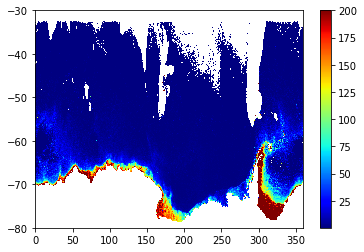

In [19]:
xbins,ybins=(hist2d[1][1:]+hist2d[1][:-1])/2,(hist2d[2][1:]+hist2d[2][:-1])/2
plt.pcolormesh(xbins,ybins,(hist2d[0]/hist2d_pts[0]).T,vmin=0.1,vmax=200,cmap='jet')
plt.colorbar()

## For CDW+Euphotic>0 only

### Global sectors key statistics

In [20]:
sum(AABW_shallower_than_EZD_plus_CDW)

36161

### For MLS ON Global Sectors

In [21]:
# To get a correct 2005-2006 CS_Eu_date
var_in_arrs_1_2={}
actual_res1 = var_in_arrs_1['CS_Eu_date'] - var_in_arrs_2['CS_Eu_date'][:,::-1][:,-1][:,np.newaxis]
var_in_arrs_1_2['CS_Eu_date'] =  var_in_arrs_2['CS_Eu_date'][:,::-1] + actual_res1

var_in_arrs_1_2['x'] = np.copy(var_in_arrs_1['x'][AABW_inds])
var_in_arrs_1_2['x'][np.isnan(var_in_arrs_1_2['x'])] = var_in_arrs_2['x'][AABW_inds][:,::-1][np.isnan(var_in_arrs_1_2['x'])]

var_in_arrs_1_2['y'] = np.copy(var_in_arrs_1['y'][AABW_inds])
var_in_arrs_1_2['y'][np.isnan(var_in_arrs_1_2['y'])] = var_in_arrs_2['y'][AABW_inds][:,::-1][np.isnan(var_in_arrs_1_2['y'])]

In [22]:
%%time

res_map_x = np.ravel(np.concatenate((var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')

hist2d = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
hist2d_pts = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

CPU times: user 20.7 s, sys: 6.63 s, total: 27.3 s
Wall time: 30.7 s


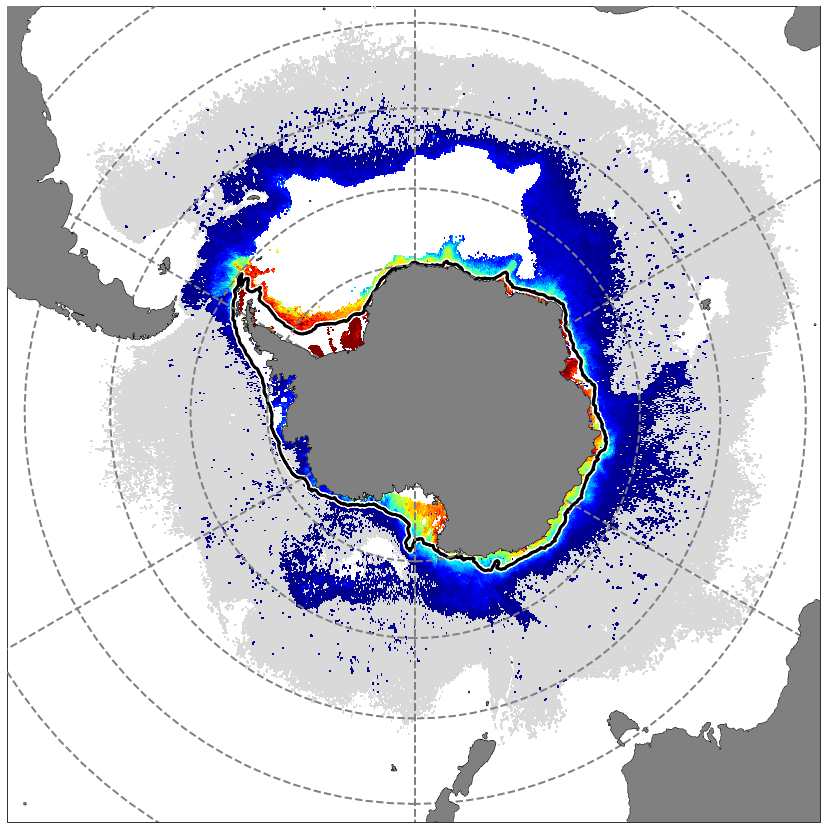

In [23]:
cmin,cmax = 5,200
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d[1][1:]+hist2d[1][:-1])/2,(hist2d[2][1:]+hist2d[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_pts[0] < npts_here/100, hist2d[0])
hist2d_masked_2 = np.ma.masked_where((hist2d_masked/hist2d_pts[0])<5, hist2d_masked)
#hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
plt.pcolormesh(xbins,ybins,(hist2d_masked_2/hist2d_pts[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())
#ax.colorbar()

plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts[0]).T,cmap='tab20c_r',vmax=0,zorder=4,
              transform=ccrs.PlateCarree())

# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

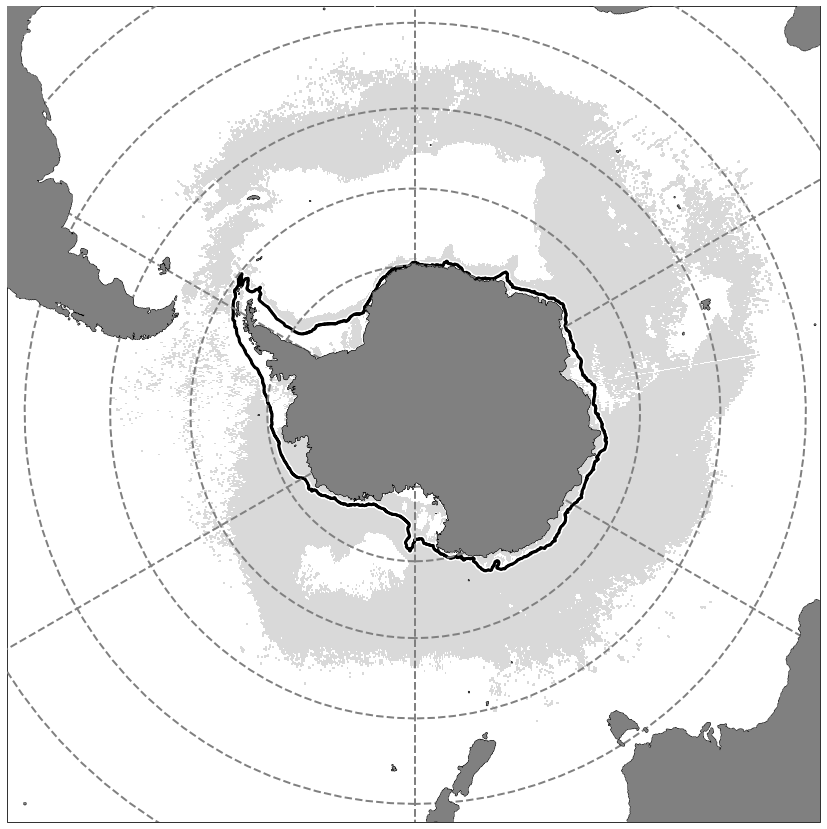

In [25]:
cmin,cmax = 5,200
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d[1][1:]+hist2d[1][:-1])/2,(hist2d[2][1:]+hist2d[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 1.5*npts_here/100, hist2d[0])

plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts[0]).T,cmap='tab20c_r',vmax=0,zorder=4,
              transform=ccrs.PlateCarree())

# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('test_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

### Plot the Particle . Day plot

In [44]:
PARZ_threshold = 0.433

# Euphotic residence PDF + Backwards PDF
# Visualization
# Global first
part_inds = AABW_inds #AABW_shallower_than_EZD
inds_here0 = var_in_arrs_0['PARZ'][CDW_inds]>0.433
res_map_x = np.ravel(var_in_arrs_0['x'][AABW_inds][CDW_inds][inds_here0])
res_map_y = np.ravel(var_in_arrs_0['y'][AABW_inds][CDW_inds][inds_here0])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_0 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

part_inds = AABW_inds #AABW_shallower_than_EZD
inds_here1 = var_in_arrs_1['PARZ'][CDW_inds]>0.433
res_map_x = np.ravel(var_in_arrs_1['x'][AABW_inds][CDW_inds][inds_here1])
res_map_y = np.ravel(var_in_arrs_1['y'][AABW_inds][CDW_inds][inds_here1])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_1 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

inds_here2 = var_in_arrs_2['PARZ'][:,::20][CDW_inds]>0.433
res_map_x = np.ravel(var_in_arrs_2['x'][AABW_inds][CDW_inds][inds_here2])
res_map_y = np.ravel(var_in_arrs_2['y'][AABW_inds][CDW_inds][inds_here2])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_2 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

inds_here3 = var_in_arrs_3['PARZ'][:,::20][CDW_inds][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)]>0.433
res_map_x = np.ravel(var_in_arrs_3['x'][AABW_inds][CDW_inds][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
res_map_y = np.ravel(var_in_arrs_3['y'][AABW_inds][CDW_inds][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_3 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

part_inds = AABW_inds #AABW_shallower_than_EZD
inds_here4 = var_in_arrs_4['PARZ'][:,::20][CDW_inds]>0.433
res_map_x = np.ravel(var_in_arrs_4['x'][AABW_inds][CDW_inds][inds_here4])
res_map_y = np.ravel(var_in_arrs_4['y'][AABW_inds][CDW_inds][inds_here4])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_4 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])


hist2d_pts_69_19 = hist2d_pts_0[0]*5 +hist2d_pts_1[0]*5 + hist2d_pts_2[0]*5 + hist2d_pts_3[0]*5 +hist2d_pts_4[0]*5

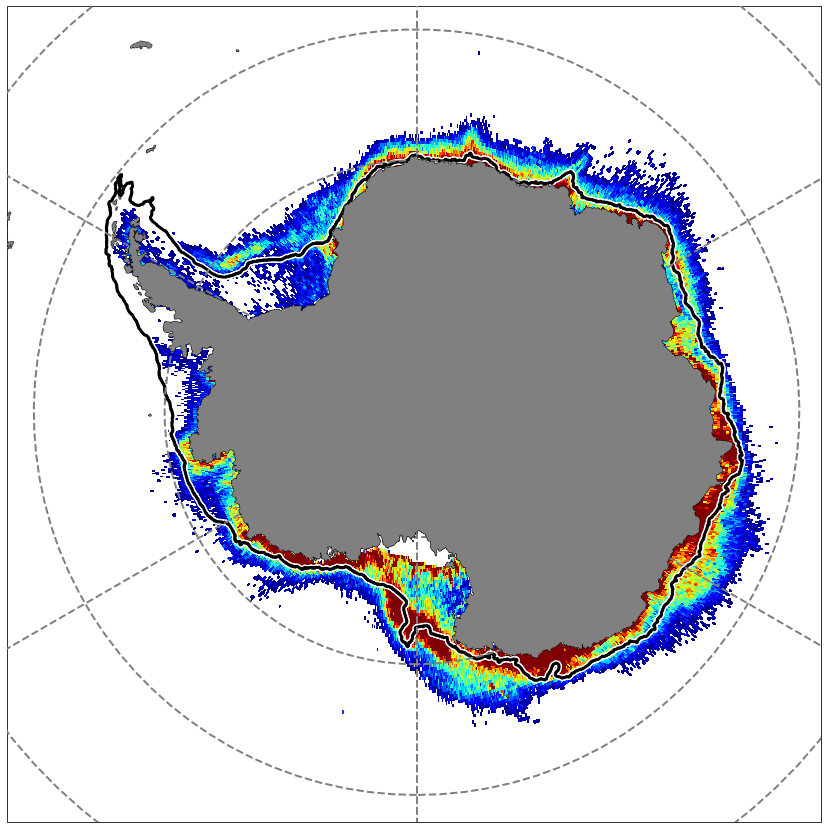

In [45]:
cmin,cmax = 40,400
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=hist2d_pts_1[1:]

ffmsk = hist2d_pts_69_19.T

#ffmsk[ffmsk<(0.5/1000)*sum(CDW_inds)] = np.nan
ffmsk[ffmsk<40] = np.nan

plt.pcolormesh(xbins,ybins,ffmsk,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())

# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -58], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360


# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('Figure_2_a_1969-2009_MLS_ON_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

In [27]:
print('point munber along contour:',933504/(12*13))
region_no = (np.array(list(np.arange(1,5985))*13*12)/300).astype(int)+1
wedd_ind =  (region_no<=15) & (region_no>=12)
wedd_ind = wedd_ind[AABW_inds]
print('wedd_ind',sum(wedd_ind))
prydz_ind =  (region_no==20) | (region_no==1)
prydz_ind = prydz_ind[AABW_inds]
print('prydz_ind',sum(prydz_ind))
adelie_ind =  (region_no<=4) & (region_no>=3)
adelie_ind = adelie_ind[AABW_inds]
print('adelie_ind',sum(adelie_ind))
ross_ind =  (region_no<=7) & (region_no>=5)
ross_ind = ross_ind[AABW_inds]
print('ross_ind',sum(ross_ind))

point munber along contour: 5984.0
wedd_ind 22377
prydz_ind 11630
adelie_ind 18886
ross_ind 37312


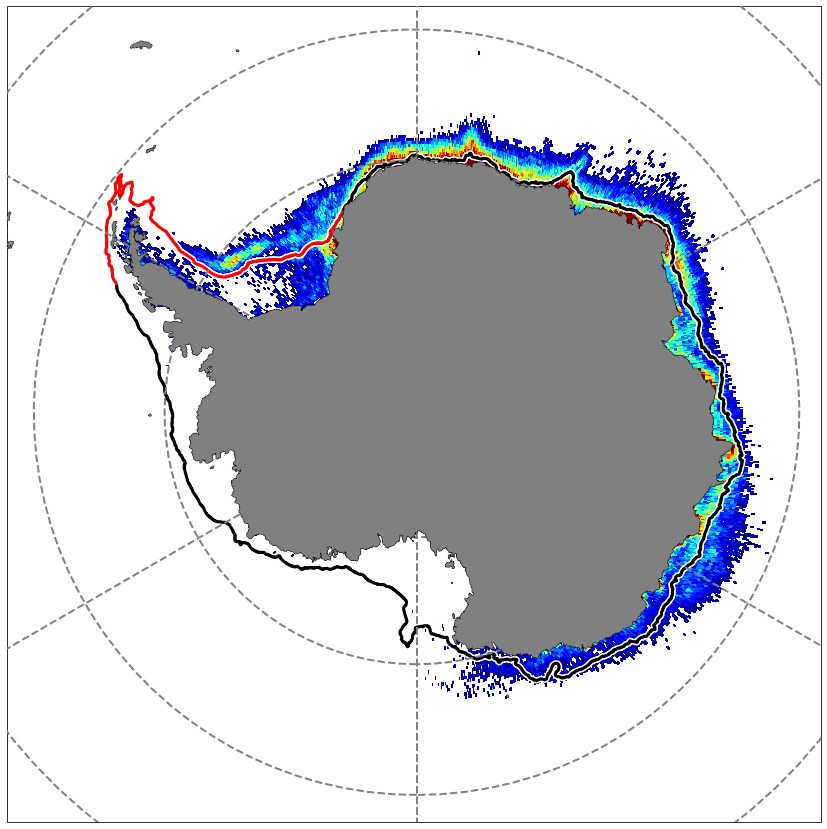

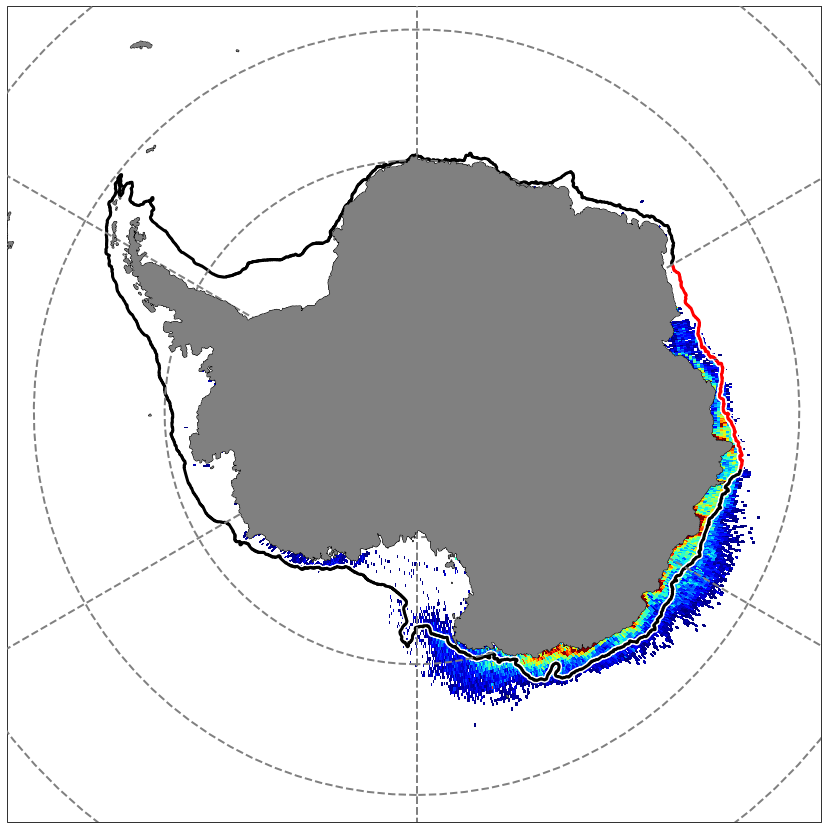

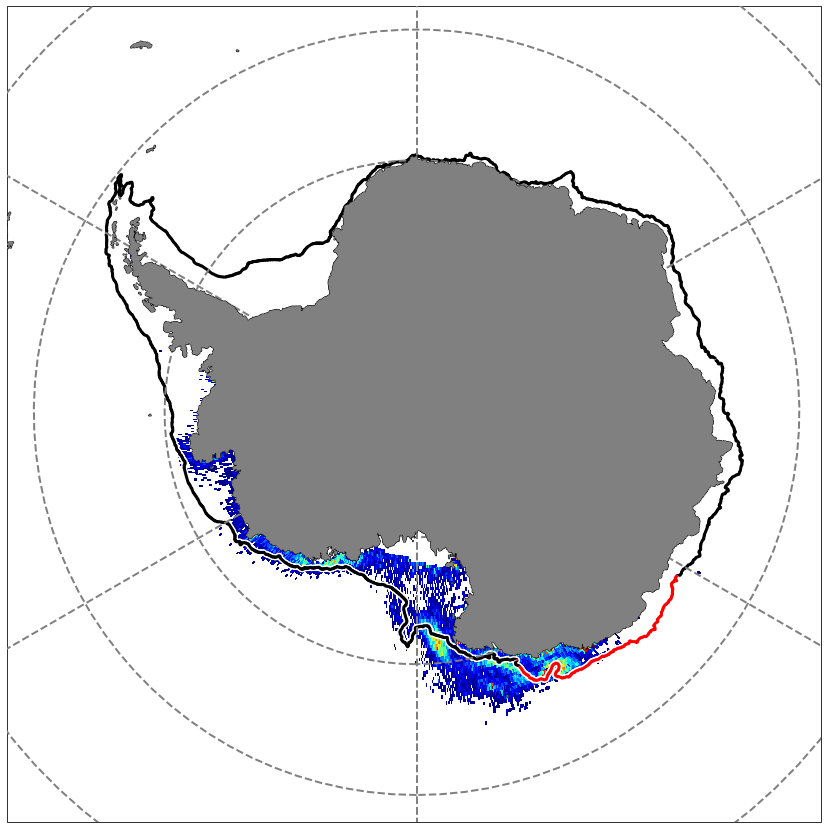

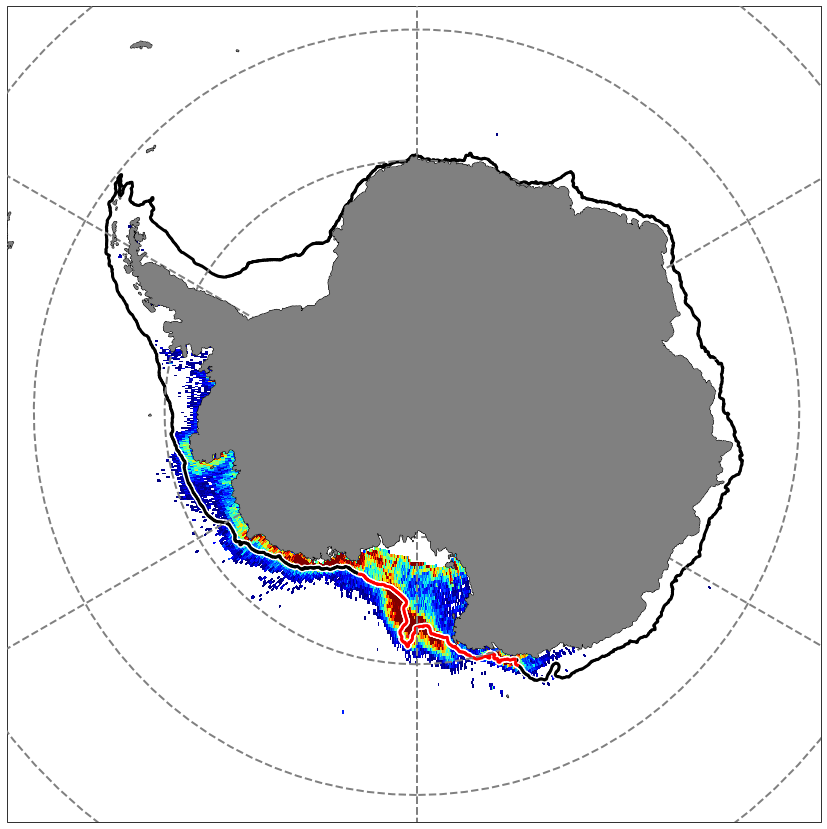

CPU times: user 1min 57s, sys: 13.4 s, total: 2min 11s
Wall time: 2min 22s


In [42]:
%%time
strs = ['Weddell_Sea','Prydz_Bay','Adelie_Coast','Ross_Sea']
i=0
for inds_here in  [wedd_ind,prydz_ind,adelie_ind,ross_ind]:
    npts_here = sum(AABW_shallower_than_EZD_plus_CDW & inds_here)
    #
    
    
    
    
    PARZ_threshold = 0.433

    # Euphotic residence PDF + Backwards PDF
    # Visualization
    # Global first
    part_inds = AABW_inds #AABW_shallower_than_EZD
    inds_here0 = var_in_arrs_0['PARZ'][inds_here & CDW_inds]>0.433
    res_map_x = np.ravel(var_in_arrs_0['x'][AABW_inds][inds_here & CDW_inds][inds_here0])
    res_map_y = np.ravel(var_in_arrs_0['y'][AABW_inds][inds_here & CDW_inds][inds_here0])
    res_map_z = np.ones(res_map_y.shape)
    hist2d_pts_0 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

    part_inds = AABW_inds #AABW_shallower_than_EZD
    inds_here1 = var_in_arrs_1['PARZ'][inds_here & CDW_inds]>0.433
    res_map_x = np.ravel(var_in_arrs_1['x'][AABW_inds][inds_here & CDW_inds][inds_here1])
    res_map_y = np.ravel(var_in_arrs_1['y'][AABW_inds][inds_here & CDW_inds][inds_here1])
    res_map_z = np.ones(res_map_y.shape)
    hist2d_pts_1 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

    inds_here2 = var_in_arrs_2['PARZ'][:,::20][inds_here & CDW_inds]>0.433
    res_map_x = np.ravel(var_in_arrs_2['x'][AABW_inds][inds_here & CDW_inds][inds_here2])
    res_map_y = np.ravel(var_in_arrs_2['y'][AABW_inds][inds_here & CDW_inds][inds_here2])
    res_map_z = np.ones(res_map_y.shape)
    hist2d_pts_2 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

    inds_here3 = var_in_arrs_3['PARZ'][:,::20][inds_here & CDW_inds][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)]>0.433
    res_map_x = np.ravel(var_in_arrs_3['x'][AABW_inds][inds_here & CDW_inds][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
    res_map_y = np.ravel(var_in_arrs_3['y'][AABW_inds][inds_here & CDW_inds][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
    res_map_z = np.ones(res_map_y.shape)
    hist2d_pts_3 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

    part_inds = AABW_inds #AABW_shallower_than_EZD
    inds_here4 = var_in_arrs_4['PARZ'][:,::20][inds_here & CDW_inds]>0.433
    res_map_x = np.ravel(var_in_arrs_4['x'][AABW_inds][inds_here & CDW_inds][inds_here4])
    res_map_y = np.ravel(var_in_arrs_4['y'][AABW_inds][inds_here & CDW_inds][inds_here4])
    res_map_z = np.ones(res_map_y.shape)
    hist2d_pts_4 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])


    hist2d_pts_69_19 = hist2d_pts_0[0]*5 +hist2d_pts_1[0]*5 + hist2d_pts_2[0]*5 + hist2d_pts_3[0]*5 +hist2d_pts_4[0]*5


    min_thre = 40
    cmin,cmax = min_thre,400
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_min,c_max = cmin,cmax
    levels = np.arange(cmin,cmax)

    xbins,ybins=hist2d_pts_1[1:]

    ffmsk = hist2d_pts_69_19.T

    #ffmsk[ffmsk<(0.5/1000)*sum(CDW_inds)] = np.nan
    ffmsk[ffmsk<min_thre] = np.nan

    plt.pcolormesh(xbins,ybins,ffmsk,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())

    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -58], ccrs.PlateCarree())

    #Add 1000m isobath
    contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
    contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

    # Add contour for specific region
    mem = np.copy(xt_ocean_cc)
    xt_ocean_cc[xt_ocean_cc<0] += 360
    if strs[i] == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc>60) & (xt_ocean_cc<79.9)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=6)
        xt_ind = (xt_ocean_cc>80.1) & (xt_ocean_cc<100)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=6)
    
    else:
        if strs[i] == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc>122) & (xt_ocean_cc<158)
        elif strs[i] == 'Ross_Sea':
            xt_ind = (xt_ocean_cc>158) & (xt_ocean_cc<200)
        elif strs[i] == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc>293) & (xt_ocean_cc<340)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=6)
    xt_ocean_cc = mem
    del mem


    # Add grid lines
    ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

    #
    #plt.title(title)
    plt.savefig('Figure_2_'+strs[i]+'_a_1969-2009_MLS_ON_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()
    
    i+=1

### Get the smoothed range of particles and save

### MLS On and Off version AABW particles

In [51]:
sum(AABW_inds_MLS_OFF),sum(AABW_inds)

(91637, 94123)

In [32]:
sum(AABW_inds_MLS_Weak)

92523

### For MLS OFF and MLS ON/OFF difference Globar Sectors

In [20]:
%%time

res_map_x = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['x'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_3_MLS_OFF['x'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_2_MLS_OFF['x'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_1_MLS_OFF['x'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['y'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_3_MLS_OFF['y'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_2_MLS_OFF['y'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_1_MLS_OFF['y'][AABW_inds_MLS_OFF][AABW_shallower_than_EZD_plus_CDW_MLS_OFF]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_3_MLS_OFF['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_2_MLS_OFF['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_OFF],var_in_arrs_1_MLS_OFF['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_OFF]),axis=1),order='C')


hist2d_MLS_OFF = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
hist2d_pts_MLS_OFF = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

CPU times: user 5.37 s, sys: 3.2 s, total: 8.58 s
Wall time: 8.57 s


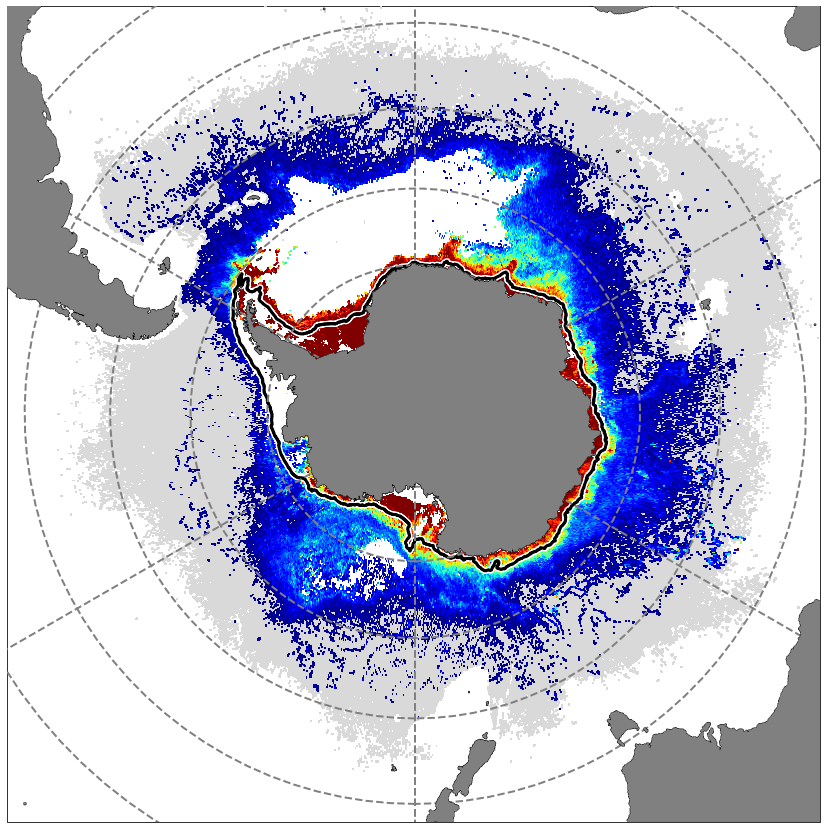

In [21]:
cmin,cmax = 5,200
npts_here = sum(AABW_shallower_than_EZD_plus_CDW_MLS_OFF)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d_MLS_OFF[1][1:]+hist2d_MLS_OFF[1][:-1])/2,(hist2d_MLS_OFF[2][1:]+hist2d_MLS_OFF[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_pts_MLS_OFF[0] < npts_here/100, hist2d_MLS_OFF[0])
hist2d_masked_2 = np.ma.masked_where((hist2d_masked/hist2d_pts_MLS_OFF[0])<5, hist2d_masked)
#hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
plt.pcolormesh(xbins,ybins,(hist2d_masked_2/hist2d_pts_MLS_OFF[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())
#ax.colorbar()

plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts_MLS_OFF[0]).T,cmap='tab20c_r',vmax=0,zorder=4,
              transform=ccrs.PlateCarree())


# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('MLS_OFF_Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

### Plot the Particle . Day plot

In [54]:
PARZ_threshold = 0.433

# Euphotic residence PDF + Backwards PDF
# Visualization
# Global first
part_inds = AABW_inds #AABW_shallower_than_EZD
inds_here1 = var_in_arrs_1_MLS_OFF['PARZ'][CDW_inds_MLS_OFF]>0.433
res_map_x = np.ravel(var_in_arrs_1_MLS_OFF['x'][AABW_inds_MLS_OFF][CDW_inds_MLS_OFF][inds_here1])
res_map_y = np.ravel(var_in_arrs_1_MLS_OFF['y'][AABW_inds_MLS_OFF][CDW_inds_MLS_OFF][inds_here1])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_1 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

inds_here2 = var_in_arrs_2_MLS_OFF['PARZ'][CDW_inds_MLS_OFF]>0.433
res_map_x = np.ravel(var_in_arrs_2_MLS_OFF['x'][AABW_inds_MLS_OFF][CDW_inds_MLS_OFF][inds_here2])
res_map_y = np.ravel(var_in_arrs_2_MLS_OFF['y'][AABW_inds_MLS_OFF][CDW_inds_MLS_OFF][inds_here2])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_2 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

inds_here3 = var_in_arrs_3_MLS_OFF['PARZ'][CDW_inds_MLS_OFF][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)]>0.433
res_map_x = np.ravel(var_in_arrs_3_MLS_OFF['x'][AABW_inds_MLS_OFF][CDW_inds_MLS_OFF][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
res_map_y = np.ravel(var_in_arrs_3_MLS_OFF['y'][AABW_inds_MLS_OFF][CDW_inds_MLS_OFF][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_3 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

hist2d_pts_95_06 = hist2d_pts_1[0]*5 + hist2d_pts_2[0]*5 + hist2d_pts_3[0]*5

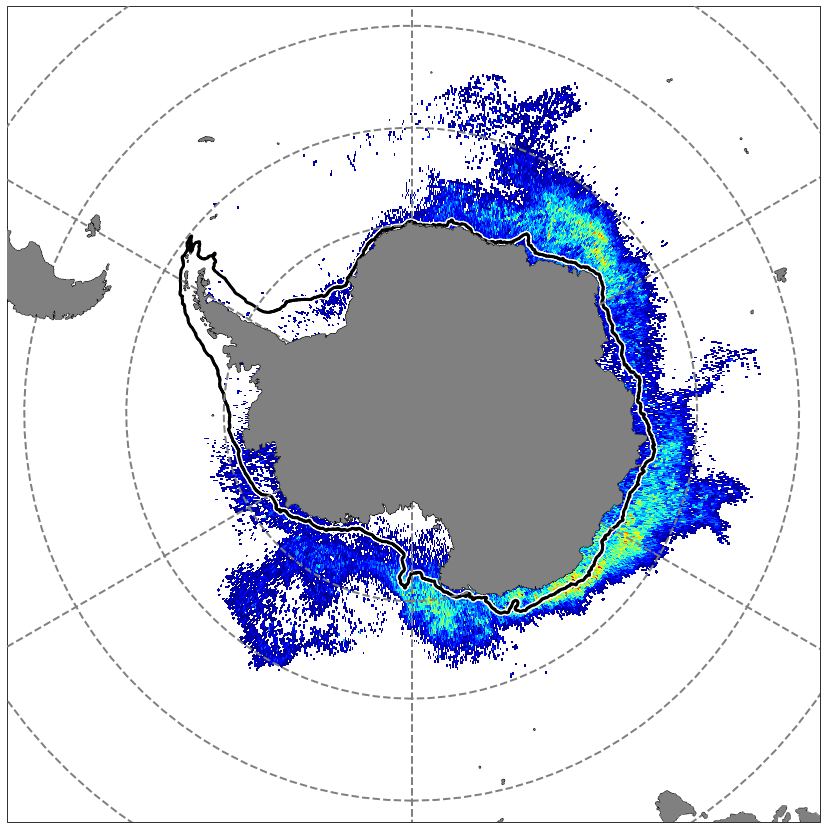

In [55]:
cmin,cmax = 40,400
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=hist2d_pts_1[1:]

ffmsk = hist2d_pts_95_06.T

#ffmsk[ffmsk<(0.5/1000)*sum(CDW_inds)] = np.nan
ffmsk[ffmsk<40] = np.nan

plt.pcolormesh(xbins,ybins,ffmsk,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())

# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -48], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360


# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('SI_ZeuRes_Location_1995_2006_MLS_OFF_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

### For MLS_Weak Gloal sectors

In [36]:
# To get a correct 2005-2006 CS_Eu_date
var_in_arrs_1_2_MLS_Weak={}
actual_res1 = var_in_arrs_1_MLS_Weak['CS_Eu_date'] - var_in_arrs_2_MLS_Weak['CS_Eu_date'][:,::-1][:,-1][:,np.newaxis]
var_in_arrs_1_2_MLS_Weak['CS_Eu_date'] =  var_in_arrs_2_MLS_Weak['CS_Eu_date'][:,::-1] + actual_res1
#var_in_arrs_1_2_MLS_Weak['datetime'] = var_in_arrs_1_MLS_Weak['datetime']

In [39]:
%%time
res_map_x = np.ravel(np.concatenate((var_in_arrs_3_MLS_Weak['x'][AABW_inds_MLS_Weak][AABW_shallower_than_EZD_plus_CDW_MLS_Weak],var_in_arrs_2_MLS_Weak['x'][AABW_inds_MLS_Weak][AABW_shallower_than_EZD_plus_CDW_MLS_Weak],var_in_arrs_1_MLS_Weak['x'][AABW_inds_MLS_Weak][AABW_shallower_than_EZD_plus_CDW_MLS_Weak]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_3_MLS_Weak['y'][AABW_inds_MLS_Weak][AABW_shallower_than_EZD_plus_CDW_MLS_Weak],var_in_arrs_2_MLS_Weak['y'][AABW_inds_MLS_Weak][AABW_shallower_than_EZD_plus_CDW_MLS_Weak],var_in_arrs_1_MLS_Weak['y'][AABW_inds_MLS_Weak][AABW_shallower_than_EZD_plus_CDW_MLS_Weak]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_3_MLS_Weak['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_Weak],var_in_arrs_2_MLS_Weak['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_Weak],var_in_arrs_1_2_MLS_Weak['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW_MLS_Weak]),axis=1),order='C')

hist2d_MLS_Weak = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
hist2d_pts_MLS_Weak = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

CPU times: user 3.92 s, sys: 2.01 s, total: 5.93 s
Wall time: 5.93 s


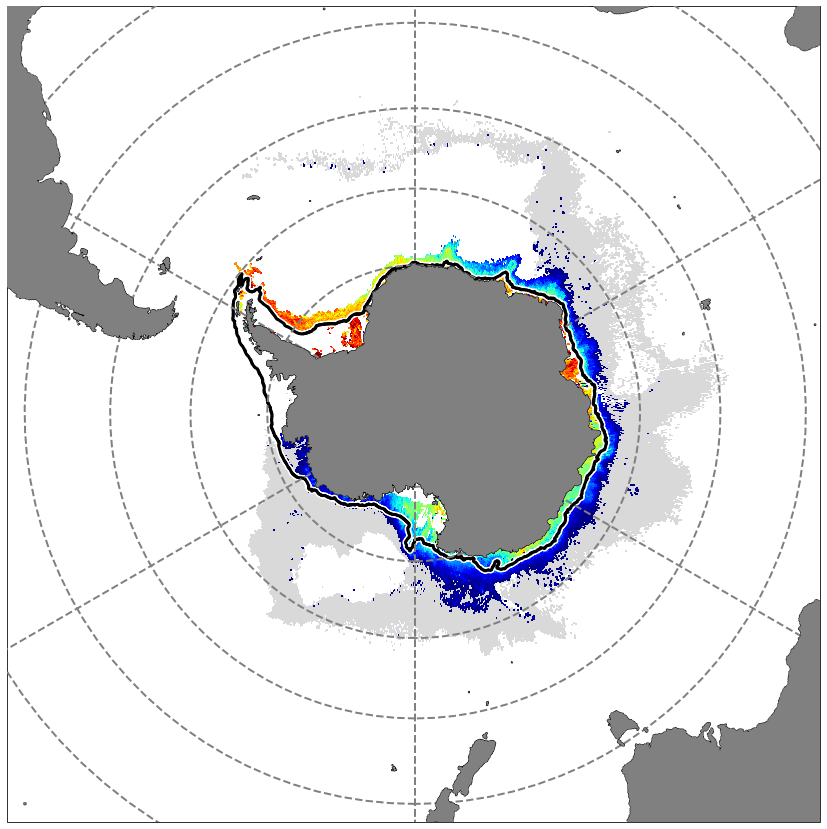

In [38]:
cmin,cmax = 5,200
npts_here = sum(AABW_shallower_than_EZD_plus_CDW_MLS_Weak)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d_MLS_Weak[1][1:]+hist2d_MLS_Weak[1][:-1])/2,(hist2d_MLS_Weak[2][1:]+hist2d_MLS_Weak[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_pts_MLS_Weak[0] < npts_here/100, hist2d_MLS_Weak[0])
hist2d_masked_2 = np.ma.masked_where((hist2d_masked/hist2d_pts_MLS_Weak[0])<5, hist2d_masked)
#hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
plt.pcolormesh(xbins,ybins,(hist2d_masked_2/hist2d_pts_MLS_Weak[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())
#ax.colorbar()

plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts_MLS_Weak[0]).T,cmap='tab20c_r',vmax=0,zorder=4,
              transform=ccrs.PlateCarree())


# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('MLS_Weak_Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

AABW_inds_MLS_Weak### Plot the Particle . Day plot

In [18]:
PARZ_threshold = 0.433

# Euphotic residence PDF + Backwards PDF
# Visualization
# Global first
part_inds = AABW_inds_MLS_Weak #AABW_shallower_than_EZD
inds_here1 = var_in_arrs_1_MLS_Weak['PARZ'][CDW_inds_MLS_Weak]>0.433
res_map_x = np.ravel(var_in_arrs_1_MLS_Weak['x'][AABW_inds_MLS_Weak][CDW_inds_MLS_Weak][inds_here1])
res_map_y = np.ravel(var_in_arrs_1_MLS_Weak['y'][AABW_inds_MLS_Weak][CDW_inds_MLS_Weak][inds_here1])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_1 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

inds_here2 = var_in_arrs_2_MLS_Weak['PARZ'][CDW_inds_MLS_Weak]>0.433
res_map_x = np.ravel(var_in_arrs_2_MLS_Weak['x'][AABW_inds_MLS_Weak][CDW_inds_MLS_Weak][inds_here2])
res_map_y = np.ravel(var_in_arrs_2_MLS_Weak['y'][AABW_inds_MLS_Weak][CDW_inds_MLS_Weak][inds_here2])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_2 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

inds_here3 = var_in_arrs_3_MLS_Weak['PARZ'][CDW_inds_MLS_Weak][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)]>0.433
res_map_x = np.ravel(var_in_arrs_3_MLS_Weak['x'][AABW_inds_MLS_Weak][CDW_inds_MLS_Weak][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
res_map_y = np.ravel(var_in_arrs_3_MLS_Weak['y'][AABW_inds_MLS_Weak][CDW_inds_MLS_Weak][:,var_in_arrs_3['datetime']>dt.datetime(1995,1,1)][inds_here3])
res_map_z = np.ones(res_map_y.shape)
hist2d_pts_3 = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

hist2d_pts_95_06 = hist2d_pts_1[0]*5 + hist2d_pts_2[0]*5 + hist2d_pts_3[0]*5

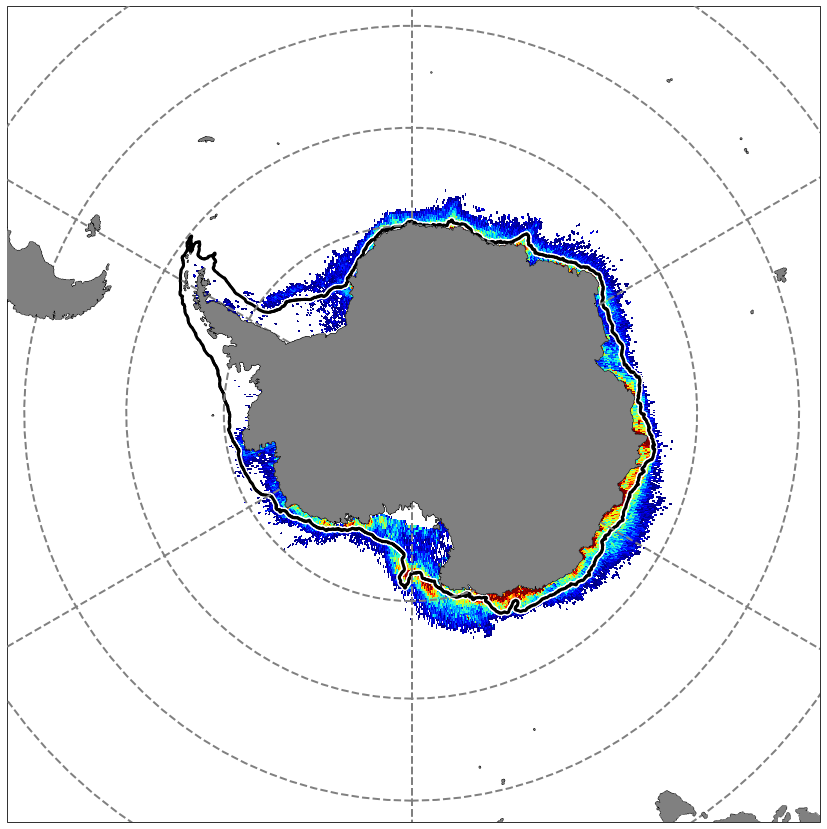

In [19]:
cmin,cmax = 40,400
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=hist2d_pts_1[1:]

ffmsk = hist2d_pts_95_06.T

#ffmsk[ffmsk<(0.5/1000)*sum(CDW_inds)] = np.nan
ffmsk[ffmsk<40] = np.nan

plt.pcolormesh(xbins,ybins,ffmsk,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())

# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -48], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360


# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('SI_ZeuRes_Location_1995_2006_MLS_Weak_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

#

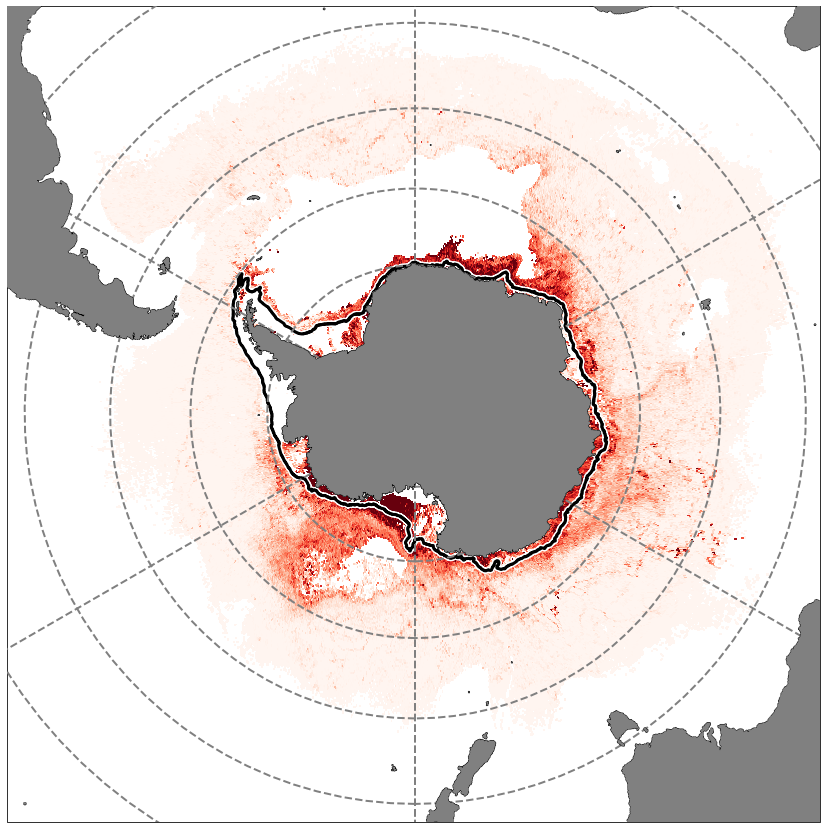

In [34]:
cmin,cmax = 0,200
npts_here = sum(AABW_shallower_than_EZD_plus_CDW_MLS_OFF)
npts_here_1 = sum(AABW_shallower_than_EZD_plus_CDW)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d_MLS_OFF[1][1:]+hist2d_MLS_OFF[1][:-1])/2,(hist2d_MLS_OFF[2][1:]+hist2d_MLS_OFF[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_pts_MLS_OFF[0] < npts_here/100, hist2d_MLS_OFF[0])


hist2d_masked_1 = np.ma.masked_where(hist2d_pts[0] < npts_here_1/100, hist2d[0])


#hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts_MLS_OFF[0] - hist2d_masked_1/hist2d_pts[0]).T,cmap='Reds',vmax=100,vmin=0,zorder=5,
              transform=ccrs.PlateCarree())
#ax.colorbar()


# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('MLS_ON_OFF_Diff_Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

## Comparsion in between MLS ON/ OFF and Weak

In [ ]:
# Create a 3x1 subplot grid
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4), gridspec_kw={"width_ratios": [1], "height_ratios": [1],"wspace": 0.0})


In [61]:
sum(AABW_inds),sum(CDW_inds),sum(AABW_shallower_than_EZD_plus_CDW)


(94123, 88809, 36161)

In [66]:
sum(var_in_arrs_0['CS_Eu_date'][:,-1]>0)

41013

In [62]:
sum(AABW_inds_MLS_Weak),sum(CDW_inds_MLS_Weak),sum(AABW_shallower_than_EZD_plus_CDW_MLS_Weak)

(92523, 83283, 21474)

In [65]:
sum(var_in_arrs_0_MLS_Weak['CS_Eu_date'][:,-1]>0)

29836

In [63]:
sum(AABW_inds_MLS_OFF),sum(CDW_inds_MLS_OFF),sum(AABW_shallower_than_EZD_plus_CDW_MLS_OFF)

(91637, 84971, 15509)

In [67]:
sum(var_in_arrs_0_MLS_OFF['CS_Eu_date'][:,-1]>0)

20485

### Exploreing what happened for 0-60days residence MLS OFF particles

In [39]:
MLS_OFF_FirstPeak_inds = ((var_in_arrs_0_MLS_OFF['CS_Eu_date'][:,-1]<60) & AABW_shallower_than_EZD_plus_CDW_MLS_OFF)

In [41]:
sum(MLS_OFF_FirstPeak_inds)

3422

In [42]:
%%time
res_map_x = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['x'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds],var_in_arrs_3_MLS_OFF['x'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds],var_in_arrs_2_MLS_OFF['x'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds],var_in_arrs_1_MLS_OFF['x'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['y'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds],var_in_arrs_3_MLS_OFF['y'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds],var_in_arrs_2_MLS_OFF['y'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds],var_in_arrs_1_MLS_OFF['y'][AABW_inds_MLS_OFF][MLS_OFF_FirstPeak_inds]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['CS_Eu_date'][MLS_OFF_FirstPeak_inds],var_in_arrs_3_MLS_OFF['CS_Eu_date'][MLS_OFF_FirstPeak_inds],var_in_arrs_2_MLS_OFF['CS_Eu_date'][MLS_OFF_FirstPeak_inds],var_in_arrs_1_MLS_OFF['CS_Eu_date'][MLS_OFF_FirstPeak_inds]),axis=1),order='C')

hist2d_MLS_OFF_FirstPeak = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
hist2d_pts_MLS_OFF_FirstPeak = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

CPU times: user 3.65 s, sys: 16.9 s, total: 20.6 s
Wall time: 1min 11s
Parser   : 392 ms


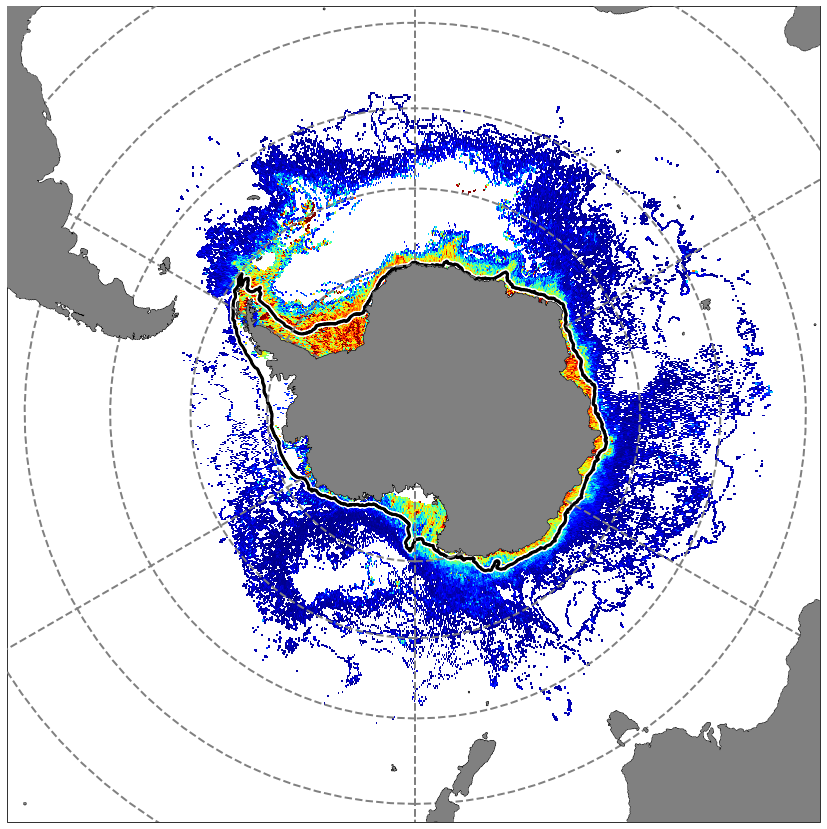

In [46]:
cmin,cmax = 0,30
npts_here = sum(MLS_OFF_FirstPeak_inds)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d_MLS_OFF_FirstPeak[1][1:]+hist2d_MLS_OFF_FirstPeak[1][:-1])/2,(hist2d_MLS_OFF_FirstPeak[2][1:]+hist2d_MLS_OFF_FirstPeak[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_MLS_OFF_FirstPeak[0] < npts_here/100, hist2d_MLS_OFF_FirstPeak[0])
#hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts_MLS_OFF_FirstPeak[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())
#ax.colorbar()


# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('MLS_OFF_FirstPeak_Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

In [48]:
%%time
res_map_x = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['x'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds],var_in_arrs_3_MLS_OFF['x'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds],var_in_arrs_2_MLS_OFF['x'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds],var_in_arrs_1_MLS_OFF['x'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['y'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds],var_in_arrs_3_MLS_OFF['y'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds],var_in_arrs_2_MLS_OFF['y'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds],var_in_arrs_1_MLS_OFF['y'][AABW_inds_MLS_OFF][~MLS_OFF_FirstPeak_inds]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4_MLS_OFF['CS_Eu_date'][~MLS_OFF_FirstPeak_inds],var_in_arrs_3_MLS_OFF['CS_Eu_date'][~MLS_OFF_FirstPeak_inds],var_in_arrs_2_MLS_OFF['CS_Eu_date'][~MLS_OFF_FirstPeak_inds],var_in_arrs_1_MLS_OFF['CS_Eu_date'][~MLS_OFF_FirstPeak_inds]),axis=1),order='C')

hist2d_MLS_OFF_Rest_of_FirstPeak = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
hist2d_pts_MLS_OFF_Rest_of_FirstPeak = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])

CPU times: user 29.6 s, sys: 1min 4s, total: 1min 33s
Wall time: 1min 40s


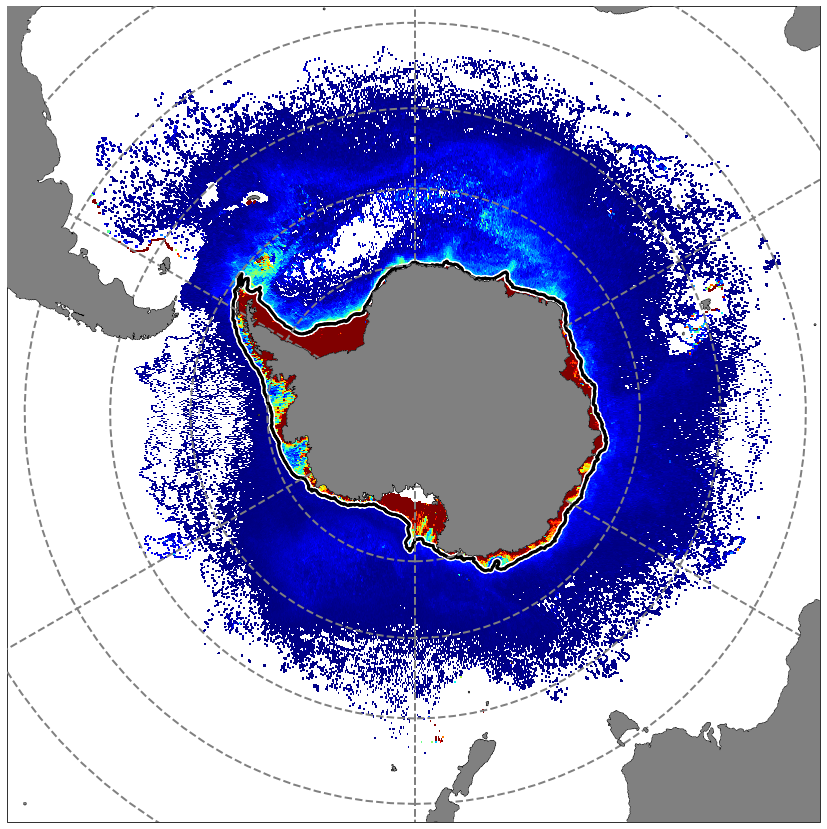

In [49]:
cmin,cmax = 0,200
npts_here = sum(~MLS_OFF_FirstPeak_inds)
fig = plt.figure(num=1,figsize=(15,15))
ax = plt.subplot(projection=ccrs.SouthPolarStereo())

c_min,c_max = cmin,cmax
levels = np.arange(cmin,cmax)

xbins,ybins=(hist2d_MLS_OFF_Rest_of_FirstPeak[1][1:]+hist2d_MLS_OFF_Rest_of_FirstPeak[1][:-1])/2,(hist2d_MLS_OFF_Rest_of_FirstPeak[2][1:]+hist2d_MLS_OFF_Rest_of_FirstPeak[2][:-1])/2

hist2d_masked = np.ma.masked_where(hist2d_MLS_OFF_Rest_of_FirstPeak[0] < npts_here/100, hist2d_MLS_OFF_Rest_of_FirstPeak[0])
#hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts_MLS_OFF_Rest_of_FirstPeak[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
              transform=ccrs.PlateCarree())
#ax.colorbar()


# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())
#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

# Add contour for specific region
xt_ocean_cc_1 = np.copy(xt_ocean_cc)
xt_ocean_cc_1[xt_ocean_cc_1<0] += 360
'''
for  sector in ['Prydz_Bay','Adelie_Coast','Ross_Sea','Weddell_Sea']:  
    
    if sector == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc_1>60) & (xt_ocean_cc_1<79.9)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        xt_ind = (xt_ocean_cc_1>80.1) & (xt_ocean_cc_1<100)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'green', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
        ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)

    else:
        if sector == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc_1>122) & (xt_ocean_cc_1<158)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'purple', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Ross_Sea':
            xt_ind = (xt_ocean_cc_1>158) & (xt_ocean_cc_1<200)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'blue', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
        elif sector == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc_1>293) & (xt_ocean_cc_1<340)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3*1.5)
            ax.contour(xt_ocean_cc_1[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5*1.5)
'''    

# Add grid lines
ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

#
#plt.title(title)
plt.savefig('MLS_OFF_Rest_of_the_FirstPeak_Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
plt.show()

## For CDW+Euphotic>0 only but 4 sectors

In [55]:
print('point munber along contour:',933504/(12*13))
region_no = (np.array(list(np.arange(1,5985))*13*12)/300).astype(int)+1
wedd_ind =  (region_no<=15) & (region_no>=12)
wedd_ind = wedd_ind[AABW_inds]
print('wedd_ind',sum(wedd_ind))
prydz_ind =  (region_no==20) | (region_no==1)
prydz_ind = prydz_ind[AABW_inds]
print('prydz_ind',sum(prydz_ind))
adelie_ind =  (region_no<=4) & (region_no>=3)
adelie_ind = adelie_ind[AABW_inds]
print('adelie_ind',sum(adelie_ind))
ross_ind =  (region_no<=7) & (region_no>=5)
ross_ind = ross_ind[AABW_inds]
print('ross_ind',sum(ross_ind))

point munber along contour: 5984.0
wedd_ind 22377
prydz_ind 11630
adelie_ind 18886
ross_ind 37312


In [56]:
print('wedd_ind',sum(wedd_ind & CDW_inds))
print('prydz_ind',sum(prydz_ind & CDW_inds))
print('adelie_ind',sum(adelie_ind & CDW_inds))
print('ross_ind',sum(ross_ind & CDW_inds))

wedd_ind 20161
prydz_ind 10809
adelie_ind 18241
ross_ind 35857


In [57]:
sum(wedd_ind & CDW_inds)+sum(prydz_ind & CDW_inds)+sum(adelie_ind & CDW_inds)+sum(ross_ind & CDW_inds)

85068

In [58]:
sum(wedd_ind )+sum(prydz_ind )+sum(adelie_ind  )+sum(ross_ind  )

90205

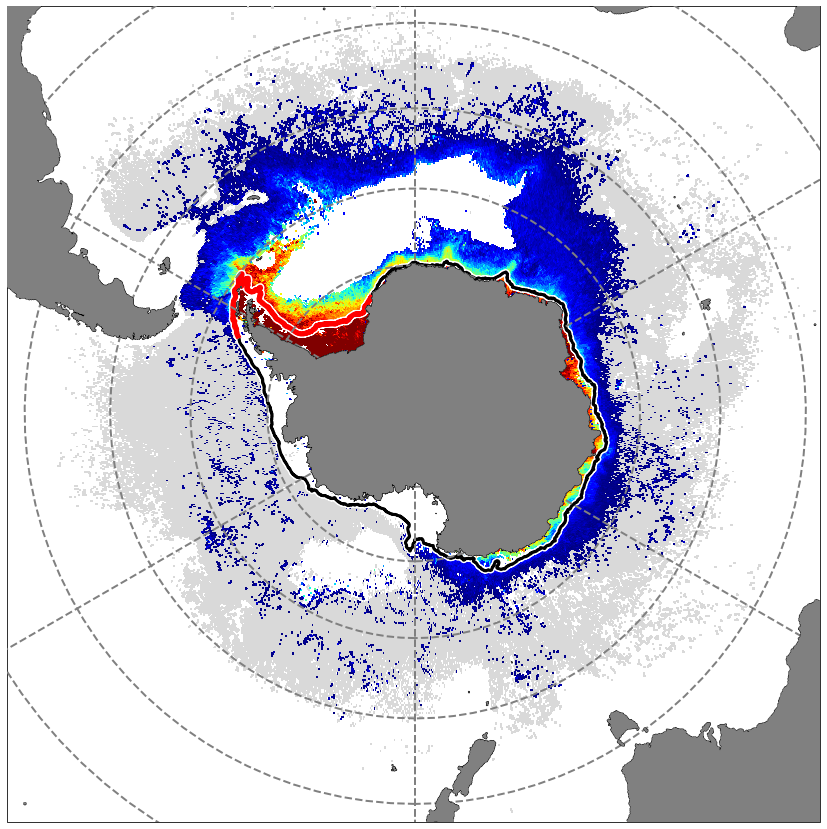

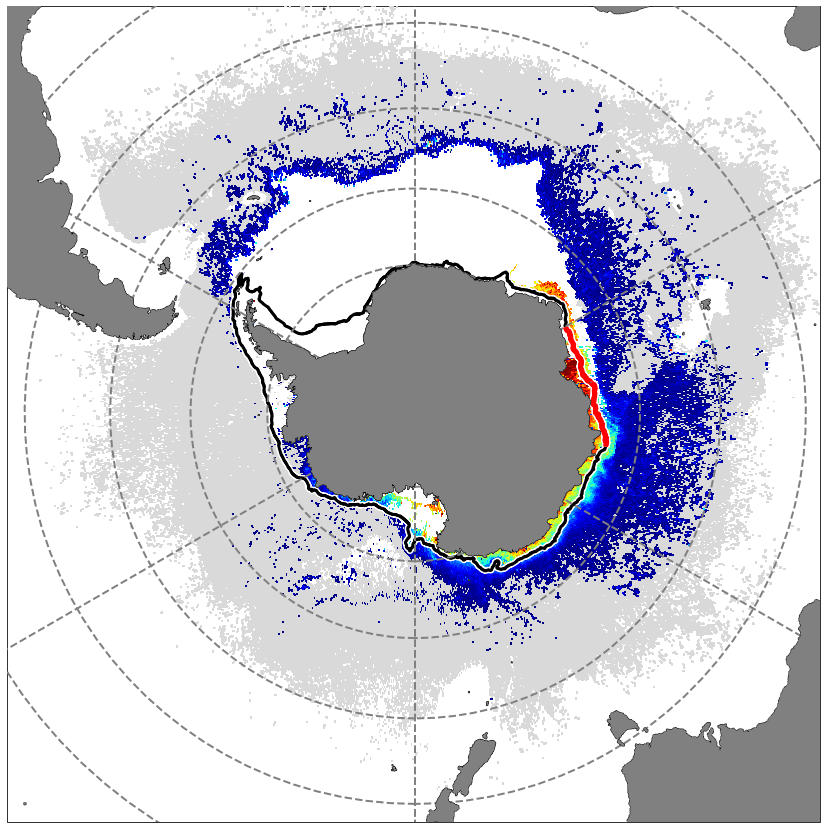

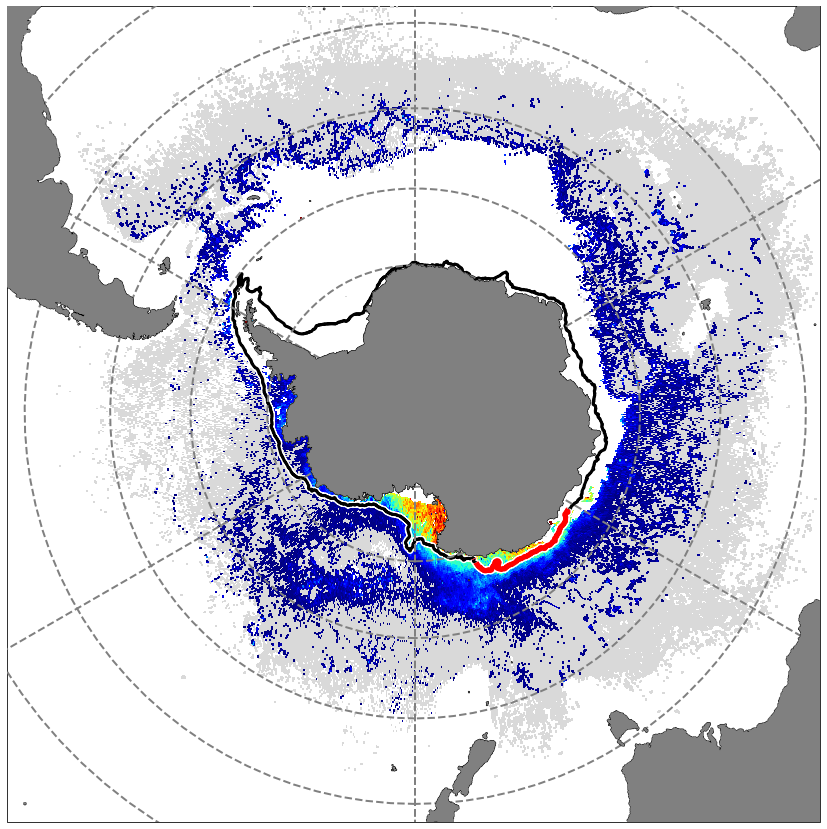

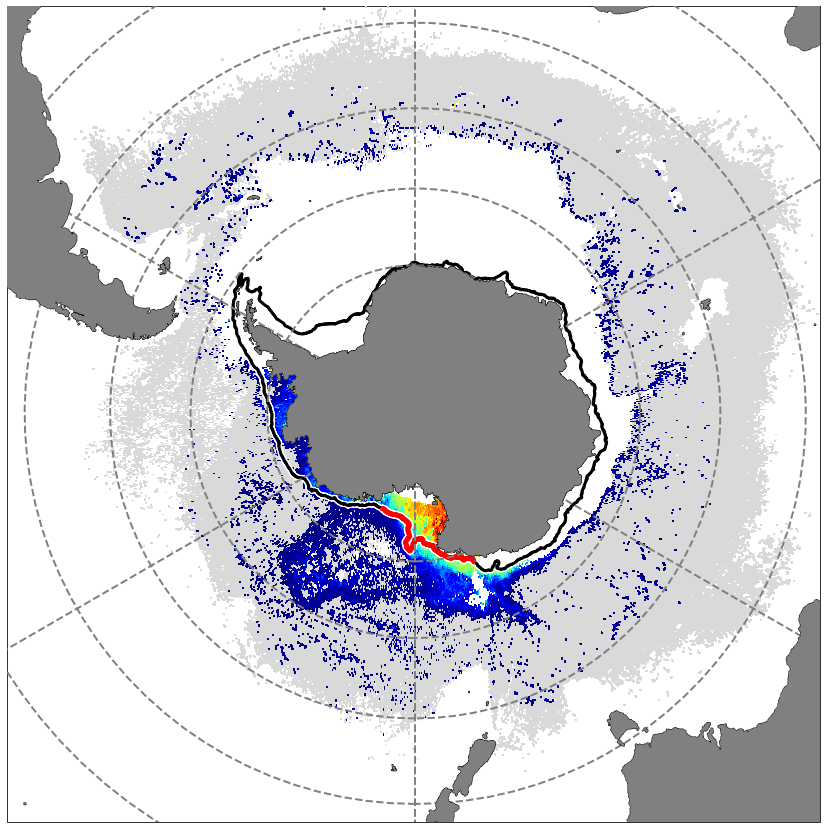

CPU times: user 2min 2s, sys: 12.8 s, total: 2min 15s
Wall time: 2min 15s


In [77]:
%%time
strs = ['Weddell_Sea','Prydz_Bay','Adelie_Coast','Ross_Sea']
i=0
for inds_here in  [wedd_ind,prydz_ind,adelie_ind,ross_ind]:
    npts_here = sum(AABW_shallower_than_EZD_plus_CDW & inds_here)
    
    res_map_x = np.ravel(np.concatenate((var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    res_map_y = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    res_map_z = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    
    

    hist2d = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
    hist2d_pts = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])
    
    cmin,cmax = 5,200

    fig = plt.figure(num=1,figsize=(15, 15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_min,c_max = cmin,cmax
    levels = np.arange(cmin,cmax)

    xbins,ybins=(hist2d[1][1:]+hist2d[1][:-1])/2,(hist2d[2][1:]+hist2d[2][:-1])/2

    hist2d_masked = np.ma.masked_where(hist2d_pts[0] < npts_here/100, hist2d[0])
    hist2d_masked_2 = np.ma.masked_where((hist2d_masked/hist2d_pts[0])<5, hist2d_masked)
    #hist2d_masked = np.ma.masked_where(hist2d_pts[0] < 0, hist2d[0])
    plt.pcolormesh(xbins,ybins,(hist2d_masked_2/hist2d_pts[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()

    plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts[0]).T,cmap='tab20c_r',vmax=0,zorder=4,
                  transform=ccrs.PlateCarree())


    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -38], ccrs.PlateCarree())

    #Add 1000m isobath
    contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=6)
    contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=3)

    '''
    # Add initial position
    final_y = var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]
    final_x = var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]

    final_pts = np.histogram2d(final_x,final_y,bins=[np.arange(0,361,3),np.arange(-80,-29,3)])
    xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2
    final_pts_masked = np.ma.masked_where(final_pts[0] < npts_here/1000, final_pts[0])
    plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0.1,vmax=100,cmap='jet',alpha=0.5,transform=ccrs.PlateCarree(),zorder=6)
    '''
    
    # Add contour for specific region
    mem = np.copy(xt_ocean_cc)
    xt_ocean_cc[xt_ocean_cc<0] += 360
    if strs[i] == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc>60) & (xt_ocean_cc<79.9)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=5)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=8)
        xt_ind = (xt_ocean_cc>80.1) & (xt_ocean_cc<100)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=5)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=8)
    
    else:
        if strs[i] == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc>122) & (xt_ocean_cc<158)
        elif strs[i] == 'Ross_Sea':
            xt_ind = (xt_ocean_cc>158) & (xt_ocean_cc<200)
        elif strs[i] == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc>293) & (xt_ocean_cc<340)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=5)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=8)
    xt_ocean_cc = mem
    del mem

    # Add grid lines
    ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

    #
    #plt.title(title)
    plt.savefig('Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+strs[i]+'.png',format='png',dpi=300)
    plt.show()
    
    i+=1
    

### The same 4 sectors for CDW+Euphotic>0 pts BUT Mercator projection

The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.


OSError: [Errno 122] Disk quota exceeded

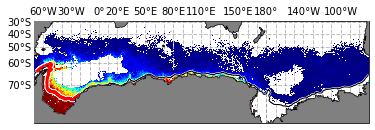

In [60]:
%%time
import cartopy.feature as cfeature
strs = ['Weddell_Sea','Prydz_Bay','Adelie_Coast','Ross_Sea']
center_list = [110,110,110,110]#[110,220,120,120]
i=0
for inds_here in  [wedd_ind,prydz_ind,adelie_ind,ross_ind]:
    npts_here = sum(AABW_shallower_than_EZD_plus_CDW & inds_here)
    
    res_map_x = np.ravel(np.concatenate((var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    res_map_y = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    res_map_z = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    
    

    hist2d = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
    hist2d_pts = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])
    
    cmin,cmax = 0,200

    

    fig = plt.figure(num=1,figsize=(6,2))
    # Create a map using Mercator projection
    ax = plt.axes(projection=ccrs.Mercator(central_longitude=center_list[i], min_latitude=-80, max_latitude=-29, globe=None))

    # Set the longitude range
    #ax.set_extent([-180, 180, -80, -29], crs=ccrs.PlateCarree())

    # Add coastlines and country borders
    ax.add_feature(cfeature.COASTLINE)

    # Add grid lines and labels
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', xlocs=range(-180, 190, 10), ylocs=range(-80, -20, 10))
    gl.top_labels = True
    gl.bottom_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'fontsize': 10}
    gl.ylabel_style = {'fontsize': 10}
    #-------------------------------------------------------------------------------------------------------------------------
    c_min,c_max = cmin,cmax
    levels = np.arange(cmin,cmax)

    xbins,ybins=(hist2d[1][1:]+hist2d[1][:-1])/2,(hist2d[2][1:]+hist2d[2][:-1])/2

    hist2d_masked = np.ma.masked_where(hist2d_pts[0] < npts_here/100, hist2d[0])
    plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()


    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean


    #Add 1000m isobath
    contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=2)
    contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=1)

    '''
    # Add initial position
    final_y = var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]
    final_x = var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]

    final_pts = np.histogram2d(final_x,final_y,bins=[np.arange(0,361,3),np.arange(-80,-29,3)])
    xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2
    final_pts_masked = np.ma.masked_where(final_pts[0] < npts_here/1000, final_pts[0])
    plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0.1,vmax=100,cmap='jet',alpha=0.5,transform=ccrs.PlateCarree(),zorder=6)
    '''
    
    # Add contour for specific region
    mem = np.copy(xt_ocean_cc)
    xt_ocean_cc[xt_ocean_cc<0] += 360
    if strs[i] == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc>60) & (xt_ocean_cc<79.9)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
        xt_ind = (xt_ocean_cc>80.1) & (xt_ocean_cc<100)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
    
    else:
        if strs[i] == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc>122) & (xt_ocean_cc<158)
        elif strs[i] == 'Ross_Sea':
            xt_ind = (xt_ocean_cc>158) & (xt_ocean_cc<200)
        elif strs[i] == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc>293) & (xt_ocean_cc<340)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
    xt_ocean_cc = mem
    del mem


    #
    #plt.title(title)
    plt.savefig('Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+strs[i]+'Mercator_proj.png',format='png',dpi=300)
    plt.show()
    
    i+=1
    

### The same 4 sectors for CDW+Euphotic>0 pts BUT Mercator projection
 With the initial locations
长方形PDF图

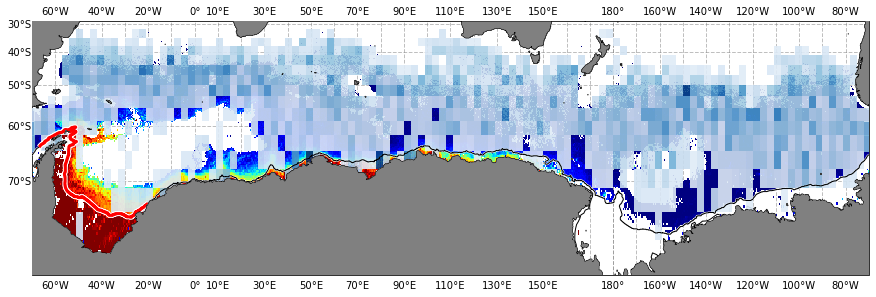

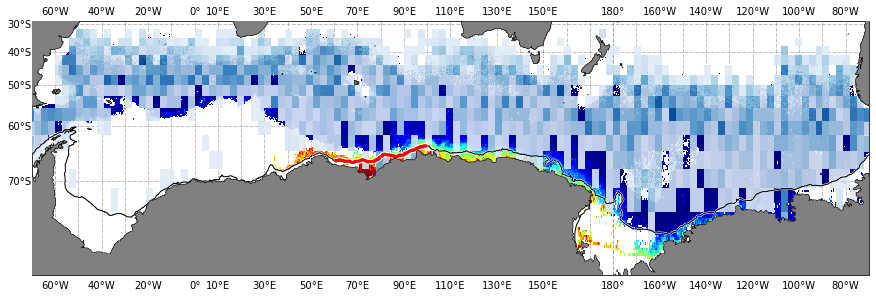

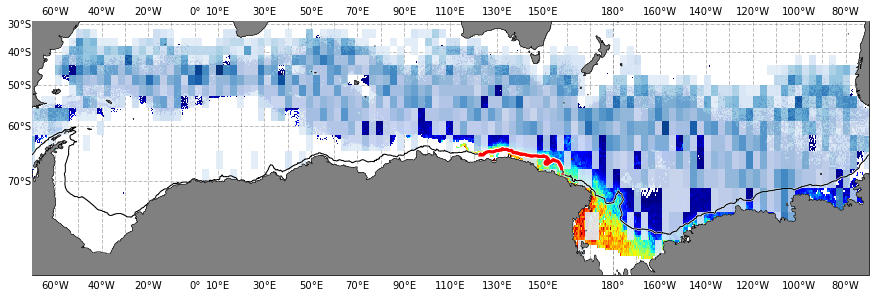

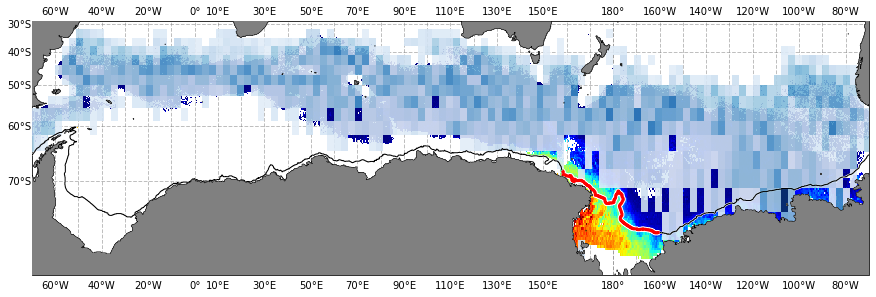

CPU times: user 3min 25s, sys: 19.7 s, total: 3min 44s
Wall time: 3min 45s


In [16]:
%%time
import cartopy.feature as cfeature
strs = ['Weddell_Sea','Prydz_Bay','Adelie_Coast','Ross_Sea']
center_list = [110,110,110,110]
i=0
for inds_here in  [wedd_ind,prydz_ind,adelie_ind,ross_ind]:
    npts_here = sum(AABW_shallower_than_EZD_plus_CDW & inds_here)
    
    res_map_x = np.ravel(np.concatenate((var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    res_map_y = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    res_map_z = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_3['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_2['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here],var_in_arrs_1['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW & inds_here]),axis=1),order='C')
    
    

    hist2d = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)],weights=res_map_z)
    hist2d_pts = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(0,360.25,0.25),np.arange(-80,-29.75,0.25)])
    
    cmin,cmax = 0,200

    

    fig = plt.figure(num=1,figsize=(15,15))
    # Create a map using Mercator projection
    ax = plt.axes(projection=ccrs.Mercator(central_longitude=center_list[i], min_latitude=-80, max_latitude=-29, globe=None))

    # Set the longitude range
    #ax.set_extent([-180, 180, -80, -29], crs=ccrs.PlateCarree())

    # Add coastlines and country borders
    ax.add_feature(cfeature.COASTLINE)

    # Add grid lines and labels
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', xlocs=range(-180, 190, 10), ylocs=range(-80, -20, 10))
    gl.top_labels = True
    gl.right_labels = False
    #-------------------------------------------------------------------------------------------------------------------------
    c_min,c_max = cmin,cmax
    levels = np.arange(cmin,cmax)

    xbins,ybins=(hist2d[1][1:]+hist2d[1][:-1])/2,(hist2d[2][1:]+hist2d[2][:-1])/2

    hist2d_masked = np.ma.masked_where(hist2d_pts[0] < npts_here/100, hist2d[0])
    plt.pcolormesh(xbins,ybins,(hist2d_masked/hist2d_pts[0]).T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()


    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean


    #Add 1000m isobath
    contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=2)
    contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=1)

    
    # Add initial position
    final_y = var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]
    final_x = var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]

    final_pts = np.histogram2d(final_x,final_y,bins=[np.arange(0,361,3),np.arange(-80,-29,3)])
    xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2
    final_pts_masked = np.ma.masked_where(final_pts[0] < 3*npts_here/10000, final_pts[0])
    plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Blues',alpha=0.9,transform=ccrs.PlateCarree(),zorder=6)
    
    
    # Add contour for specific region
    mem = np.copy(xt_ocean_cc)
    xt_ocean_cc[xt_ocean_cc<0] += 360
    if strs[i] == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc>60) & (xt_ocean_cc<79.9)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
        xt_ind = (xt_ocean_cc>80.1) & (xt_ocean_cc<100)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
    
    else:
        if strs[i] == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc>122) & (xt_ocean_cc<158)
        elif strs[i] == 'Ross_Sea':
            xt_ind = (xt_ocean_cc>158) & (xt_ocean_cc<200)
        elif strs[i] == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc>293) & (xt_ocean_cc<340)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
    xt_ocean_cc = mem
    del mem


    #
    #plt.title(title)
    plt.savefig('Mean_accumulated_Euphotic_zone_residence_2005-2019_cRange_'+str(cmin)+'_'+str(cmax)+strs[i]+'Mercator_proj_with_init_loc.png',format='png',dpi=300)
    plt.show()
    
    i+=1
    

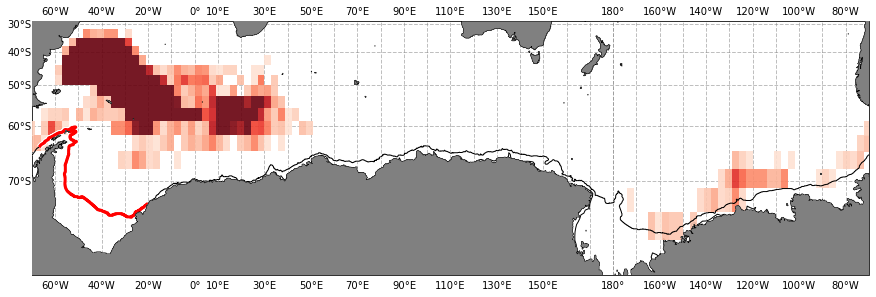

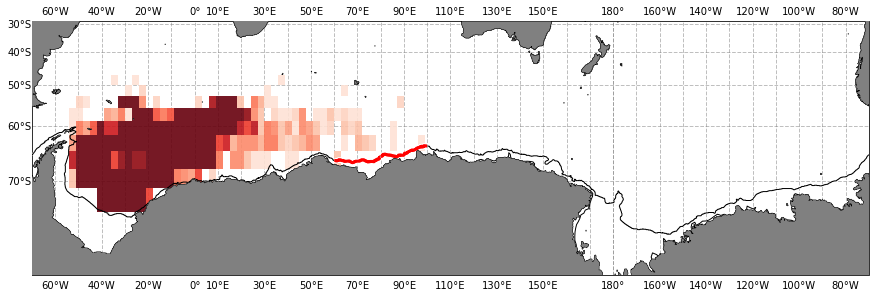

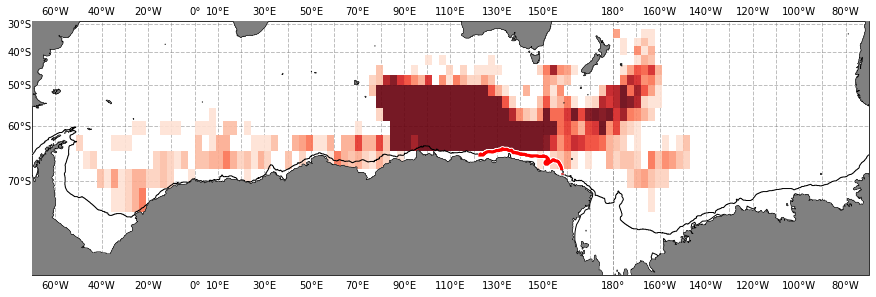

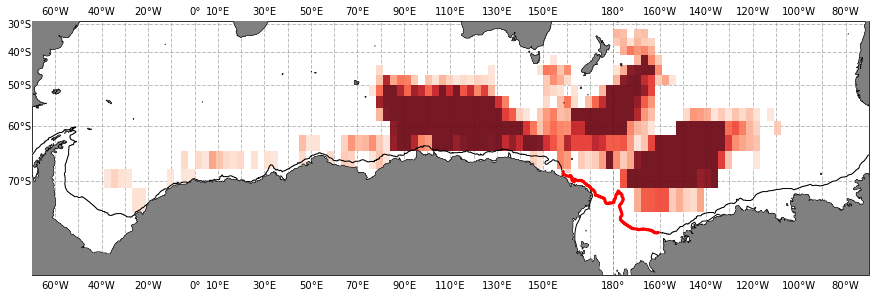

CPU times: user 3min 18s, sys: 45.6 s, total: 4min 4s
Wall time: 4min 8s


In [18]:
%%time
import cartopy.feature as cfeature
strs = ['Weddell_Sea','Prydz_Bay','Adelie_Coast','Ross_Sea']
center_list = [110,110,110,110]
i=0
for inds_here in  [wedd_ind,prydz_ind,adelie_ind,ross_ind]:
    npts_here = sum(AABW_shallower_than_EZD_plus_CDW & inds_here)


    

    fig = plt.figure(num=1,figsize=(15,15))
    # Create a map using Mercator projection
    ax = plt.axes(projection=ccrs.Mercator(central_longitude=center_list[i], min_latitude=-80, max_latitude=-29, globe=None))

    # Set the longitude range
    #ax.set_extent([-180, 180, -80, -29], crs=ccrs.PlateCarree())

    # Add coastlines and country borders
    ax.add_feature(cfeature.COASTLINE)

    # Add grid lines and labels
    gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', xlocs=range(-180, 190, 10), ylocs=range(-80, -20, 10))
    gl.top_labels = True
    gl.right_labels = False
    #-------------------------------------------------------------------------------------------------------------------------

    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean


    #Add 1000m isobath
    contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=2)
    contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=1)

    
    # Add initial position
    final_y = var_in_arrs_0['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]
    final_x = var_in_arrs_0['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW & inds_here][:,-1]

    final_pts = np.histogram2d(final_x,final_y,bins=[np.arange(0,361,3),np.arange(-80,-29,3)])
    xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2
    final_pts_masked = np.ma.masked_where(final_pts[0] < 3*npts_here/10000, final_pts[0])
    plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Reds',alpha=0.9,transform=ccrs.PlateCarree(),zorder=6)
    
    
    # Add contour for specific region
    mem = np.copy(xt_ocean_cc)
    xt_ocean_cc[xt_ocean_cc<0] += 360
    if strs[i] == 'Prydz_Bay':
        xt_ind = (xt_ocean_cc>60) & (xt_ocean_cc<79.9)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
        xt_ind = (xt_ocean_cc>80.1) & (xt_ocean_cc<100)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
    
    else:
        if strs[i] == 'Adelie_Coast':
            xt_ind = (xt_ocean_cc>122) & (xt_ocean_cc<158)
        elif strs[i] == 'Ross_Sea':
            xt_ind = (xt_ocean_cc>158) & (xt_ocean_cc<200)
        elif strs[i] == 'Weddell_Sea':
            xt_ind = (xt_ocean_cc>293) & (xt_ocean_cc<340)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'r', transform=ccrs.PlateCarree(),zorder=9,linewidths=3)
        ax.contour(xt_ocean_cc[xt_ind], yt_ocean_cc, shelf_mask.values[:,list(xt_ind)], [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=8,linewidths=5)
    xt_ocean_cc = mem
    del mem


    #
    #plt.title(title)
    plt.savefig(strs[i]+'Mercator_proj_with_final_loc.png',format='png',dpi=300)
    plt.show()
    
    i+=1
    

# YZ Plot for CDW+Euphotic>0 pts
Lat-Dep Profile

In [9]:
%%time
# Load traj files 0
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_0.npz')
var_in_arrs_0['z']   =npzfile['z']
var_in_arrs_0['T']   =npzfile['T']
var_in_arrs_0['S']   =npzfile['S']

# Load traj files 1
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_1.npz')
var_in_arrs_1['z']   =npzfile['z']
var_in_arrs_1['T']   =npzfile['T']
var_in_arrs_1['S']   =npzfile['S']

# Load traj files 3
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_3_5days_freq.npz')
var_in_arrs_3['z']   =npzfile['z']
var_in_arrs_3['T']   =npzfile['T']
var_in_arrs_3['S']   =npzfile['S']

# Load traj files 2
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_2_5days_freq.npz')
var_in_arrs_2['z']   =npzfile['z']
var_in_arrs_2['T']   =npzfile['T']
var_in_arrs_2['S']   =npzfile['S']

# Load traj files 4
# From 5days freq npz file
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/'+exp_name+'/var_in_arrs_4_5days_freq.npz')
var_in_arrs_4['z']   =npzfile['z']
var_in_arrs_4['T']   =npzfile['T']
var_in_arrs_4['S']   =npzfile['S']


CPU times: user 3min 13s, sys: 44min 49s, total: 48min 3s
Wall time: 1h 15min 51s


In [15]:
%%time
res_map_x = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')

hist2d_b = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(-80,-29.9,1/2),np.arange(0,6000,25)],weights=res_map_z)
hist2d_pts_b = np.histogram2d(res_map_x,res_map_y,bins=[np.arange(-80,-29.9,1/2),np.arange(0,6000,25)])

CPU times: user 19 s, sys: 2min 50s, total: 3min 9s
Wall time: 3min 15s


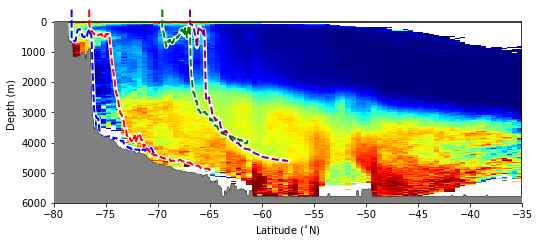

In [44]:
npt_here = sum(AABW_shallower_than_EZD_plus_CDW)

xbins,ybins=(hist2d_b[1][1:]+hist2d_b[1][:-1])/2,(hist2d_b[2][1:]+hist2d_b[2][:-1])/2

hist2d_b_masked = np.ma.masked_where(hist2d_pts_b[0] < npt_here/1000, hist2d_b[0])

plt.figure(figsize=(8.4,3.6))
plt.pcolormesh(xbins,ybins,(hist2d_b_masked/hist2d_pts_b[0]).T,vmin=0,vmax=200,cmap='jet')
#plt.colorbar()
plt.plot(yt_extend[250:675],ocean_depth_extend[250:675,750].T,'g--',linewidth=2,zorder=10)
plt.plot(yt_extend[250:675],ocean_depth_extend[250:675,750].T,'white',linewidth=4)

plt.plot(yt_extend[250:750],ocean_depth_extend[250:750,1200].T,color='purple',linewidth=2,linestyle='--',zorder=10)
plt.plot(yt_extend[250:750],ocean_depth_extend[250:750,1200].T,'white',linewidth=4)

plt.plot(yt_extend[250:470],ocean_depth_extend[250:470,2000].T,'b--',zorder=10,linewidth=2)
plt.plot(yt_extend[250:470],ocean_depth_extend[250:470,2000].T,'white',linewidth=4)

plt.plot(yt_extend[250:600],ocean_depth_extend[250:600,3300].T,'r--',zorder=10,linewidth=2)
plt.plot(yt_extend[250:600],ocean_depth_extend[250:600,3300].T,'white',linewidth=4)


ht_all = cc.querying.getvar(expt,'ht', session, n=1)
plt.plot(yt_ocean[:1150],np.nanmax(ht_all[:1150],axis=1),'k-')
plt.plot([-80,-35],[0,0],'k-')
plt.plot([-35,-35],[0,6000],'k-')


arr_max = np.ones(933)*7000
min_here = np.nanmax(ht_all[:931],axis=1)
min_here[np.isnan(min_here)]=0
arr_min = np.concatenate((np.array([0,0]),min_here))
lats = np.concatenate((np.array([-90,-81.11]),yt_ocean[:931]))
plt.fill_between(lats, arr_min, arr_max, alpha=1,color='grey',zorder=100)
plt.xlabel('Latitude ($^{\circ}$N)')
plt.ylabel('Depth (m)')



# Remove the plot outlines
plt.gca().spines['top'].set_visible(False)
#plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.ylim([6000,-500])
plt.xlim([-80,-35])
plt.savefig('Fig1_residence_PDF.png',dpi=500)


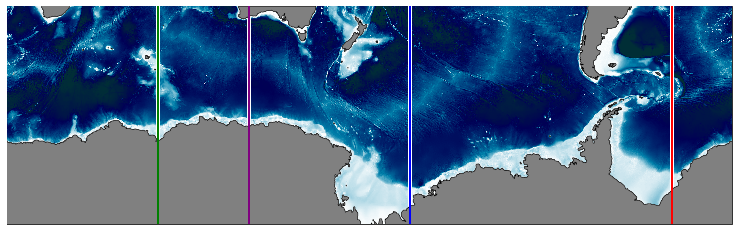

In [121]:
fig = plt.figure(num=1,figsize=(16,4))
# Create a map using Mercator projection
ax = plt.axes(projection=ccrs.Mercator(central_longitude=180, min_latitude=-80, max_latitude=-30, globe=None))

# Set the longitude range#
ax.set_extent([-180, 180, -80, -30], crs=ccrs.PlateCarree())

#
colors = ['r','green','purple','blue']
lons = [330,75,120,200]
for i in [0,1,2,3]:
    ax.plot([lons[i],lons[i]],[-90,-30],linewidth=2,color=colors[i],zorder=20, transform=ccrs.PlateCarree())
    ax.plot([lons[i],lons[i]],[-90,-30],linewidth=4,color='white',zorder=10, transform=ccrs.PlateCarree())

# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

ax.pcolormesh(xt_ocean,yt_extend[:1141],ocean_depth_extend[:1141,:],vmin=0,vmax=7000,cmap='ocean_r',transform=ccrs.PlateCarree(),zorder=9)

#Add 1000m isobath
contour =ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white', transform=ccrs.PlateCarree(),zorder=6,linewidths=2)
contour2 = ax.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k', transform=ccrs.PlateCarree(),zorder=7,linewidths=1)

# Add grid lines and labels
'''gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--', xlocs=range(-180, 190, 10), ylocs=range(-80, -20, 10),zorder=100)
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
gl.left_labels = False'''

plt.savefig('Fig_1_lon_map_with_bathy.png',dpi=500)

(6000.0, 0.0)

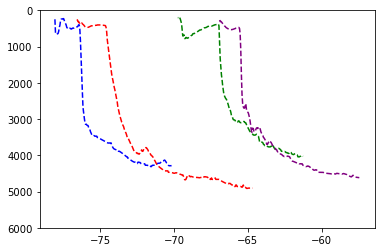

In [65]:
'''plt.plot(yt_extend[250:675],ocean_depth_extend[250:675,750].T,'g--')
plt.plot(yt_extend[250:750],ocean_depth_extend[250:750,1200].T,color='purple',linestyle='--')
plt.plot(yt_extend[250:470],ocean_depth_extend[250:470,2000].T,'b--')
plt.plot(yt_extend[250:600],ocean_depth_extend[250:600,3300].T,'r--')'''

plt.plot(yt_ocean[:675-210],ht_all[:675-210,750+2800].T,'g--')
plt.plot(yt_ocean[:750-210],ht_all[:750-210,1200-800].T,color='purple',linestyle='--')
plt.plot(yt_ocean[:470-210],ht_all[:470-210,2000-800].T,'b--')
plt.plot(yt_ocean[:600-210],ht_all[:600-210,3300-800].T,'r--')

plt.ylim([6000,0])

In [13]:
# Add initial position
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
final_y = var_in_arrs_4['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]
final_x = var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]

final_pts = np.histogram2d(final_x,final_y,bins=[np.arange(-80,-25,1),np.arange(0,6000,100)])
xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2

final_pts_masked = np.ma.masked_where(final_pts[0] < 3*npts_here/10000, final_pts[0])

# Add final position
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
initial_y = var_in_arrs_0['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]
initial_x = var_in_arrs_0['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]

initial_pts = np.histogram2d(initial_x,initial_y,bins=[np.arange(-80,-25,1),np.arange(0,6000,100)])
xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2

initial_pts_masked = np.ma.masked_where(initial_pts[0] < 3*npts_here/10000, initial_pts[0])

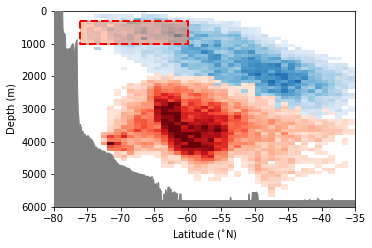

In [18]:
plt.figure(figsize=(5.4,3.6))
plt.pcolormesh(xbins,ybins,initial_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Reds',alpha=1,zorder=2)
#plt.colorbar()
plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Blues',alpha=1,zorder=1)
#plt.colorbar()


arr_max = np.ones(933)*7000
min_here = np.nanmax(ht_all[:931],axis=1)
min_here[np.isnan(min_here)]=0
arr_min = np.concatenate((np.array([0,0]),min_here))
lats = np.concatenate((np.array([-90,-81.11]),yt_ocean[:931]))
plt.fill_between(lats, arr_min, arr_max, alpha=1,color='grey',zorder=100)
plt.xlabel('Latitude ($^{\circ}$N)')
plt.ylabel('Depth (m)')

# Plot the releasing region
plt.fill_between([-76,-60], [300,300], [1000,1000], alpha=0.3,color='orangered',zorder=99)
# Define the corner points of the shaded area
x = [-76, -60, -60, -76, -76]
y = [300, 300, 1000, 1000, 300]
# Plot the edges of the shaded area using plot()
plt.plot(x, y, color='red', linestyle='--',linewidth=2,zorder=100)

plt.xlim([-80,-35])
plt.ylim([6000,0])
plt.savefig('Fig_1_initial_final_position_PDF_yz.png',dpi=500)

### For a no 2005 orange box version

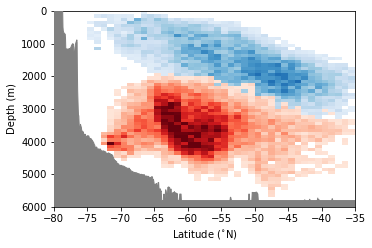

In [20]:
plt.figure(figsize=(5.4,3.6))
plt.pcolormesh(xbins,ybins,initial_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Reds',alpha=1,zorder=2)
#plt.colorbar()
plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Blues',alpha=1,zorder=1)
#plt.colorbar()


arr_max = np.ones(933)*7000
min_here = np.nanmax(ht_all[:931],axis=1)
min_here[np.isnan(min_here)]=0
arr_min = np.concatenate((np.array([0,0]),min_here))
lats = np.concatenate((np.array([-90,-81.11]),yt_ocean[:931]))
plt.fill_between(lats, arr_min, arr_max, alpha=1,color='grey',zorder=100)
plt.xlabel('Latitude ($^{\circ}$N)')
plt.ylabel('Depth (m)')

# Plot the releasing region
#plt.fill_between([-76,-60], [300,300], [1000,1000], alpha=0.3,color='orangered',zorder=99)
# Define the corner points of the shaded area
x = [-76, -60, -60, -76, -76]
y = [300, 300, 1000, 1000, 300]
# Plot the edges of the shaded area using plot()
#plt.plot(x, y, color='red', linestyle='--',linewidth=2,zorder=100)

plt.xlim([-80,-35])
plt.ylim([6000,0])
plt.savefig('Fig_1_initial_final_position_PDF_yz_no_2005_box.png',dpi=500)

In [23]:
# Add initial position
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
final_y = var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]
final_x = var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]

final_pts = np.histogram2d(final_x,final_y,bins=[np.arange(0,361,3),np.arange(-80,-29,3)])
xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2

final_pts_masked = np.ma.masked_where(final_pts[0] < 3*npts_here/10000, final_pts[0])

# Add final position
npts_here = sum(AABW_shallower_than_EZD_plus_CDW)
initial_y = var_in_arrs_0['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]
initial_x = var_in_arrs_0['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW ][:,-1]

initial_pts = np.histogram2d(initial_x,initial_y,bins=[np.arange(0,361,3),np.arange(-80,-29,3)])
xbins,ybins=(final_pts[1][1:]+final_pts[1][:-1])/2,(final_pts[2][1:]+final_pts[2][:-1])/2

initial_pts_masked = np.ma.masked_where(initial_pts[0] < 3*npts_here/10000, initial_pts[0])

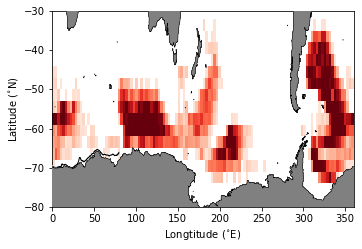

In [25]:
plt.figure(figsize=(5.4,3.6))
plt.pcolormesh(xbins,ybins,initial_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Reds',alpha=1,zorder=1)
#plt.colorbar()



# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
plt.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11) #Land Mask cmap=cmap_ice
plt.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12) #isoheight of ocean

#plt.pcolormesh(xt_ocean,yt_extend[:1141],ocean_depth_extend[:1141,:],vmin=-1000,vmax=7000,cmap='bone_r',zorder=0)

#Add 1000m isobath
contour =plt.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'white',zorder=6,linewidths=2)
contour2 = plt.contour(xt_ocean_cc, yt_ocean_cc, shelf_mask.values, [0, 1], colors = 'k',zorder=7,linewidths=1)

plt.ylabel('Latitude ($^{\circ}$N)')
plt.xlabel('Longtitude ($^{\circ}$E)')
plt.xlim([0,360])
plt.ylim([-80,-30])
plt.savefig('Fig_1_2019_PDF_xy.png',dpi=500)

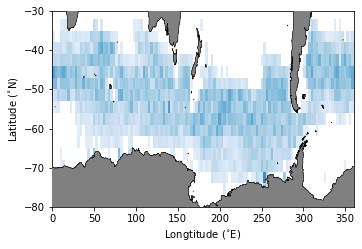

In [120]:
plt.figure(figsize=(5.4,3.6))
plt.pcolormesh(xbins,ybins,final_pts_masked.T,vmin=0,vmax=3*npts_here/1000,cmap='Blues',alpha=1,zorder=1)

#plt.colorbar()



# Isobath and background
X,Y = np.meshgrid(xt_ocean,yt_extend)
plt.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11) #Land Mask cmap=cmap_ice
plt.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12) #isoheight of ocean

#plt.pcolormesh(xt_ocean,yt_extend[:1141],ocean_depth_extend[:1141,:],vmin=-1000,vmax=7000,cmap='bone_r',zorder=0)

plt.ylabel('Latitude ($^{\circ}$N)')
plt.xlabel('Longtitude ($^{\circ}$E)')
plt.xlim([0,360])
plt.ylim([-80,-30])
plt.savefig('Fig_1_1969_PDF_xy.png',dpi=500)

# Y-Z euphotic zone profile PDF BUT in distance of 1000m isobath - Depth contour

In [17]:
%%time
res_map_x = np.ravel(np.concatenate((var_in_arrs_4['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')
res_map_y = np.ravel(np.concatenate((var_in_arrs_4['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')
res_map_z = np.ravel(np.concatenate((var_in_arrs_4['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')

res_map_z1 = np.ravel(np.concatenate((var_in_arrs_4['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_3['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_2['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_1['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW],var_in_arrs_0['CS_Eu_date'][AABW_shallower_than_EZD_plus_CDW]),axis=1),order='C')

hist3d = np.histogramdd([res_map_x,res_map_y,res_map_z],bins=[np.arange(0,360.25,1),np.arange(-80,-29.9,1/2),np.arange(0,6000,25)],weights=res_map_z1)
hist3d_pts = np.histogramdd([res_map_x,res_map_y,res_map_z],bins=[np.arange(0,360.25,1),np.arange(-80,-29.9,1/2),np.arange(0,6000,25)])

CPU times: user 28.4 s, sys: 32.2 s, total: 1min
Wall time: 1min 1s


(6000.0, 0.0)

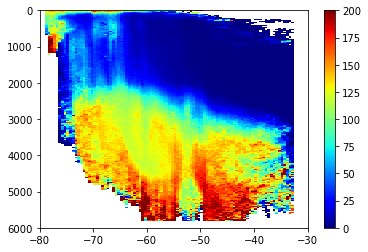

In [18]:
xbins,ybins = (hist3d[1][1][1:]+hist3d[1][1][:-1])/2,(hist3d[1][2][1:]+hist3d[1][2][:-1])/2

plt.pcolormesh(xbins,ybins,(np.nanmean(hist3d[0][:,:,:],axis=0)/np.nanmean(hist3d_pts[0][:,:,:],axis=0)).T,vmin=0,vmax=200,cmap='jet')
plt.colorbar()
plt.ylim([6000,0])

In [11]:
distance_to_1000isobath = xr.open_dataset('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/distance_to_1000isobath.nc')

In [12]:
dis_100iso_data = np.concatenate((distance_to_1000isobath.sel(xt_ocean = distance_to_1000isobath.xt_ocean>=0).__xarray_dataarray_variable__.data,distance_to_1000isobath.sel(xt_ocean = distance_to_1000isobath.xt_ocean<0).__xarray_dataarray_variable__.data),axis=1)

In [13]:
from scipy.interpolate import griddata

# Define the x-y grid to interpolate onto
x = (hist3d[1][0][1:]+hist3d[1][0][:-1])/2
y = (hist3d[1][1][1:]+hist3d[1][1][:-1])/2
xy = np.meshgrid(x, y)
xy_mesh = np.meshgrid(x, y)
xy = np.stack((xy[0].ravel(), xy[1].ravel()), axis=1)

# Get the data and its x-y coordinates
data = np.ravel(dis_100iso_data)
x_coords = distance_to_1000isobath.xt_ocean.values
x_coords = np.concatenate((x_coords[x_coords>=0],360+x_coords[x_coords<0]))
y_coords = distance_to_1000isobath.yt_ocean.values
X_coords,Y_coords = np.meshgrid(x_coords,y_coords)
X_coords,Y_coords = X_coords.ravel(),Y_coords.ravel()


# Interpolate the data onto the new x-y grid
interp_data = griddata((X_coords,Y_coords), data, xy, method='linear')

# Reshape the interpolated data to the x-y grid shape
interp_data = interp_data.reshape((len(y), len(x)))

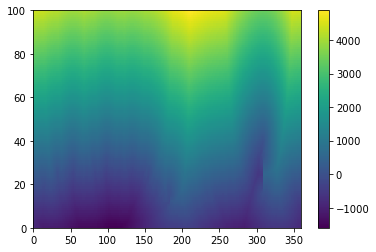

In [14]:
plt.pcolormesh(interp_data)
plt.colorbar()

## Interpolate hist3d into new x-distance_in_km-z coordinate system

In [19]:
%%time
hist2d_x = []
hist2d_pts_x = []
ind = []

for i in np.arange(360):
    ind.append(i)
    # Define the original x-y grid
    x =  interp_data[:,i]
    y = ybins
    xv, yv = np.meshgrid(y,x)
    data = hist3d[0][i,:,:]/hist3d_pts[0][i,:,:]
    mask = ~np.isnan(data.ravel())

    res_map_x = yv.ravel(order='C')[mask]
    res_map_y = xv.ravel(order='C')[mask]
    res_map_z = data.ravel(order='C')[mask]

    hist2d_x.append(np.histogram2d(res_map_x,res_map_y,bins=[np.arange(-1500,5000,60),np.arange(0,6000,25)],weights=res_map_z)[0])
    hist2d_pts_x.append(np.histogram2d(res_map_x,res_map_y,bins=[np.arange(-1500,5000,60),np.arange(0,6000,25)])[0])


CPU times: user 410 ms, sys: 6.87 ms, total: 417 ms
Wall time: 414 ms


In [20]:
hist2d_x_mean = np.nanmean(np.array(hist2d_x),axis=0)
hist2d_pts_x_mean = np.nanmean(np.array(hist2d_pts_x),axis=0)

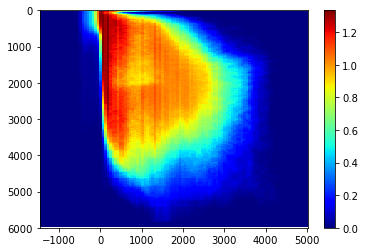

In [21]:
plt.pcolormesh(np.arange(-1500,5000,60)[1:],np.arange(0,6000,25)[1:],(hist2d_pts_x_mean[:,:]).T,vmin=0,cmap='jet')
plt.ylim([6000,0])
plt.colorbar()

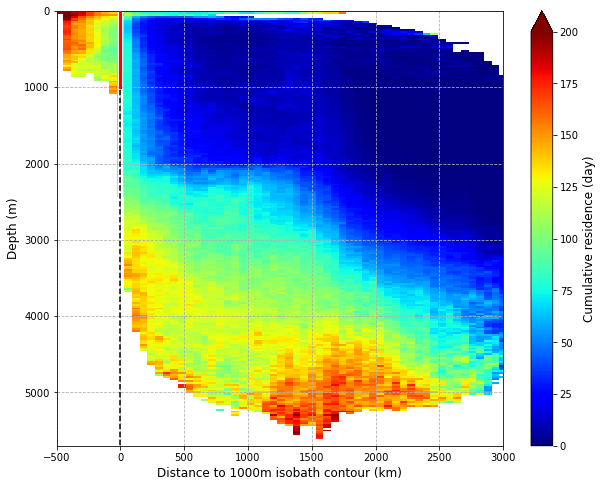

In [25]:
hist2d_x_mean_masked = np.ma.masked_where(hist2d_pts_x_mean < 0.1, hist2d_x_mean)





plt.figure(figsize=(10,8))
plt.pcolormesh(np.arange(-1500,5000,60)[1:],np.arange(0,6000,25)[1:],(hist2d_x_mean_masked[:,:]/hist2d_pts_x_mean[:,:]).T,vmin=0,vmax=200,cmap='jet')
plt.plot([0,0],[1000,0],'r-',zorder=3,linewidth=3)
plt.plot([0,0],[6000,0],'k--',zorder=2)
plt.plot([0,0],[6000,0],color='white',zorder=1,linewidth=5)
plt.ylim([5700,0])
plt.xlim([-500,3000])
plt.grid(linestyle='--')
plt.xlabel('Distance to 1000m isobath contour (km)', fontsize=12)
plt.ylabel('Depth (m)', fontsize=12)
cbar = plt.colorbar(extend='max')
cbar.set_label('Cumulative residence (day)', fontsize=12)
plt.savefig('Fig1_residence_PDF_in_isobath_distance.png',dpi=500)

# Density Analysis

### Hidden chunk
Get the date from npz file. It will create datatime.npz file in gdata dir then we can directly read from the new npz fatetime file

### Load the datetime

In [51]:
var_in_arrs_s = [var_in_arrs_4,var_in_arrs_3,var_in_arrs_2,var_in_arrs_1,var_in_arrs_0]

i=0
for name in ['var_in_arrs_4','var_in_arrs_3','var_in_arrs_2','var_in_arrs_1','var_in_arrs_0']:
    npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_ON/'+name+'_datetime.npz'
                     ,allow_pickle=True)
    var_in_arrs_s[i]['datetime'] = npzfile['datetime']
    i+=1


In [52]:
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_ON/gamma_all.npz',allow_pickle=True)
gamma_all_here = npzfile['gamma_all_here']
dates_all      = npzfile['dates_all']

In [97]:
For_AABW_CDW_only  =False

In [98]:
#gamma_all_here = np.array(gamma_all).T
#gamma_all_here[gamma_all_here<=0] = np.nan
p_0_100_array = []
for i in np.arange(len(dates_all)):
    p_0_100 = [np.nanmin(gamma_all_here[:,i])]
    for percentile in np.arange(5,99,5):
        p_0_100.append(np.nanpercentile(gamma_all_here[:,i],percentile))
    p_0_100.append(np.nanmax(gamma_all_here[:,i]))
    p_0_100_array.append(p_0_100)
p_0_100_array = np.array(p_0_100_array).T

if For_AABW_CDW_only:
    p_0_100_array = []
    for i in np.arange(len(dates_all)):
        p_0_100 = [np.nanmin(gamma_all_here[AABW_shallower_than_EZD_plus_CDW][:,i])]
        for percentile in np.arange(5,99,5):
            p_0_100.append(np.nanpercentile(gamma_all_here[AABW_shallower_than_EZD_plus_CDW][:,i],percentile))
        p_0_100.append(np.nanmax(gamma_all_here[AABW_shallower_than_EZD_plus_CDW][:,i]))
        p_0_100_array.append(p_0_100)
    p_0_100_array = np.array(p_0_100_array).T

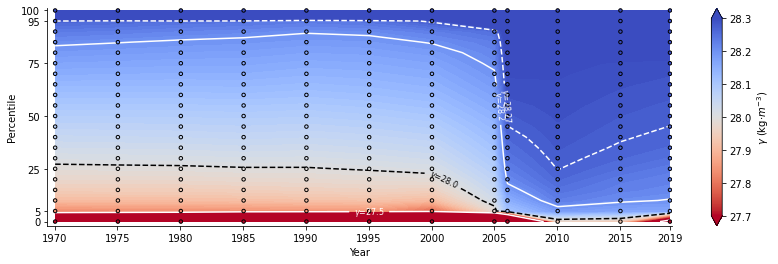

In [99]:
import matplotlib.dates as mdates
plt.figure(figsize=(14,4))
plt.contourf(dates_all,np.arange(0,101,5),p_0_100_array,levels=np.arange(20,45,0.01),vmin=27.7,vmax=28.3,cmap='coolwarm_r')  #RdYlBu
X,Y = np.meshgrid(dates_all,np.arange(0,101,5))
plt.scatter(X,Y,c=p_0_100_array,vmin=27.7,vmax=28.3,cmap='coolwarm_r', edgecolors='black',s=12,zorder=11)
cbar = plt.colorbar(label='$\gamma$ (kg$\cdot m^{-3}$)',extend='both')

cs0=plt.contour(dates_all,np.arange(0,101,5),p_0_100_array,linestyles='-',colors='w',levels=[27.5],zorder=10)
fmt = {27.5: '$\gamma$=27.5'}
plt.clabel(cs0, cs0.levels, inline=True, fmt=fmt, fontsize=8)

cs=plt.contour(dates_all,np.arange(0,101,5),p_0_100_array,linestyles='--',colors='w',levels=[28.27],zorder=10)
# Add inline labels to contour lines
# Assign inline texts to contour levels
fmt = {28.27: '$\gamma$=28.27'}
plt.clabel(cs, cs.levels, inline=True, fmt=fmt, fontsize=8)

cs3=plt.contour(dates_all,np.arange(0,101,5),p_0_100_array,linestyles='-',colors='w',levels=[28.2],zorder=10)
# Add inline labels to contour lines
# Assign inline texts to contour levels
fmt = {28.2: '$\gamma$=28.2'}
plt.clabel(cs3, cs3.levels, inline=True, fmt=fmt, fontsize=8)

cs2=plt.contour(dates_all,np.arange(0,101,5),p_0_100_array,linestyles='--',colors='k',levels=[28.0],zorder=10)
fmt = {28.0: '$\gamma$=28.0'}
plt.clabel(cs2, cs2.levels, inline=True, fmt=fmt, fontsize=8)
plt.ylim(-2,101)
plt.xlim(dt.datetime(1969,6,1),dt.datetime(2019,3,1))
plt.yticks([0,5,25,50,75,95,100])  # specify y-ticks
xticks=[]
for yyyy in [1970,1975,1980,1985,1990,1995,2000,2005,2010,2015,2019]:
    xticks.append(dt.datetime(yyyy,1,1))
plt.xticks(xticks)
ax = plt.gca()  # Get the current Axes instance
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#plt.grid(linestyle='-',color='w',axis='y',zorder=1)  # add horizontal grid lines
plt.xlabel('Year')
plt.ylabel('Percentile')

# Remove the upper and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

if For_AABW_CDW_only:
    plt.savefig('Percentile_Gamma_AABW_CDW_pts.png',dpi=500)
else:
    plt.savefig('Percentile_Gamma_AABW_pts.png',dpi=500)

### Similar analysis but for depth

In [119]:
inds_here = AABW_inds

var_in_arrs_s = [var_in_arrs_4,var_in_arrs_3,var_in_arrs_0]
years = [[1970,1975,1980,1985],[1990,1995,2000,2005],[2006,2010,2015,2020]]
z_analysis=[]
dates_all =[]
for i in np.arange(3):
    var_in_arrs = var_in_arrs_s[i]
    
    # Get the time inds
    time_inds    = []
    target_dates = []
    for yyyy in years[i]:
        target_date = dt.datetime(yyyy,1,15)
        if yyyy == 2005:
            target_date = dt.datetime(yyyy,12,27)
        
        target_dates.append(target_date) 

        # Calculate the absolute differences between the array values and the target date
        differences = np.abs(var_in_arrs['datetime'] - target_date)
        # Find the index of the closest value
        closest_index = np.argmin(differences)
        time_inds.append(closest_index)

    time_inds = np.array(time_inds)
    print('Z Calculation Start')
    print(var_in_arrs['datetime'][time_inds])
    
    for ind in time_inds:
        
        if For_AABW_CDW_only:
            z_analysis.append(var_in_arrs['z'][inds_here][AABW_shallower_than_EZD_plus_CDW][:,ind])
        else:
            z_analysis.append(var_in_arrs['z'][inds_here][:,ind])
            
        dates_all.append(var_in_arrs['datetime'][ind])
z_analysis = np.array(z_analysis).T
z_analysis[z_analysis>10000]=np.nan

Z Calculation Start
[datetime.datetime(1970, 1, 14, 0, 0) datetime.datetime(1975, 1, 13, 0, 0)
 datetime.datetime(1980, 1, 17, 0, 0) datetime.datetime(1985, 1, 15, 0, 0)]
Z Calculation Start
[datetime.datetime(1990, 1, 15, 0, 0) datetime.datetime(1995, 1, 14, 0, 0)
 datetime.datetime(2000, 1, 13, 0, 0) datetime.datetime(2005, 1, 1, 0, 0)]
Z Calculation Start
[datetime.datetime(2006, 1, 16, 0, 0) datetime.datetime(2010, 1, 15, 0, 0)
 datetime.datetime(2015, 1, 14, 0, 0)
 datetime.datetime(2018, 12, 24, 0, 0)]


In [120]:
#gamma_all_here = np.array(gamma_all).T
#gamma_all_here[gamma_all_here<=0] = np.nan
p_0_100_array_z = []
for i in np.arange(z_analysis.shape[1]):
    p_0_100 = [np.nanmin(z_analysis[:,i])]
    for percentile in np.arange(5,99,5):
        p_0_100.append(np.nanpercentile(z_analysis[:,i],percentile))
    p_0_100.append(np.nanmax(z_analysis[:,i]))
    p_0_100_array_z.append(p_0_100)
p_0_100_array_z = np.array(p_0_100_array_z).T

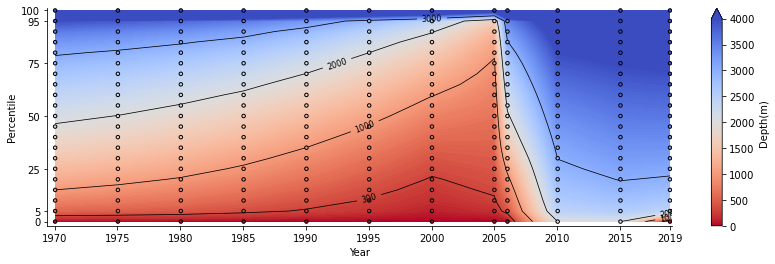

In [121]:
import matplotlib.dates as mdates
plt.figure(figsize=(14,4))
plt.contourf(dates_all,np.arange(0,101,5),p_0_100_array_z,levels=np.arange(0,6501,25),vmin=0,vmax=4000,cmap='coolwarm_r')  #RdYlBu

X,Y = np.meshgrid(dates_all,np.arange(0,101,5))
plt.scatter(X,Y,c=p_0_100_array_z,vmin=0,vmax=4000,cmap='coolwarm_r', edgecolors='black',s=12,zorder=11)
plt.colorbar(label='Depth(m)',extend='max')
cs = plt.contour(dates_all,np.arange(0,101,5),p_0_100_array_z,linestyles='-',colors='k',levels=[300,1000,2000,3000],zorder=10,linewidths=0.75)
# Add inline labels to contour lines
plt.clabel(cs, fmt='%1.0f', inline=True, fontsize=8)
#plt.contour(dates_all,np.arange(0,101,5),p_0_100_array,linestyles='--',colors='k',levels=[28.0],zorder=10)
#plt.legend()
plt.ylim(-2,101)
plt.xlim(dt.datetime(1969,6,1),dt.datetime(2019,3,1))
plt.yticks([0,5,25,50,75,95,100])  # specify y-ticks
xticks=[]
for yyyy in [1970,1975,1980,1985,1990,1995,2000,2005,2010,2015,2019]:
    xticks.append(dt.datetime(yyyy,1,1))
plt.xticks(xticks)
ax = plt.gca()  # Get the current Axes instance
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#plt.grid(linestyle='-',color='w',axis='y',zorder=1)  # add horizontal grid lines
plt.xlabel('Year')
plt.ylabel('Percentile')
# Remove the upper and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
if For_AABW_CDW_only:
    plt.savefig('Percentile_Depth_AABW_CDW_pts.png',dpi=500)
else:
    plt.savefig('Percentile_Depth_AABW_pts.png',dpi=500)

### Similar analysis but for lat

In [114]:
inds_here = AABW_inds

var_in_arrs_s = [var_in_arrs_4,var_in_arrs_3,var_in_arrs_0]
years = [[1970,1975,1980,1985],[1990,1995,2000,2005],[2006,2010,2015,2020]]
y_analysis=[]
dates_all =[]
for i in np.arange(3):
    var_in_arrs = var_in_arrs_s[i]
    
    # Get the time inds
    time_inds    = []
    target_dates = []
    for yyyy in years[i]:
        target_date = dt.datetime(yyyy,1,15)
        if yyyy == 2005:
            target_date = dt.datetime(yyyy,12,27)
        
        target_dates.append(target_date) 

        # Calculate the absolute differences between the array values and the target date
        differences = np.abs(var_in_arrs['datetime'] - target_date)
        # Find the index of the closest value
        closest_index = np.argmin(differences)
        time_inds.append(closest_index)

    time_inds = np.array(time_inds)
    print('Y Calculation Start')
    print(var_in_arrs['datetime'][time_inds])
    
    for ind in time_inds:
        
        if For_AABW_CDW_only:
            y_analysis.append(var_in_arrs['y'][inds_here][AABW_shallower_than_EZD_plus_CDW][:,ind])
        else:
            y_analysis.append(var_in_arrs['y'][inds_here][:,ind])
        dates_all.append(var_in_arrs['datetime'][ind])

y_analysis = np.array(y_analysis).T
y_analysis[y_analysis>90] = np.nan

Y Calculation Start
[datetime.datetime(1970, 1, 14, 0, 0) datetime.datetime(1975, 1, 13, 0, 0)
 datetime.datetime(1980, 1, 17, 0, 0) datetime.datetime(1985, 1, 15, 0, 0)]
Y Calculation Start
[datetime.datetime(1990, 1, 15, 0, 0) datetime.datetime(1995, 1, 14, 0, 0)
 datetime.datetime(2000, 1, 13, 0, 0) datetime.datetime(2005, 1, 1, 0, 0)]
Y Calculation Start
[datetime.datetime(2006, 1, 16, 0, 0) datetime.datetime(2010, 1, 15, 0, 0)
 datetime.datetime(2015, 1, 14, 0, 0)
 datetime.datetime(2018, 12, 24, 0, 0)]


In [115]:
#gamma_all_here = np.array(gamma_all).T
#gamma_all_here[gamma_all_here<=0] = np.nan
p_0_100_array_y = []
for i in np.arange(y_analysis.shape[1]):
    p_0_100 = [np.nanmin(y_analysis[:,i])]
    for percentile in np.arange(5,99,5):
        p_0_100.append(np.nanpercentile(y_analysis[:,i],percentile))
    p_0_100.append(np.nanmax(y_analysis[:,i]))
    p_0_100_array_y.append(p_0_100)
p_0_100_array_y = np.array(p_0_100_array_y).T
p_0_100_array_y = p_0_100_array_y*-1

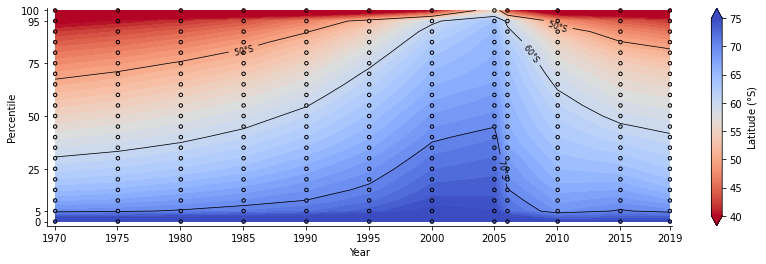

In [116]:
import matplotlib.dates as mdates
plt.figure(figsize=(14,4))
plt.contourf(dates_all,np.arange(0,101,5),p_0_100_array_y,levels=np.arange(25,90),vmin=40,vmax=75,cmap='coolwarm_r')  #RdYlBu

X,Y = np.meshgrid(dates_all,np.arange(0,101,5))
plt.scatter(X,Y,c=p_0_100_array_y,vmin=40,vmax=75,cmap='coolwarm_r', edgecolors='black',s=12,zorder=11)
plt.colorbar(label='Latitude ($\degree$S)',extend='both')
cs = plt.contour(dates_all,np.arange(0,101,5),p_0_100_array_y,linestyles='-',colors='k',levels=[50,60,70],zorder=10,linewidths=0.75)
# Add inline labels to contour lines
# Assign inline texts to contour levels
fmt = {50: '50$\degree$S', 60: '60$\degree$S', 70: '70$\degree$S'}
plt.clabel(cs, cs.levels, inline=True, fmt=fmt, fontsize=8)

plt.ylim(-2,101)
plt.xlim(dt.datetime(1969,6,1),dt.datetime(2019,3,1))
plt.yticks([0,5,25,50,75,95,100])  # specify y-ticks
xticks=[]
for yyyy in [1970,1975,1980,1985,1990,1995,2000,2005,2010,2015,2019]:
    xticks.append(dt.datetime(yyyy,1,1))
plt.xticks(xticks)
ax = plt.gca()  # Get the current Axes instance
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
#plt.grid(linestyle='-',color='w',axis='y',zorder=1)  # add horizontal grid lines
plt.xlabel('Year')
plt.ylabel('Percentile')
# Remove the upper and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

if For_AABW_CDW_only:
    plt.savefig('Percentile_Latitude_AABW_CDW_pts.png',dpi=500)
else:
    plt.savefig('Percentile_Latitude_AABW_pts.png',dpi=500)

In [ ]:
var_in_arrs_s = [var_in_arrs_4,var_in_arrs_2,var_in_arrs_1,var_in_arrs_0]
inds = [-1,-1,-1,-1]

# Create the figure and subplots
fig, axes = plt.subplots(4, 1, figsize=(8, 16), gridspec_kw={'width_ratios': [1], 'height_ratios': [1, 1, 1, 1]})
plt.subplots_adjust(hspace=0.1)  # Adjust vertical spacing between subplots


    
for i in np.arange(4):
    var_in_arrs = var_in_arrs_s[i]
    ind = inds[i]
    p  = gsw.p_from_z(-1*var_in_arrs['z'][inds_here][:,ind],var_in_arrs['y'][inds_here][:,ind])
    SA = gsw.SA_from_SP(var_in_arrs['S'][inds_here][:,ind],p,var_in_arrs['x'][inds_here][:,ind],var_in_arrs['y'][inds_here][:,ind]) 
    T_insitu = gsw.t_from_CT(SA, var_in_arrs['T'][inds_here][:,ind]-273.15, p)

    # 5 required positional arguments: 's/SP', 't/in-situ', 'p', 'lon', and 'lat'
    gamma,err_lower,err_higher = pygamma.gamma_n(s=var_in_arrs['S'][inds_here][:,ind].ravel()[:,np.newaxis],
                    t=T_insitu.ravel()[:,np.newaxis],
                    p=p.ravel()[:,np.newaxis],
                    lon=var_in_arrs['x'][inds_here][:,ind].ravel(),
                    lat=var_in_arrs['y'][inds_here][:,ind].ravel())

    axes[i].hist(gamma,bins=np.arange(28.2,30,0.05),density=False,color='C0',label='AABW',zorder=1)
    axes[i].hist(gamma,bins=np.arange(28,28.21,0.05),density=False,color='C9',label='LCDW',zorder=1)
    axes[i].hist(gamma,bins=np.arange(27.5,28.1,0.05),density=False,color='C1',label='UCDW',zorder=1)
    axes[i].hist(gamma,bins=np.arange(27,27.51,0.05),density=False,color='C3',label='AAIW',zorder=1)
    axes[i].hist(gamma,bins=np.arange(26,27.2,0.05),density=False,color='C6',label='SAMW',zorder=1)

    axes[i].fill_between(np.array([27,27.5]),np.array([0,0]),np.array([100000,100000]),color='grey', alpha=0.2,zorder=0)
    axes[i].fill_between(np.array([28,28.2]),np.array([0,0]),np.array([100000,100000]),color='grey', alpha=0.2,zorder=0)
    axes[i].set_xlim(26.9,28.9)
    axes[i].set_ylim(0,32500)
    #plt.legend()
    #if i <4 :
    #    axes[i].set_xticklabels([])  # Remove y-axis tick labels for subplots 2-4

# Add a common x-axis label
fig.text(0.5, 0.04, 'X Label', ha='center', fontsize=12)

(-2.0, 4.0)

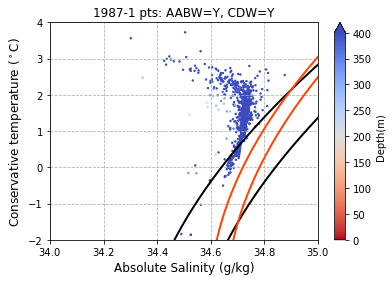

In [80]:


s_here = var_in_arrs_3['S'][AABW_inds][CDW_inds][:,-1][::100]
t_here = var_in_arrs_3['T'][AABW_inds][CDW_inds][:,-1][::100]-273.15
z_here = var_in_arrs_3['z'][AABW_inds][CDW_inds][:,-1][::100]

plt.scatter(s_here,t_here,c=z_here,vmin=0,vmax=400,s=2,cmap='coolwarm_r')



cbar = plt.colorbar(extend='max')
cbar.set_label('Depth(m)', fontsize=10)
plt.ylabel('Conservative temperature ($^\circ$C)',fontsize=12)
plt.xlabel('Absolute Salinity (g/kg)',fontsize=12)
plt.title('1987-1 pts: AABW=Y, CDW=Y')
plt.grid(linestyle='--')
plt.contour(TS_arr_2[0], TS_arr_2[1], Ps1_arr, [32.40, 32.56], colors='k', linewidths=2, zorder=12, linestyle='--')
plt.contour(TS_arr_2[0], TS_arr_2[1], Ps0_arr, [27.75, 27.80], colors='orangered', linestyle='--', linewidths=2, zorder=12)


plt.xlim(34,35)
plt.ylim(-2,4)

(-80.0, -30.0)

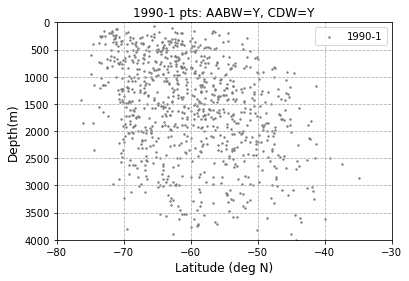

In [14]:
s_here = var_in_arrs_3['y'][AABW_inds][CDW_inds][:,73*15][::100]
t_here = var_in_arrs_3['z'][AABW_inds][CDW_inds][:,73*15][::100]
plt.scatter(s_here,t_here,c='grey',marker='o',s=2,label='1990-1')


plt.ylabel('Depth(m)',fontsize=12)
plt.xlabel('Latitude (deg N)',fontsize=12)
plt.title('1990-1 pts: AABW=Y, CDW=Y')
plt.grid(linestyle='--')
plt.legend()

plt.ylim(4000,0)
plt.xlim(-80,-30)

In [69]:
TS_arr_0 = np.meshgrid(np.arange(27.5,35.2,0.01),np.arange(-2.5,4,0.01))
Ps1_arr_0 =  gsw.sigma1(TS_arr_0[0].flatten(),TS_arr_0[1].flatten())
Ps1_arr_0 = np.array(np.split(Ps1_arr_0,TS_arr_0[0].shape[0]))

In [70]:
TS_arr = np.meshgrid(np.arange(27.5,35.2,0.01),np.arange(-2.5,4,0.01))
TS_arr_1 = np.copy(TS_arr)

p  = np.absolute(gsw.p_from_z(-1*(1000),(-65)))*np.ones(TS_arr_1[0].shape)
SA = gsw.SA_from_SP(TS_arr_1[0],p,90*np.ones(TS_arr_1[0].shape),-60*np.ones(TS_arr_1[0].shape))     
#Calculates Absolute Salinity (g/kg) from Practical Salinity, sea pressure and loc
CT = TS_arr_1[1]
TS_arr_2 = [SA,CT]

Ps1_arr =  gsw.sigma1(TS_arr_2[0].flatten(),TS_arr_2[1].flatten())
Ps1_arr = np.array(np.split(Ps1_arr,TS_arr_2[0].shape[0]))

Ps2_arr =  gsw.sigma2(TS_arr_2[0].flatten(),TS_arr_2[1].flatten())
Ps2_arr = np.array(np.split(Ps2_arr,TS_arr_2[0].shape[0]))

Ps0_arr =  gsw.sigma0(TS_arr_2[0].flatten(),TS_arr_2[1].flatten())
Ps0_arr = np.array(np.split(Ps0_arr,TS_arr_2[0].shape[0]))

(-2.0, 3.5)

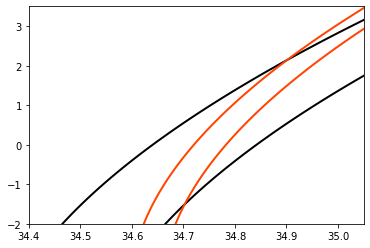

In [26]:

plt.contour(TS_arr_2[0], TS_arr_2[1], Ps1_arr, [32.40, 32.56], colors='k', linewidths=2, zorder=12, linestyle='--')
plt.contour(TS_arr_2[0], TS_arr_2[1], Ps0_arr, [27.75, 27.80], colors='orangered', linestyle='--', linewidths=2, zorder=12)

plt.xlim([34.4, 35.05])
plt.ylim([-2, 3.5])

Text(0.5, 0.04, 'Absolute Salinity (g/kg)')

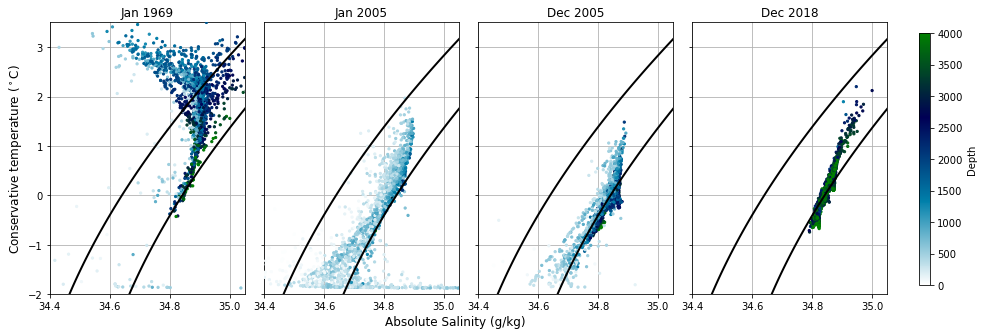

In [73]:
# Create a 3x1 subplot grid
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(15,5), gridspec_kw={"width_ratios": [1,1,1,1], "height_ratios": [1], "wspace": 0.1})

# Loop over the subplots and plot the data
var_in_arrs_s = [var_in_arrs_4, var_in_arrs_2, var_in_arrs_1, var_in_arrs_0]
inds = [-55,-1,-1,-1]
yyyymm = ['Jan 1969','Jan 2005','Dec 2005','Dec 2018']
for i, ax in enumerate(axs):
    var_in_arrs = var_in_arrs_s[i]
    if False:
        ax.contour(TS_arr_2[0], TS_arr_2[1], Ps1_arr, [32.40, 32.56], colors='k', linewidths=2, zorder=12, linestyle='--')
        ax.contour(TS_arr_2[0], TS_arr_2[1], Ps0_arr, [27.75, 27.80], colors='orangered', linestyle='--', linewidths=2, zorder=12)

    # Third subplot: plot y3 with a green dotted line and triangles for markers
    ind_here = inds[i]
    x_here =  var_in_arrs['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW][:, ind_here][::20]
    y_here =  var_in_arrs['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW][:, ind_here][::20]
    z_here =  var_in_arrs['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW][:, ind_here][::20]
    T_here =  var_in_arrs['T'][AABW_inds][AABW_shallower_than_EZD_plus_CDW][:, ind_here][::20] - 273.15
    S_here =  var_in_arrs['S'][AABW_inds][AABW_shallower_than_EZD_plus_CDW][:, ind_here][::20]

    p = np.absolute(gsw.p_from_z(-1 * (z_here), (S_here)))
    SA = gsw.SA_from_SP(S_here, p, x_here, y_here)
    CT = gsw.CT_from_pt(SA, T_here)
    ax.contour(TS_arr_2[0], TS_arr_2[1], Ps1_arr, [32.40, 32.56], colors='k', linewidths=2, zorder=12, linestyle='--')

    scatter = ax.scatter(SA, CT,c=z_here, s=5,vmin=0,vmax=4000,cmap='ocean_r',zorder=10)  # make scatter points smaller
    ax.set_xlim([34.4, 35.05])
    ax.set_ylim([-2, 3.5])
    if i in [1,2,3]:
        ax.set_yticklabels([])  # delete y-axis tick labels for subplot 2 and 3
    if i ==0:
        ax.set_ylabel('Conservative temperature ($^\circ$C)',fontsize=12)
        
    ax.set_title(yyyymm[i])    
    ax.grid('--',zorder=0)
# Create an additional axis for the colorbar
cbar_ax = fig.add_axes([0.93, 0.15, 0.01, 0.7])  # [left, bottom, width, height]
# Add a colorbar to the right of the figure
cbar = fig.colorbar(scatter, cax=cbar_ax)
cbar.set_label('Depth')   
# Add some space between subplots
#fig.tight_layout()
# Add x and y labels to the entire figure
fig.text(0.5, 0.04, 'Absolute Salinity (g/kg)', ha='center',fontsize=12)
# Display the figure
#plt.savefig('S_Figure_3.png',dpi=500)

# Discussion of 5 factors

In [19]:
%%time
# Transform 'timeshort' to readable datetime
i=0
for var_in_arrs in [var_in_arrs_3,var_in_arrs_1]:
    seconds_array = var_in_arrs['timeshort'][100]//1000000000
    seconds_array[np.isnan(seconds_array)] = -365*86400*50
    # Convert the seconds to datetime objects
    var_in_arrs['datetime'] = np.array([dt.datetime(1970, 1, 1) + dt.timedelta(seconds=seconds) for seconds in seconds_array])
    print(i)
    i+=1

for var_in_arrs in [var_in_arrs_2]:
    seconds_array = var_in_arrs['timeshort'][-100]//1000000000
    seconds_array[np.isnan(seconds_array)] = -365*86400*50
    # Convert the seconds to datetime objects
    var_in_arrs['datetime'] = np.array([dt.datetime(1970, 1, 1) + dt.timedelta(seconds=seconds) for seconds in seconds_array])


# Manually fix the missing values
var_in_arrs_1['datetime'][:2] = [dt.datetime(2005,1,5,12),dt.datetime(2005,1,10,12)]
var_in_arrs_2['datetime'][:4] = [dt.datetime(2005,12,31,0),dt.datetime(2005,12,26,0),dt.datetime(2005,12,21,0),dt.datetime(2005,12,16,0)]

0
1
CPU times: user 10.2 ms, sys: 14.1 ms, total: 24.2 ms
Wall time: 170 ms


In [20]:
later_than_1995_inds = var_in_arrs_3['datetime']>=dt.datetime(1995,1,1,0,0)

x_here = np.concatenate((var_in_arrs_3['x'][:,later_than_1995_inds][AABW_inds][AABW_shallower_than_EZD_plus_CDW],
                        var_in_arrs_2['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],
                        var_in_arrs_1['x'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1)
npts_here = x_here.shape[0]
x_here = x_here.flatten(order='C')

y_here = np.concatenate((var_in_arrs_3['y'][:,later_than_1995_inds][AABW_inds][AABW_shallower_than_EZD_plus_CDW],
                        var_in_arrs_2['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],
                        var_in_arrs_1['y'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1)
                         
y_here = y_here.flatten(order='C')
z_here = np.concatenate((var_in_arrs_3['z'][:,later_than_1995_inds][AABW_inds][AABW_shallower_than_EZD_plus_CDW],
                        var_in_arrs_2['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW],
                        var_in_arrs_1['z'][AABW_inds][AABW_shallower_than_EZD_plus_CDW]),axis=1)
z_here = z_here.flatten(order='C')
t_here = np.concatenate((var_in_arrs_3['datetime'][later_than_1995_inds],var_in_arrs_2['datetime'],var_in_arrs_1['datetime']),axis=0)
t_here = np.tile(t_here, (npts_here, 1))
t_here = t_here.flatten(order='C')

In [21]:
# Depth bins interval needed to be 1, started from 0
depth_bins = np.arange(0,151,1)
#
# Define the start and end dates
start_date = dt.datetime(1995, 1, 1)
end_date = dt.datetime(2006, 2, 1)
# Create an array of datetime values
datetime_array = np.arange(start_date, end_date, np.timedelta64(1, 'M'), dtype='datetime64[M]')
# Convert the array to datetime64[ms]
datetime_bins = datetime_array.astype('datetime64[s]')


In [22]:
%%time
H, edges = np.histogramdd((x_here,y_here,z_here,t_here),bins=([np.arange(0,361,0.5),np.arange(-80,-29,0.5),depth_bins,datetime_bins]))

CPU times: user 28.2 s, sys: 1min 5s, total: 1min 33s
Wall time: 1min 34s


In [23]:
H_coords = []
for edge in edges:
    if type(edge[0]) == np.datetime64:
        edge = edge[:-1]+np.timedelta64(14, 'D')
    else:
        edge = (edge[1:]+edge[:-1])/2
    H_coords.append(edge)

In [24]:
H_depth_3d_coord = H_coords[2]
H_depth_3d_coord = np.expand_dims(H_depth_3d_coord, axis=1)
H_depth_3d_coord = np.repeat(H_depth_3d_coord, 101, axis=1)
H_depth_3d_coord = np.expand_dims(H_depth_3d_coord, axis=2)
H_depth_3d_coord = np.repeat(H_depth_3d_coord, 721, axis=2)
H_depth_3d_coord = H_depth_3d_coord.T

# Factor 1 only consider fixed depth

Fixed 100m depth standard 
 Mean residence for selected period 409.5148087718813  days


(0.5, 12.5)

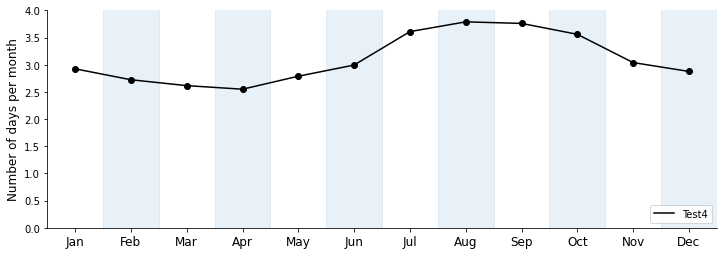

In [388]:
# Get fixed depth estimate
print(' 75m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<75,:])/npts_here)
print('100m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<100,:])/npts_here)
print('120m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<120,:])/npts_here)
print('125m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<125,:])/npts_here)
print('150m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<150,:])/npts_here)
print('200m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<200,:])/npts_here)


print('Fixed 100m depth standard \n Mean residence for selected period',5*np.nansum(H[:,:,H_coords[2]<100,:])/npts_here,' days')

#------------------------------------------------------------------------------------------------------#
monthly_sum=[]
#H_masked = ~H_test5_mask[:,:,:,:131]
for i in np.arange(12):
    #H_here = H[:,:,:,np.arange(i,131,12).tolist()]
    #H_mask_here = H_masked[:,:,:,np.arange(i,131,12).tolist()]
    #H
    monthly_sum.append(5*np.sum(H[:,:,:,np.arange(i,131,12).tolist()][:,:,H_coords[2]<100])/npts_here)

# Plotting
# Create a 3x1 subplot grid
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4), gridspec_kw={"width_ratios": [1], "height_ratios": [1],"wspace": 0.0})

# Loop over the subplots and plot the data
ax.plot(np.arange(1,13),np.array(monthly_sum)/11,
    'k-', label='Test4',zorder=3)
ax.scatter(np.arange(1,13),np.array(monthly_sum)/11,
       color='k',zorder=4)

# Add labels and title
#ax.set_xlabel('Date')
ax.set_ylabel('Number of days per month',fontsize=12)  # Replace with your desired y-axis label
#ax.set_title('Timeseries Data')  # Replace with your desired title
# Set the x-axis tick positions and labels
tick_positions = np.array([1,2,3,4,5,6,7,8,9,10,11,12])
tick_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels,fontsize=12)

days_here = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12])
for i in [1,3,5,7,9,11]:
    ax.fill_between(days_here[i:i+2]+0.5, [0,0],[400,400], alpha=0.1,zorder=0,color='C0')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Show the legend
ax.legend(fontsize=10,loc='lower right')
ax.set_ylim([0,4])
ax.set_xlim([0.5,12.5])

# Display the plot
#plt.savefig('Discussion_days_per_monthXXXX.png',dpi=500)

# Factor2: Consider Eup depth field based on PAR_LatMax

In [9]:
npzfile =  np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/Residence_hist_xyzt_mask_for_Only_max_zonal_PAR_test.npz')
H_test2_mask= npzfile['mask']
print('xyzt: ',H_test2_mask.shape)

xyzt:  (721, 101, 150, 132)


## If you need to calculate the field, using below 2 chunks:
### Load the PAR_LatMax for each year in 1995-2006

# Factor 3
### Consider maximum PAR in each latitude but mask out seaice cover region
At first we need load the maxPAR along lat array from Factor 2 analysis

In [10]:
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/Residence_hist_xyzt_mask_for_Zonal_Max_PAR_Plus_SeaIce_test.npz')
H_test3_mask = npzfile['mask']
print('xyzt: ',H_test3_mask.shape)

xyzt:  (721, 101, 150, 144)


## If you need to calculate the field, using below 3 chunks:

In [8]:
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/Residence_hist_xyzt_mask_for_Only_max_zonal_PAR_test.npz')
H_mask_F2 = npzfile['mask']

#
aice = cc.querying.getvar(expt='01deg_jra55v140_iaf_cycle4', variable='aice_m', 
                          session=session, frequency='1 monthly',
                          attrs={'cell_methods': 'time: mean'},
                          start_time='1995-01-01 12:00:00', 
                          end_time='2006-12-31 12:00:00')
aice_mean = aice

#
TLON = np.array(aice_mean.TLON[500,:].data)
TLON = np.concatenate((TLON[2800:],TLON[:2800])) # Aligen to 0-360
TLAT = np.array(aice_mean.TLAT[:931,:].mean(dim='ni'))
TLAT[np.isnan(TLAT)]=np.arange(TLAT[np.isnan(TLAT)].shape[0])*9999+9999 # This is a bad operation but just let us getting raid of these nan values

#
aice_mean = aice_mean.sel(nj=slice(0,931))

# Divide the dataset along x=100
dataset_below = aice_mean.sel(ni=slice(0,2800))
dataset_above = aice_mean.sel(ni=slice(2800,3600))

# Merge the datasets by transposing their order
merged_dataset = xr.concat([dataset_above, dataset_below], dim='ni')

merged_dataset['ni'] = TLON
merged_dataset['nj'] = TLAT

#
aice_mean_interp  = merged_dataset.interp(ni=H_coords[0], nj=H_coords[1])

# Make sure min is 0
aice_mean_interp= aice_mean_interp.where(aice_mean_interp > 0, 0)
# Let it share the same axis as H xyzt histogram
aice_mean_interp = np.transpose(aice_mean_interp.data, (2,1,0))

### Calculate the zonal max PAR field (similar with Factor 2 work)

In [95]:
PAR_LatMax_monthly_1995_2006_JRA55_Corrected = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/PAR_LatMax_monthly_1995_2006_JRA55_Corrected.npz')

PAR_LatMax_monthly_1995_2006_JRA55_Corrected_interp={}
lat = H_coords[1]
lat_old = PAR_LatMax_monthly_1995_2006_JRA55_Corrected['lat']

for yyyy in np.arange(1995,2007):

    
    values = PAR_LatMax_monthly_1995_2006_JRA55_Corrected['y'+str(yyyy)]
    val_new = []
    for i in np.arange(12):
        val_new.append(np.interp(lat, lat_old, values[i]))
    val_new = np.array(val_new)
    PAR_LatMax_monthly_1995_2006_JRA55_Corrected_interp[yyyy]=val_new
    
# Then build a xyzt mask
PARS = []
for yyyy in np.arange(1995,2007):
    for mm in np.arange(1,13):
        tar = PAR_LatMax_monthly_1995_2006_JRA55_Corrected_interp[yyyy][mm-1]
        tar = np.expand_dims(tar, axis=0).repeat(repeats=721,axis=0)
        PARS.append(tar)
        
PARS = np.stack(PARS, axis=-1)

# Then calculate the PARZ field based on PARS and AICE
PARZ = -20*np.log(0.433/(
(PARS)*(1-aice_mean_interp*0.957)
))



# Consider that when the max PARZ intensity is less than 0.433, the algebraic solution is going to be less than zero, which is not really meaningful
# Manually set less than 0 values to zero
#PARZ[PARZ<0] = 0
PARZ = (PARZ//1).astype(int)
# After the floor divide, now the PARZ is also the z index when we have a 1m H(istogram) bin box along deth aixs

H_test5_mask=[]
counter = 0
for yyyy in np.arange(1995,2007):
    for mm in np.arange(1,13):
        test  = np.expand_dims(PARZ[:,:,counter],axis=2)
        test  = np.repeat(test,repeats=150,axis=2)
        H_coord_mm_mask = (test > H_depth_3d_coord)
        
        t_ind = np.argwhere(H_coords[3]==np.datetime64(dt.datetime(yyyy,mm,15), 's'))
        
        H_test5_mask.append(~H_coord_mm_mask)
        
        print(np.datetime64(dt.datetime(yyyy,mm,15), 'M'),' done')
        counter +=1

H_test3_mask = np.stack(H_test5_mask, axis=3)

np.savez('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/Residence_hist_xyzt_mask_for_Zonal_Max_PAR_Plus_SeaIce_test.npz',mask=H_test5_mask,H_coords_x=H_coords[0],H_coords_y=H_coords[1],H_coords_z=H_coords[2],H_coords_t=H_coords[3])

## Look the result based on mask

Mean residence for selected period 237.0971488620337  days


(0.5, 12.5)

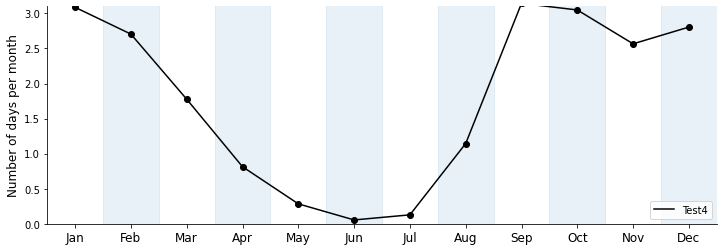

In [171]:
print('Mean residence for selected period',5*np.nansum(H[~H_test3_mask[:,:,:,:131]])/npts_here,' days')

#------------------------------------------------------------------------------------------------------#
monthly_sum=[]
H_masked = ~H_test3_mask[:,:,:,:131]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,131,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,131,12).tolist()]

    monthly_sum.append(5*np.sum(H_here[H_mask_here])/npts_here)

# Plotting
# Create a 3x1 subplot grid
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4), gridspec_kw={"width_ratios": [1], "height_ratios": [1],"wspace": 0.0})

# Loop over the subplots and plot the data
ax.plot(np.arange(1,13),np.array(monthly_sum)/11,
    'k-', label='Test4',zorder=3)
ax.scatter(np.arange(1,13),np.array(monthly_sum)/11,
       color='k',zorder=4)

# Add labels and title
#ax.set_xlabel('Date')
ax.set_ylabel('Number of days per month',fontsize=12)  # Replace with your desired y-axis label
#ax.set_title('Timeseries Data')  # Replace with your desired title
# Set the x-axis tick positions and labels
tick_positions = np.array([1,2,3,4,5,6,7,8,9,10,11,12])
tick_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels,fontsize=12)

days_here = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12])
for i in [1,3,5,7,9,11]:
    ax.fill_between(days_here[i:i+2]+0.5, [0,0],[400,400], alpha=0.1,zorder=0,color='C0')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Show the legend
ax.legend(fontsize=10,loc='lower right')
ax.set_ylim([0,3.1])
ax.set_xlim([0.5,12.5])

# Display the plot
#plt.savefig('Discussion_days_per_monthXXXX.png',dpi=500)

# Factor 4
### consider everthing except chl-a
using the conpherensive PARsurf input

### Load the mask file for 1995-1 to 2006-12

In [11]:
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/Residence_hist_xyzt_mask_for_Monthly_PAR_NO_chla_test.npz')
H_test4_mask = npzfile['mask']
print('xyzt: ',H_test4_mask.shape)

xyzt:  (721, 101, 150, 144)


## Run below 3 chunks if you need to reculate the mask for xyzt histogram for 1995-1 to 2006-12

### Calculate PARZ when chl-a = 0

## Look the result based on mask

(0.5, 12.5)

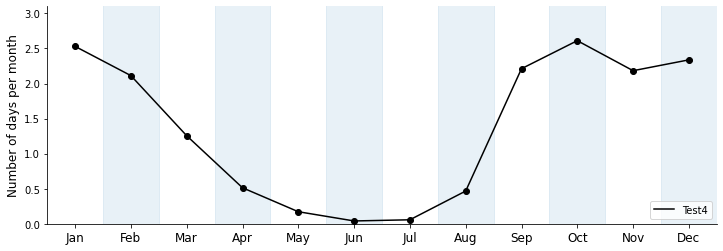

In [238]:
print('Mean residence for selected period',5*np.nansum(H[~H_test4_mask[:,:,:,:131]])/npts_here,' days')

#------------------------------------------------------------------------------------------------------#
monthly_sum=[]
H_masked = ~H_test4_mask[:,:,:,:131]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,131,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,131,12).tolist()]

    monthly_sum.append(5*np.sum(H_here[H_mask_here])/npts_here)

# Plotting
# Create a 3x1 subplot grid
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4), gridspec_kw={"width_ratios": [1], "height_ratios": [1],"wspace": 0.0})

# Loop over the subplots and plot the data
ax.plot(np.arange(1,13),np.array(monthly_sum)/11,
    'k-', label='Test4',zorder=3)
ax.scatter(np.arange(1,13),np.array(monthly_sum)/11,
       color='k',zorder=4)

# Add labels and title
#ax.set_xlabel('Date')
ax.set_ylabel('Number of days per month',fontsize=12)  # Replace with your desired y-axis label
#ax.set_title('Timeseries Data')  # Replace with your desired title
# Set the x-axis tick positions and labels
tick_positions = np.array([1,2,3,4,5,6,7,8,9,10,11,12])
tick_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels,fontsize=12)

days_here = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12])
for i in [1,3,5,7,9,11]:
    ax.fill_between(days_here[i:i+2]+0.5, [0,0],[400,400], alpha=0.1,zorder=0,color='C0')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Show the legend
ax.legend(fontsize=10,loc='lower right')
ax.set_ylim([0,3.1])
ax.set_xlim([0.5,12.5])

# Display the plot
#plt.savefig('Discussion_days_per_monthXXXX.png',dpi=500)

# Factor 5
## Consider all above and chl-a
Bsaically, we consider monthly PAR here, and further include chl-a decay coefficient

In [12]:
npzfile = np.load('/g/data/jk72/yx9454/PAR_from_iaf_cycle4/MLS_ON/Residence_hist_xyzt_mask_for_Monthly_PAR_With_chla_test.npz')
H_test5_mask = npzfile['mask']
print('xyzt: ',H_test5_mask.shape)

xyzt:  (721, 101, 150, 144)


## Run chuncks below if you need to recaculate

In [239]:
radbio = cc.querying.getvar(expt='01deg_jra55v140_iaf_cycle4', variable='radbio1', 
                          session=session, frequency='1 daily',
                          attrs={'cell_methods': 'time: mean'},
                          start_time='1995-01-01 12:00:00', 
                          end_time='2006-12-31 12:00:00')
#
radbio_mean = radbio.resample(time='M').mean()
radbio_mean = radbio_mean.sel(yt_ocean=slice(-90,-30))

# Divide the dataset along x=100
dataset_below = radbio_mean.sel(xt_ocean=slice(-280,0))
dataset_above = radbio_mean.sel(xt_ocean=slice(0,80))

# Merge the datasets by transposing their order
merged_dataset = xr.concat([dataset_above, dataset_below], dim='xt_ocean')
#
merged_dataset['xt_ocean'] = xr.where(merged_dataset['xt_ocean'] < 0, 360 + merged_dataset['xt_ocean'], merged_dataset['xt_ocean'])
#
radbio_mean_interp  = merged_dataset.interp(xt_ocean=H_coords[0], yt_ocean=H_coords[1])

### Read the occci_chl_v6_721x101 file, which corresponds to xyzt Histogram in 0.5*0.5*150lev res

In [369]:
npzfile = np.load('/g/data/jk72/yx9454/occci-v6.0-climatology_GFDL_combined/occci_chl_v6_721x101_combine_GFDL.npz')
occci_chl_v6_721x101 = npzfile['occci_chl_v6_721x101']
# To correspond the shape of radbio_mean_interp
media=[]
for i in np.arange(12):
    media.append(occci_chl_v6_721x101[i].T)
    
occci_chl_v6_721x101 = np.array(media)

If you need to calculate new res chla file, use the below chunk

### Calculate PARZ BUT this time we consider chl-a

## Look the result based on mask

Mean residence for selected period 126.8688642460109  days


(0.5, 12.5)

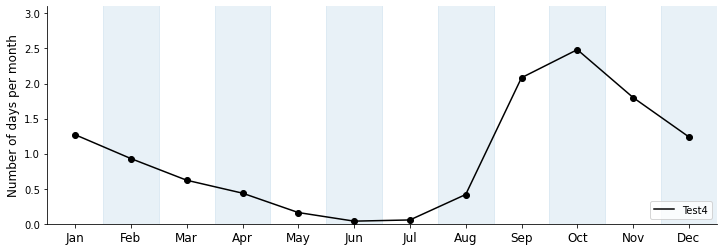

In [377]:
print('Mean residence for selected period',5*np.nansum(H[~H_test5_mask[:,:,:,:131]])/npts_here,' days')

#------------------------------------------------------------------------------------------------------#
monthly_sum=[]
H_masked = ~H_test5_mask[:,:,:,:131]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,131,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,131,12).tolist()]

    monthly_sum.append(5*np.sum(H_here[H_mask_here])/npts_here)

# Plotting
# Create a 3x1 subplot grid
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4), gridspec_kw={"width_ratios": [1], "height_ratios": [1],"wspace": 0.0})

# Loop over the subplots and plot the data
ax.plot(np.arange(1,13),np.array(monthly_sum)/11,
    'k-', label='Test4',zorder=3)
ax.scatter(np.arange(1,13),np.array(monthly_sum)/11,
       color='k',zorder=4)

# Add labels and title
#ax.set_xlabel('Date')
ax.set_ylabel('Number of days per month',fontsize=12)  # Replace with your desired y-axis label
#ax.set_title('Timeseries Data')  # Replace with your desired title
# Set the x-axis tick positions and labels
tick_positions = np.array([1,2,3,4,5,6,7,8,9,10,11,12])
tick_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels,fontsize=12)

days_here = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12])
for i in [1,3,5,7,9,11]:
    ax.fill_between(days_here[i:i+2]+0.5, [0,0],[400,400], alpha=0.1,zorder=0,color='C0')

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Show the legend
ax.legend(fontsize=10,loc='lower right')
ax.set_ylim([0,3.1])
ax.set_xlim([0.5,12.5])

# Display the plot
#plt.savefig('Discussion_days_per_monthXXXX.png',dpi=500)

# Generate plots for the discussion part

In [183]:
-20*np.log(0.433/((800)))

150.4325855729515

In [102]:
npzfile = np.load('/g/data/jk72/yx9454/Euphotic_zone_research_trajectory_in_npz/MLS_ON/smoothed_particle_range_for_Figure2.npz')
particle_range = npzfile['smoothed_arr']
particle_range_x = npzfile['xbins']
particle_range_y = npzfile['ybins']

DJF
102.9090909090909 110.87878787878786


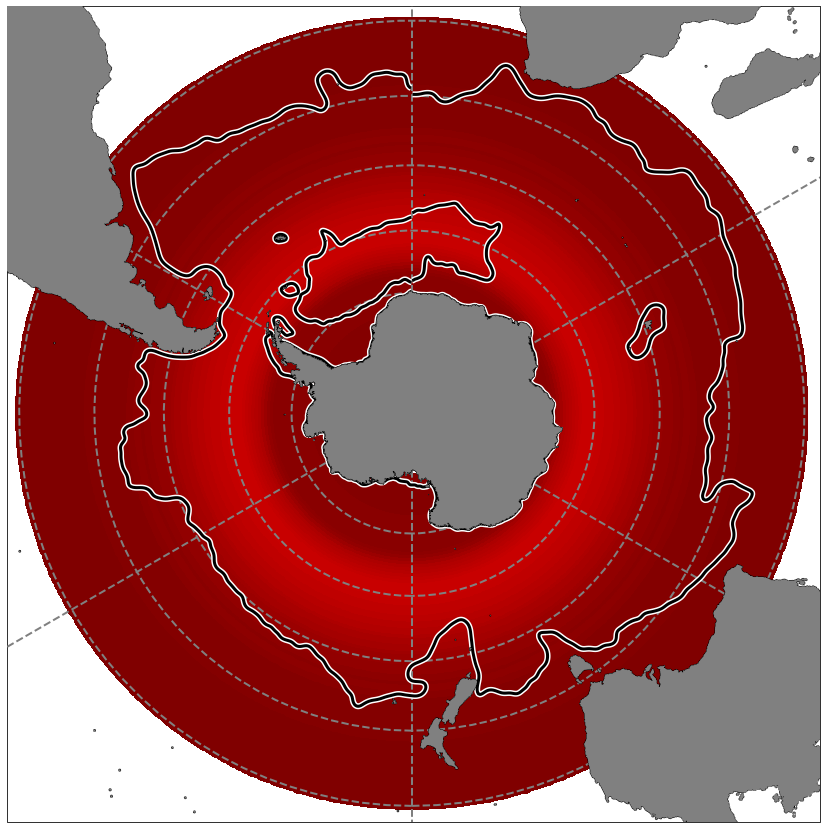

MAM
32.48484848484849 101.06060606060605


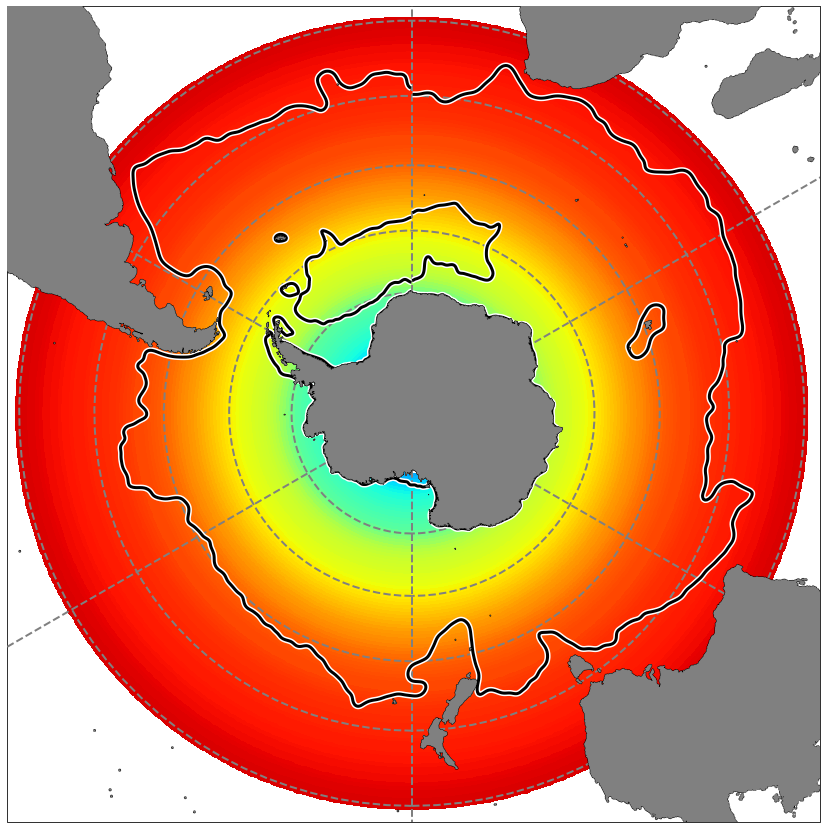

JJA
0.0 95.57575757575756


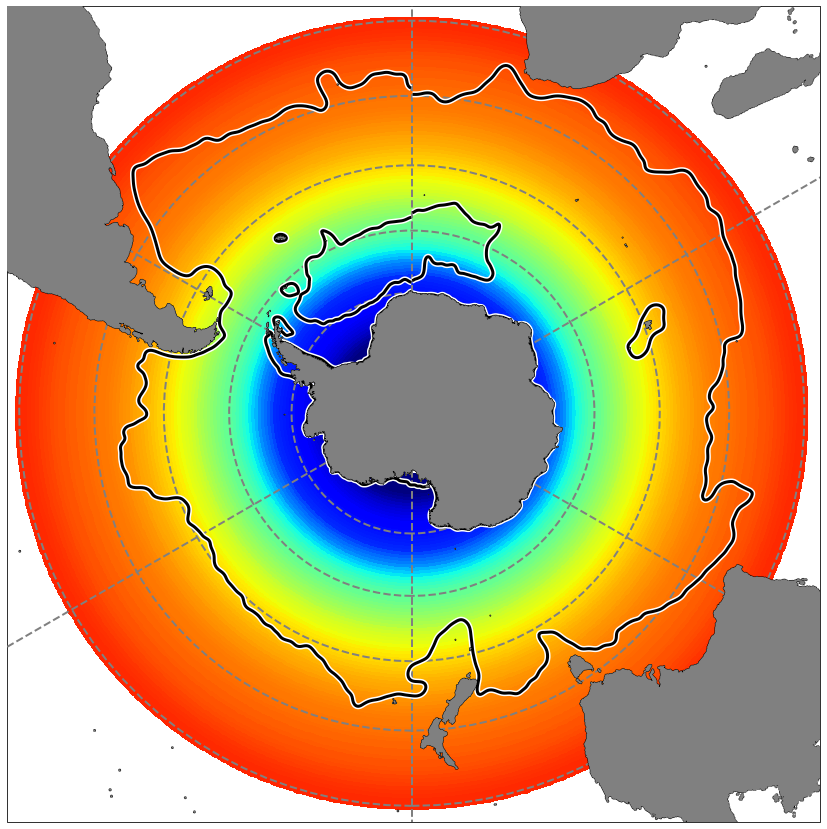

SON
88.36363636363636 106.75757575757575


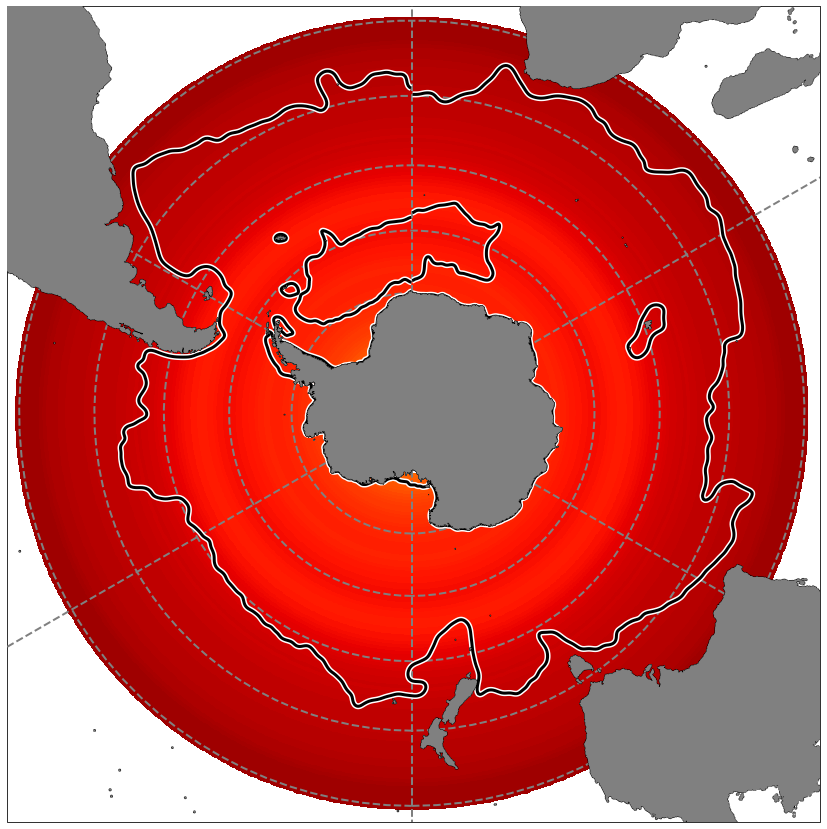

In [128]:

mms = ([11,0,1],[2,3,4],[5,6,7],[8,9,10])
names = ('DJF','MAM','JJA','SON')

for mm, name in zip(mms, names):
    print(name)
    tar= (np.nansum(H_test2_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(H_test2_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(H_test2_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar = np.nanmean(tar,axis=2)
    print(tar.min(),tar.max())

    #Plotting
    cmin,cmax = 0,110
    c_min,c_max = 0,110
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)


    plt.pcolormesh(H_coords[0],H_coords[1],tar.T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='white',linewidths=6,zorder=7,transform=ccrs.PlateCarree())
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='k',linewidths=3,zorder=8,transform=ccrs.PlateCarree())


    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -28], ccrs.PlateCarree())


    # Add grid lines
    ylocs = [-70,-60,-50,-40,-30] 
    ax.gridlines(ylocs=ylocs,draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=6)

    #
    #plt.title(title)
    plt.savefig('Zeu_F1_'+name+'cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

DJF
0.0 91.81818181818181


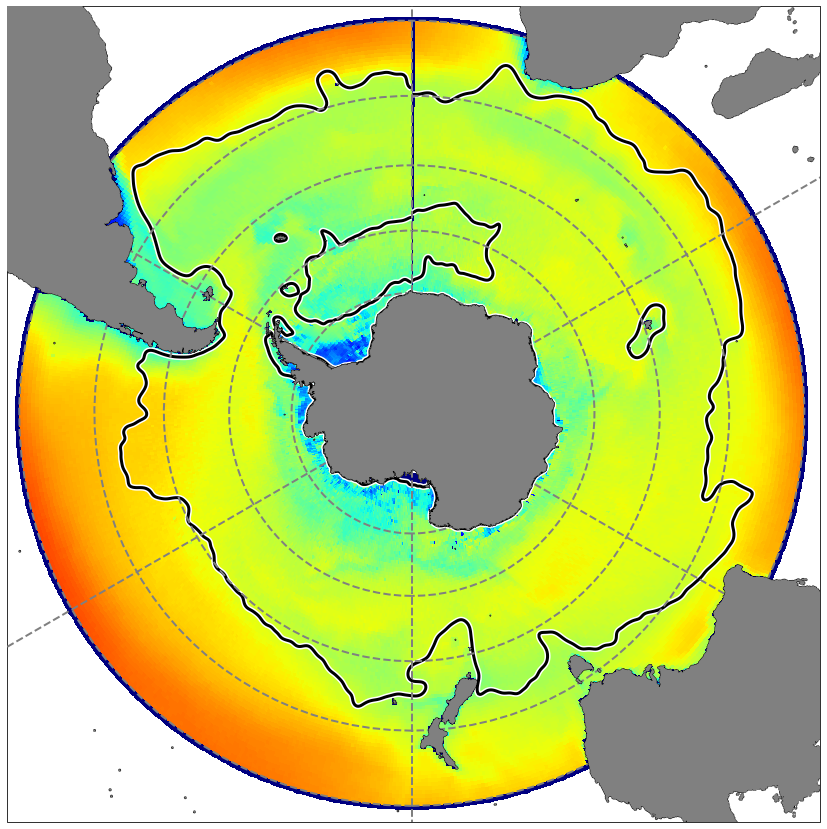

MAM
0.0 81.93939393939394


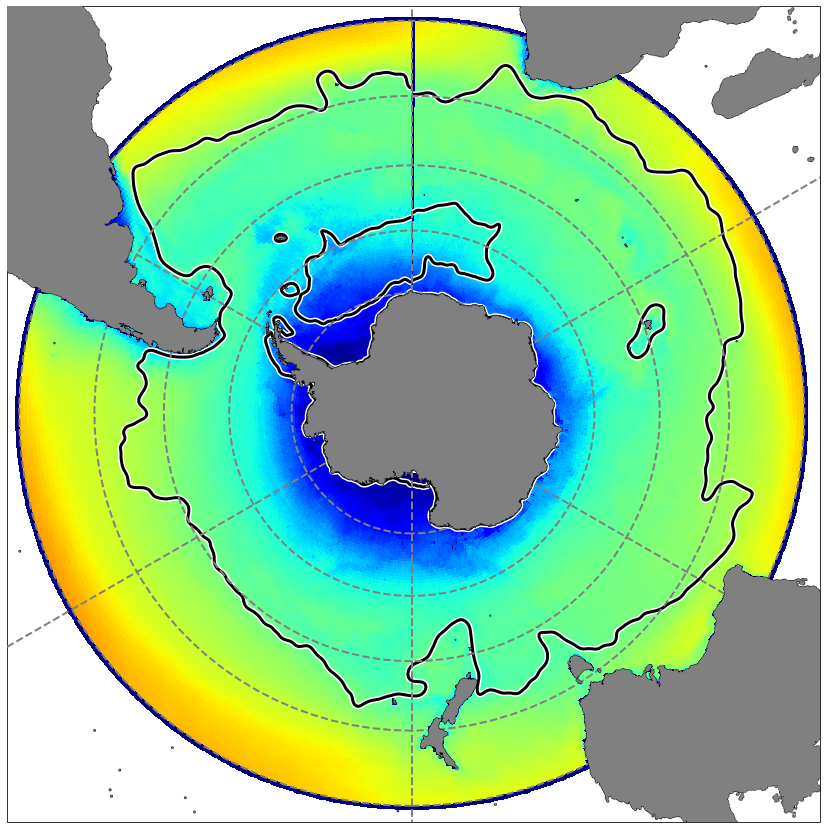

JJA
0.0 76.03030303030303


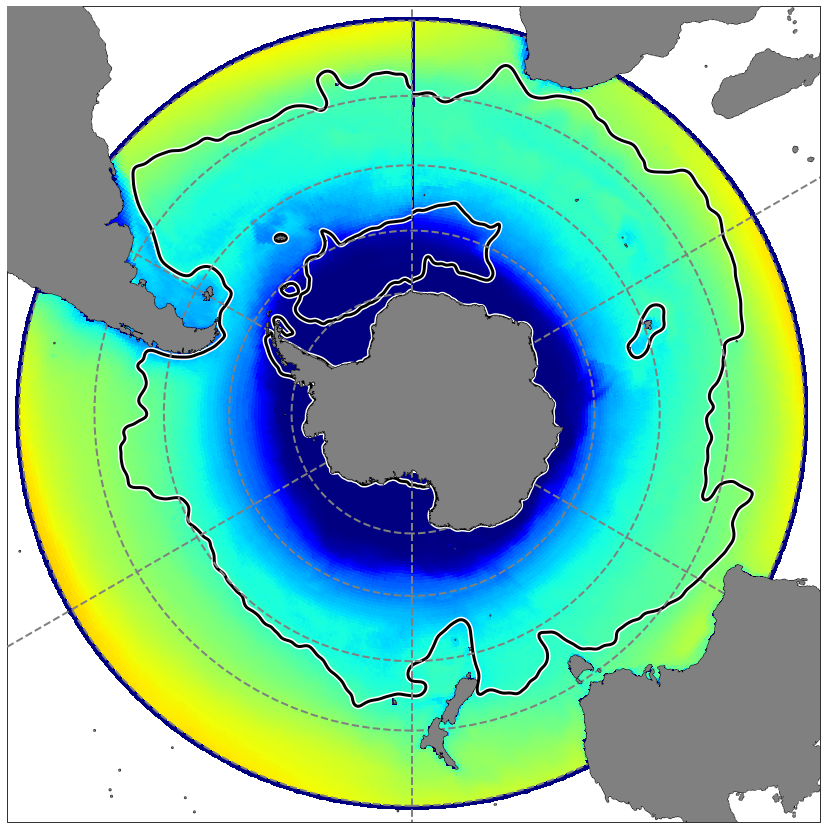

SON
0.0 87.33333333333334


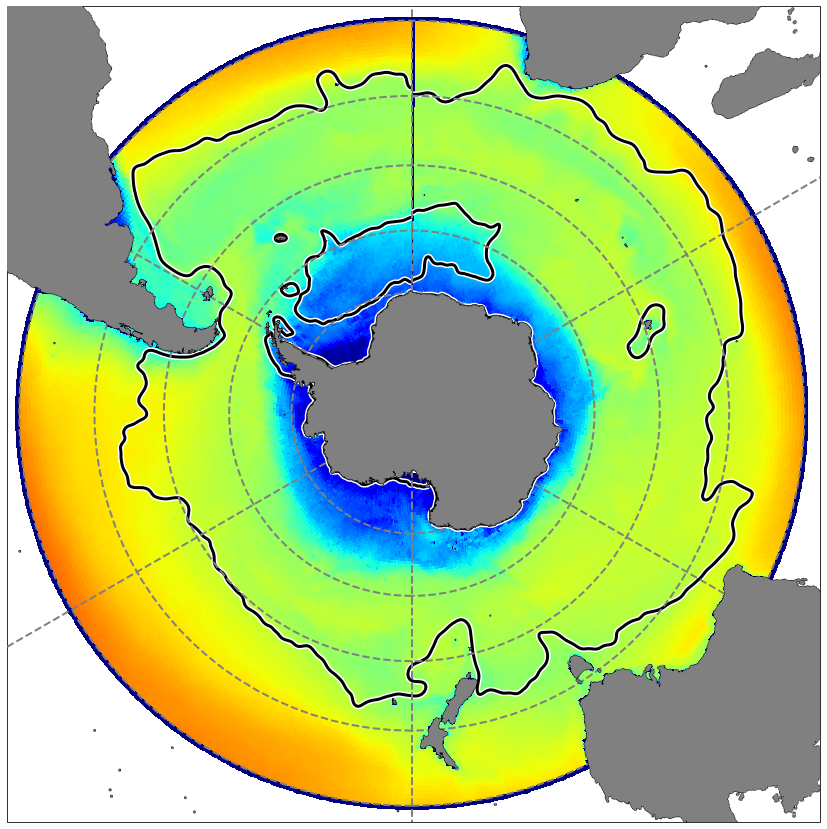

In [129]:

mms = ([11,0,1],[2,3,4],[5,6,7],[8,9,10])
names = ('DJF','MAM','JJA','SON')

for mm, name in zip(mms, names):
    print(name)
    tar1= (np.nansum(~H_test5_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(~H_test5_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(~H_test5_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar1 = np.nanmean(tar1,axis=2)


    
    print(tar1.min(),tar1.max())

    #Plotting
    cmin,cmax = 0,110
    c_min,c_max = 0,110
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)


    plt.pcolormesh(H_coords[0],H_coords[1],tar1.T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='white',linewidths=6,zorder=7,transform=ccrs.PlateCarree())
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='k',linewidths=3,zorder=8,transform=ccrs.PlateCarree())



    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -28], ccrs.PlateCarree())


    # Add grid lines
    ylocs = [-70,-60,-50,-40,-30] 
    ax.gridlines(ylocs=ylocs,draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)

    #
    #plt.title(title)
    plt.savefig('Zeu_F5_'+name+'cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

February
0.0 90.9090909090909


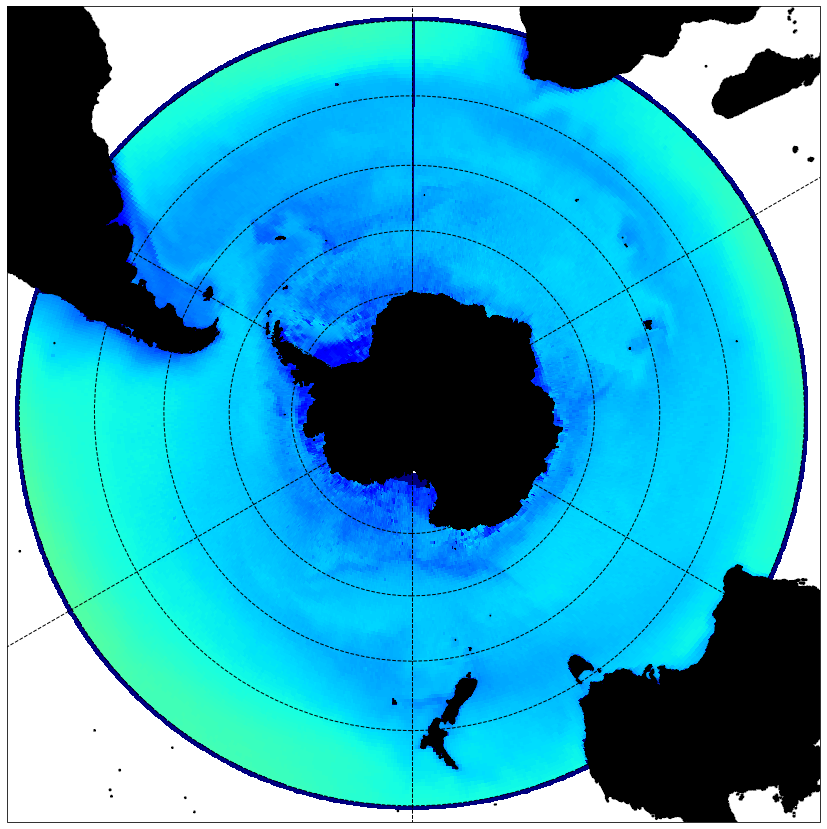

In [39]:
# This is Feb climatology for comparsion with Soppa et al., 2013
for mm, name in zip([1], ['February']):
    print(name)
    tar1= (np.nansum(~H_test5_mask[:,:,:,np.arange(mm,132,12).tolist()],axis=2))
    tar1 = np.nanmean(tar1,axis=2)

    print(tar1.min(),tar1.max())

    #Plotting
    cmin,cmax = 0,200
    c_min,c_max = 0,200
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)


    plt.pcolormesh(H_coords[0],H_coords[1],tar1.T,cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()


    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='k',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -28], ccrs.PlateCarree())


    # Add grid lines
    gl = ax.gridlines(draw_labels=False, linewidth=1, color='k', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)
    
    
    
    import matplotlib.ticker as mticker

    gl.ylocator = mticker.FixedLocator([-70,-60,-50,-40,-30])




    #
    #plt.title(title)
    plt.savefig('Zeu_F5_'+name+'cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

DJF
0.0 45.18181818181819


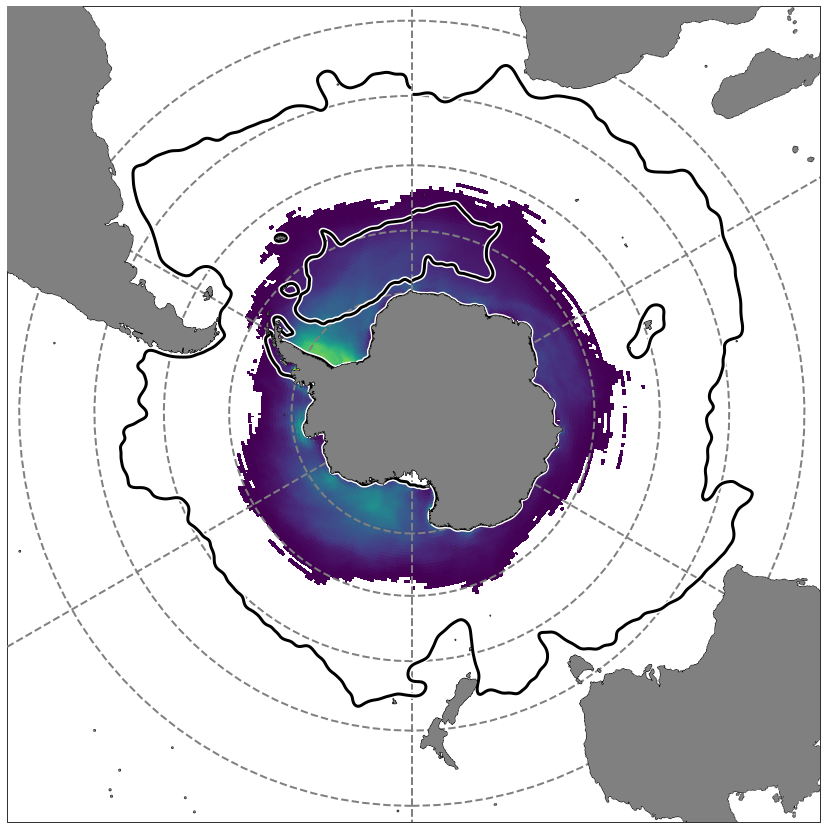

MAM
0.0 35.515151515151516


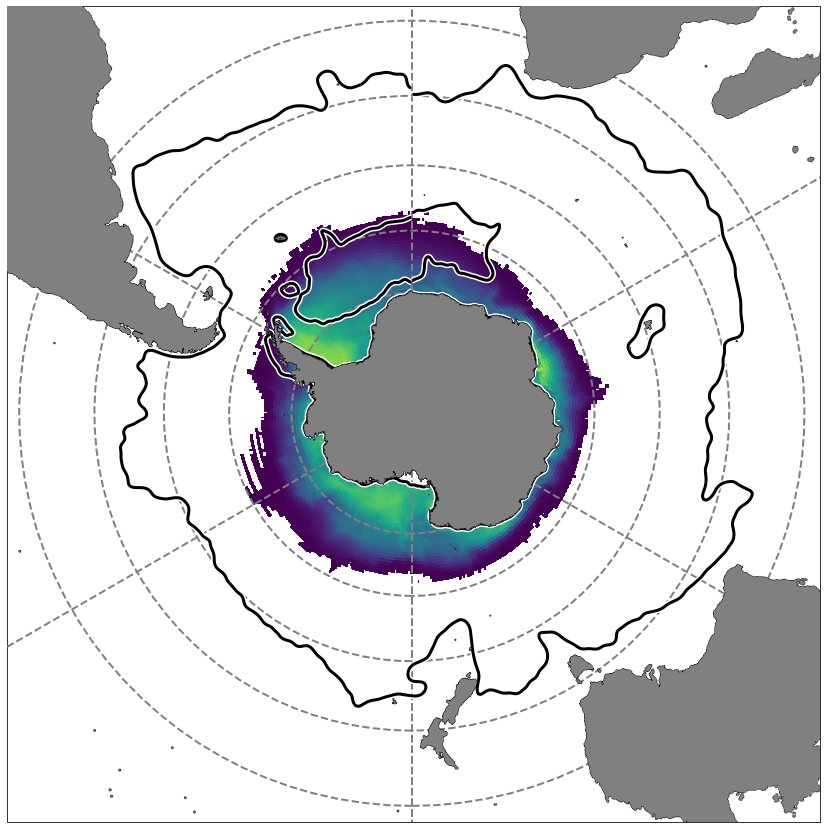

JJA
0.0 40.303030303030305


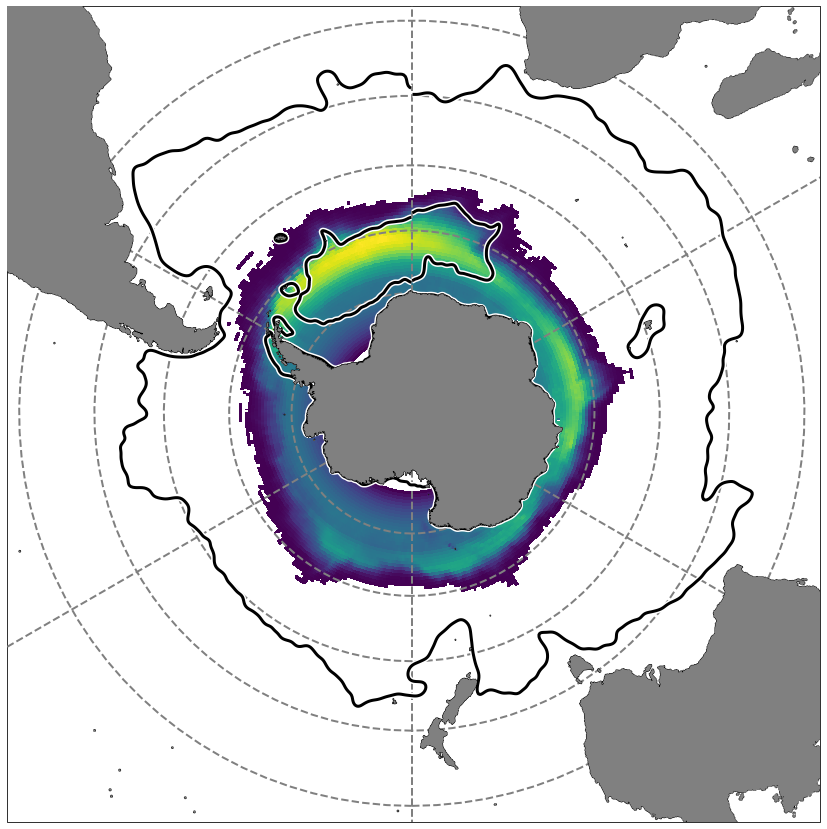

SON
0.0 61.57575757575759


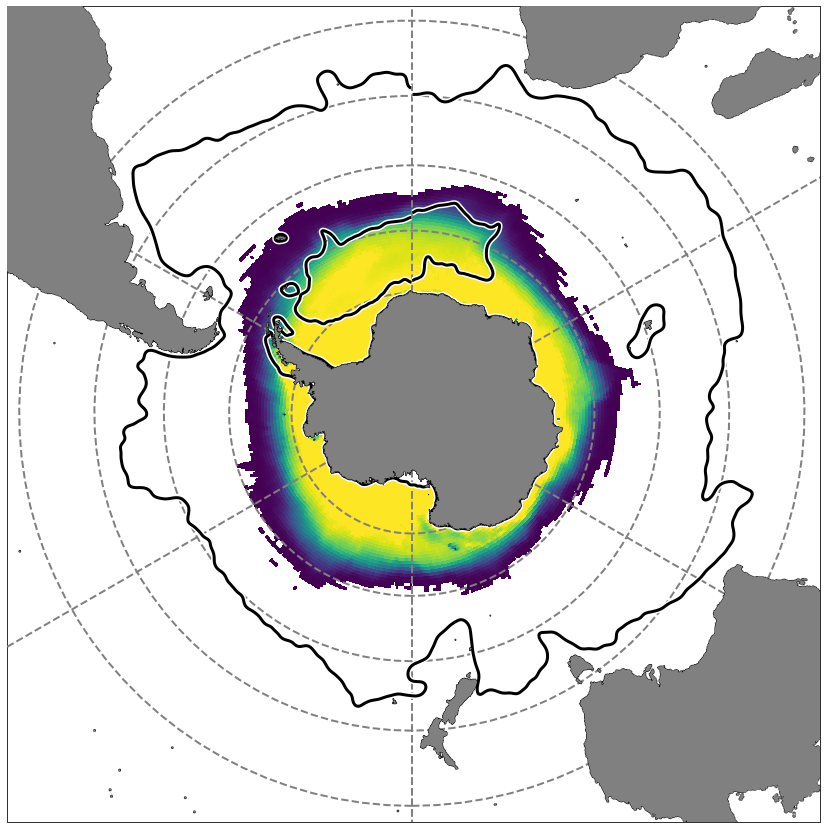

In [135]:
# F2 -F3
mms = ([11,0,1],[2,3,4],[5,6,7],[8,9,10])
names = ('DJF','MAM','JJA','SON')

for mm, name in zip(mms, names):
    print(name)
    tar1= (np.nansum(H_test2_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(H_test2_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(H_test2_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar1 = np.nanmean(tar1,axis=2)

    
    tar2= (np.nansum(~H_test3_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(~H_test3_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(~H_test3_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar2 = np.nanmean(tar2,axis=2)
    
    tar_diff = tar1 - tar2
    
    print(tar_diff.min(),tar_diff.max())
    
    tar_diff[tar_diff<=0] = np.nan

#Plotting
    cmin,cmax = 0,40
    c_min,c_max = 0,40
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)


    plt.pcolormesh(H_coords[0],H_coords[1],tar_diff.T,cmap='viridis',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='white',linewidths=6,zorder=7,transform=ccrs.PlateCarree())
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='k',linewidths=3,zorder=8,transform=ccrs.PlateCarree())



    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -28], ccrs.PlateCarree())


    # Add grid lines
    ylocs = [-70,-60,-50,-40,-30] 
    ax.gridlines(ylocs=ylocs,draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=6)

    #
    #plt.title(title)
    plt.savefig('Zeu_F3-F2_'+name+'+cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

DJF
2.3030303030302974 110.87878787878786


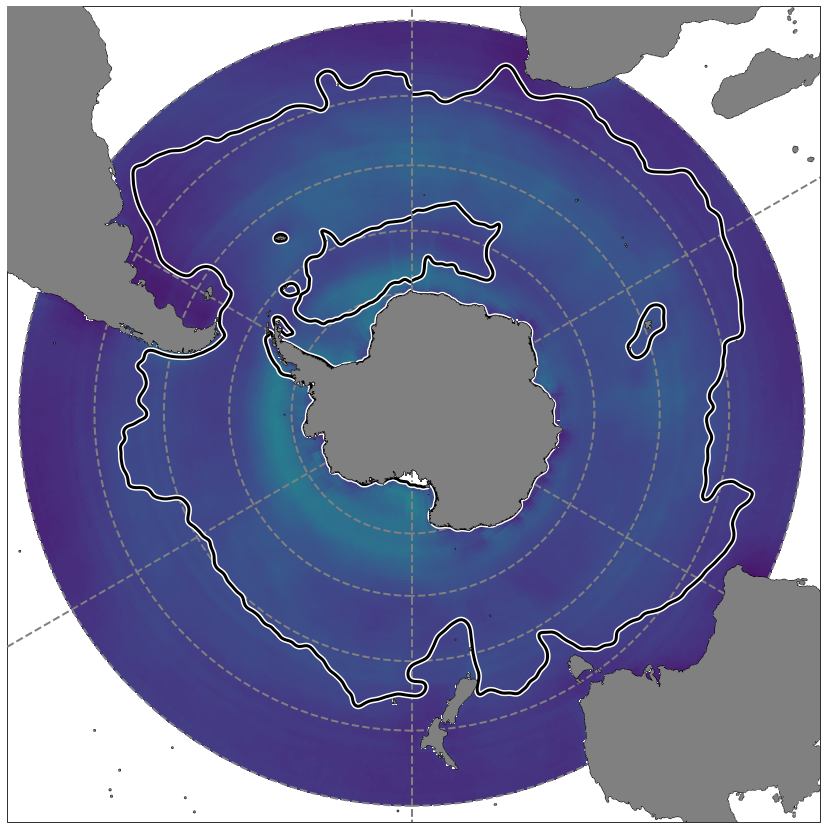

MAM
0.15151515151515582 101.06060606060605


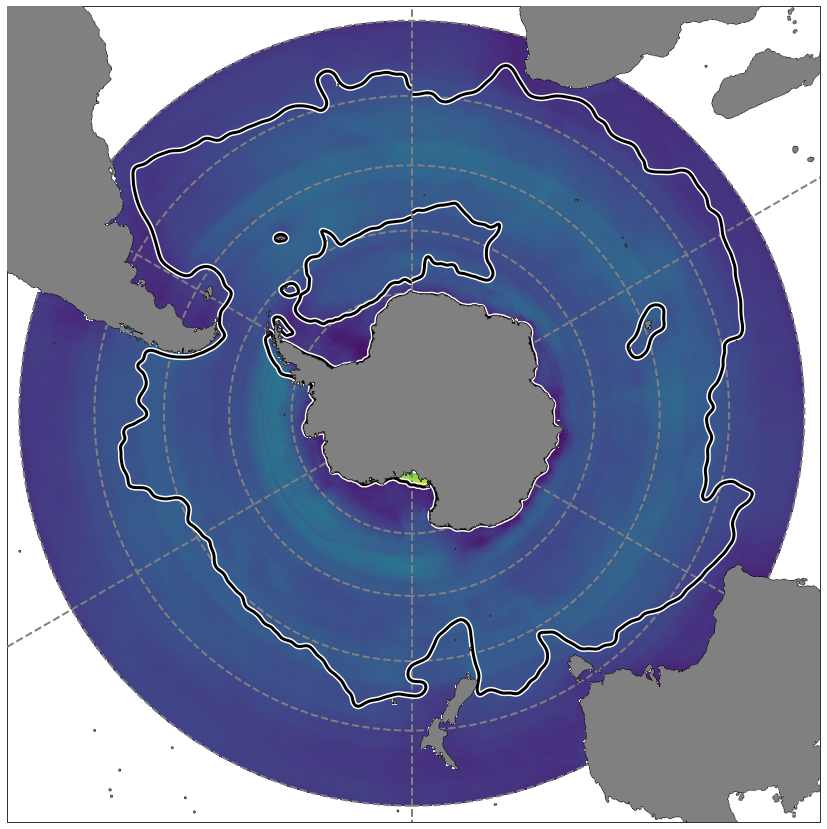

JJA
-1.9393939393939397 95.57575757575756


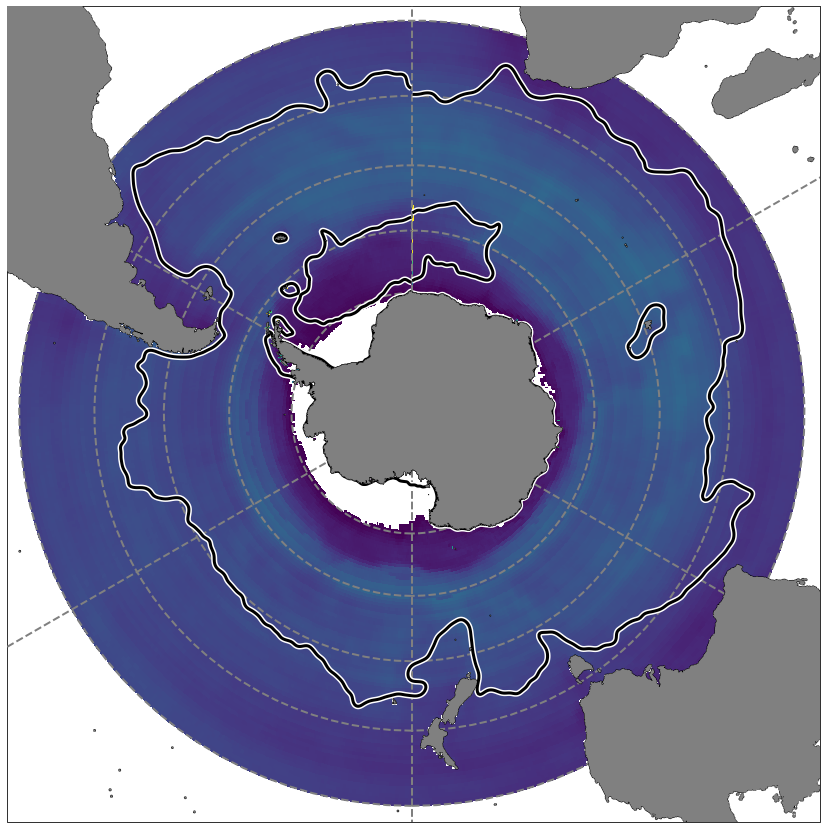

SON
-1.9696969696969546 106.75757575757575


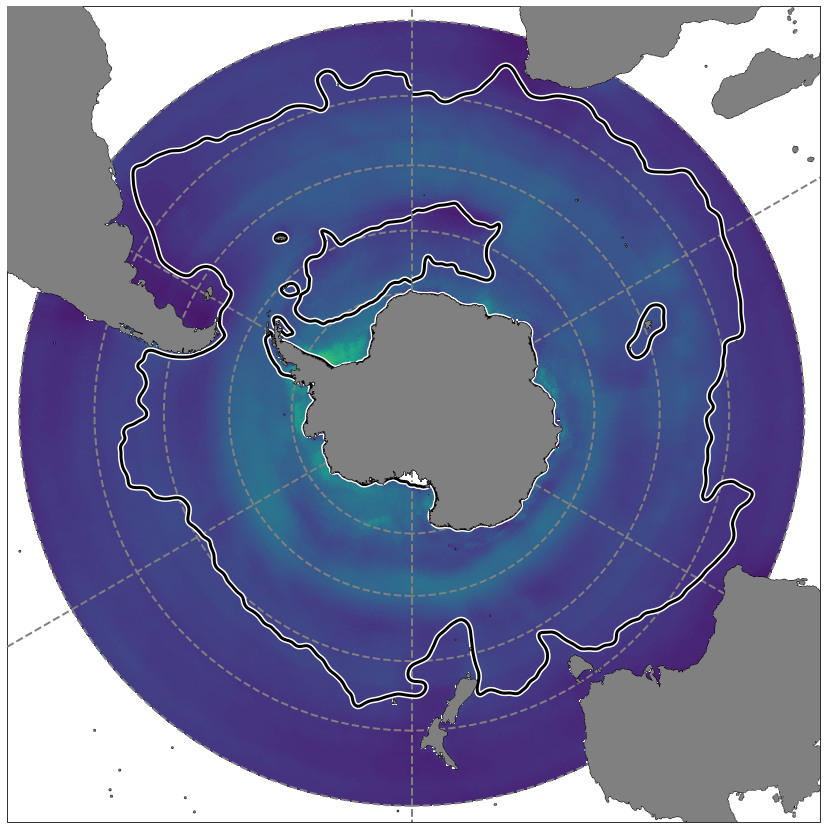

In [134]:
# F3 -F4
mms = ([11,0,1],[2,3,4],[5,6,7],[8,9,10])
names = ('DJF','MAM','JJA','SON')

for mm, name in zip(mms, names):
    print(name)
    tar1= (np.nansum(~H_test3_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(~H_test3_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(~H_test3_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar1 = np.nanmean(tar1,axis=2)

    
    tar2= (np.nansum(~H_test4_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(~H_test4_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(~H_test4_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar2 = np.nanmean(tar2,axis=2)
    
    tar_diff = tar1 - tar2
    
    print(tar_diff.min(),tar_diff.max())
    tar_diff[tar_diff<=0] = np.nan
    
    # Please check this carefully
    tar_diff[tar_diff>60] = np.nan
    
    
#Plotting
    cmin,cmax = 0,40
    c_min,c_max = 0,40
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)


    plt.pcolormesh(H_coords[0],H_coords[1],tar_diff.T,cmap='viridis',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='white',linewidths=6,zorder=7,transform=ccrs.PlateCarree())
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='k',linewidths=3,zorder=8,transform=ccrs.PlateCarree())



    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -28], ccrs.PlateCarree())


    # Add grid lines
    ylocs = [-70,-60,-50,-40,-30] 
    ax.gridlines(ylocs=ylocs,draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=6)

    #
    #plt.title(title)
    plt.savefig('Zeu_F3-F4_'+name+'_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

DJF
0.0 102.75757575757575


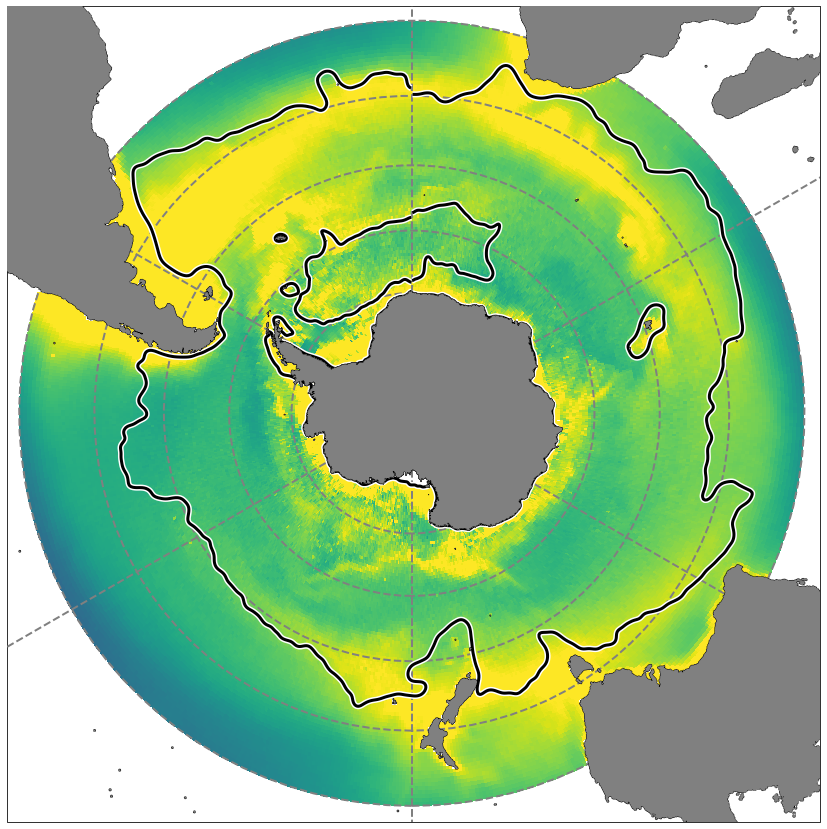

MAM
0.0 78.12121212121212


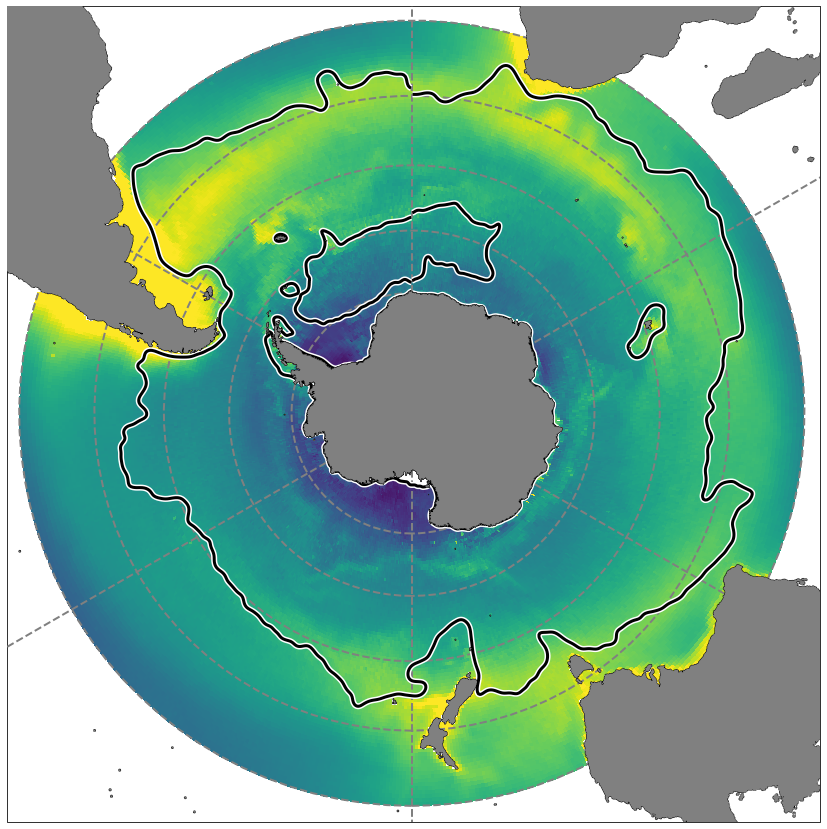

JJA
0.0 71.78787878787878


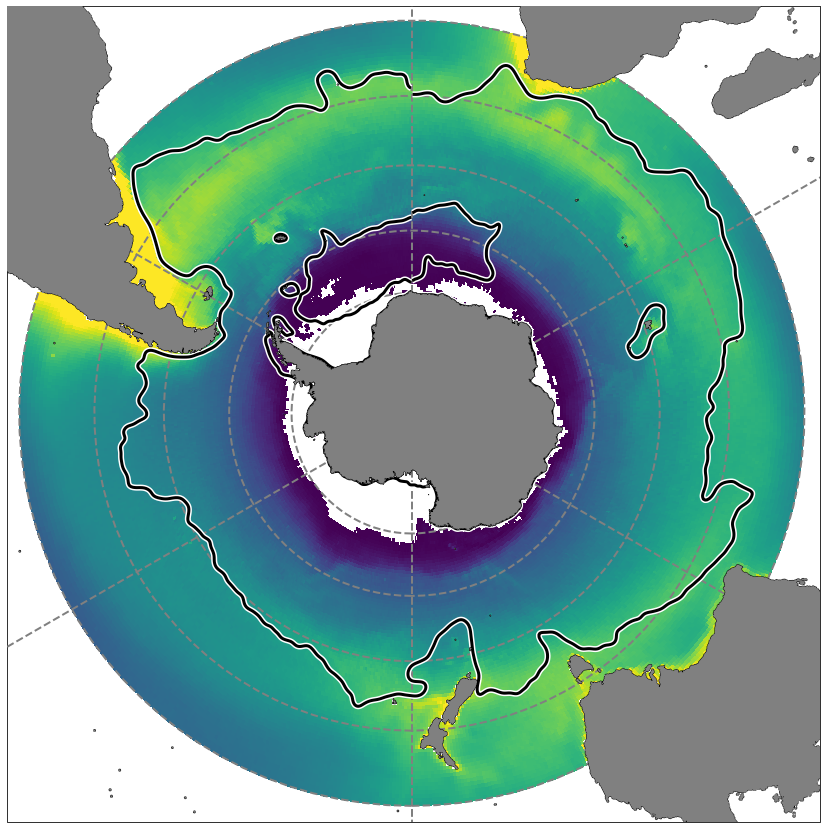

SON
0.0 85.12121212121212


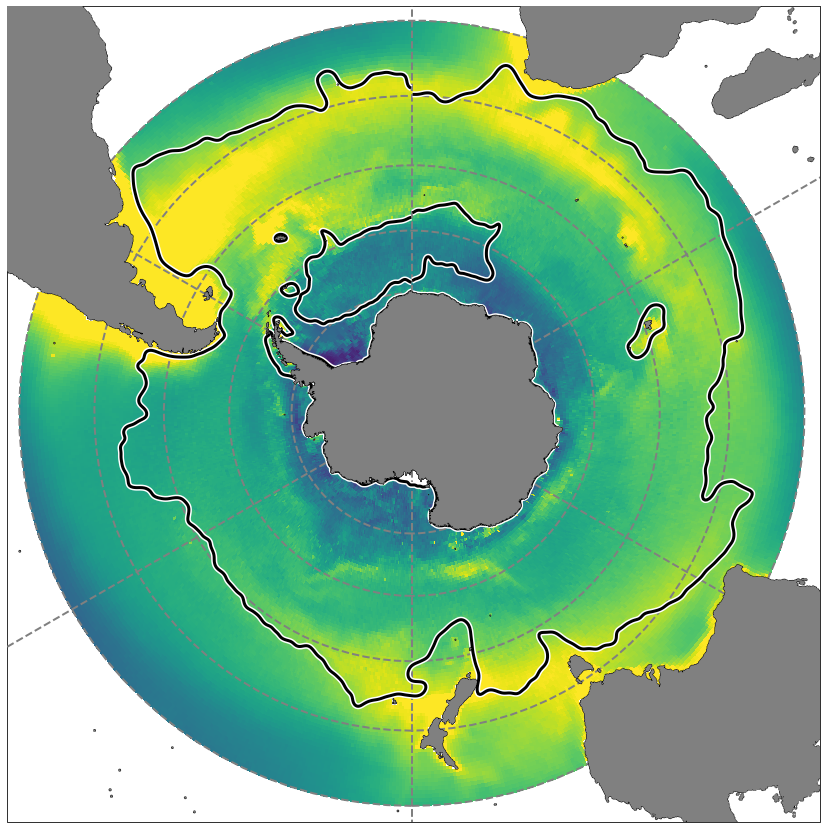

In [133]:
# F4 -F5
mms = ([11,0,1],[2,3,4],[5,6,7],[8,9,10])
names = ('DJF','MAM','JJA','SON')

for mm, name in zip(mms, names):
    print(name)
    tar1= (np.nansum(~H_test4_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(~H_test4_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(~H_test4_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar1 = np.nanmean(tar1,axis=2)

    
    tar2= (np.nansum(~H_test5_mask[:,:,:,np.arange(mm[0],132,12).tolist()],axis=2) + 
          np.nansum(~H_test5_mask[:,:,:,np.arange(mm[1],132,12).tolist()],axis=2) + 
          np.nansum(~H_test5_mask[:,:,:,np.arange(mm[2],132,12).tolist()],axis=2))/3
    tar2 = np.nanmean(tar2,axis=2)
    
    tar_diff = tar1 - tar2
    
    print(tar_diff.min(),tar_diff.max())
    
    tar_diff[tar_diff<=0] = np.nan
    
#Plotting
    cmin,cmax = 0,40
    c_min,c_max = 0,40
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)


    plt.pcolormesh(H_coords[0],H_coords[1],tar_diff.T,cmap='viridis',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='white',linewidths=6,zorder=7,transform=ccrs.PlateCarree())
    plt.contour(particle_range_x,particle_range_y,particle_range.T,levels=[0.5],colors='k',linewidths=3,zorder=8,transform=ccrs.PlateCarree())



    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -28], ccrs.PlateCarree())


    # Add grid lines
    ylocs = [-70,-60,-50,-40,-30] 
    ax.gridlines(ylocs=ylocs,draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=6)

    #
    #plt.title(title)
    plt.savefig('Zeu_F4-F5_'+name+'_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

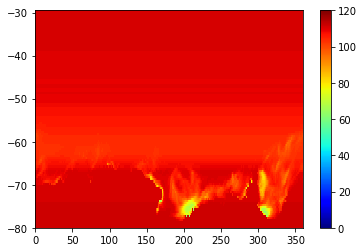

In [226]:
plt.pcolormesh(H_coords[0],H_coords[1],np.nansum(~H_test3_mask[:,:,:,0],axis=2).T,vmin=0,vmax=120,cmap='jet')
plt.colorbar()

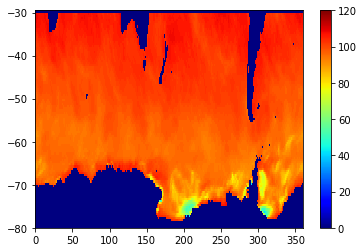

In [227]:
plt.pcolormesh(H_coords[0],H_coords[1],np.nansum(~H_test4_mask[:,:,:,0],axis=2).T,vmin=0,vmax=120,cmap='jet')
plt.colorbar()

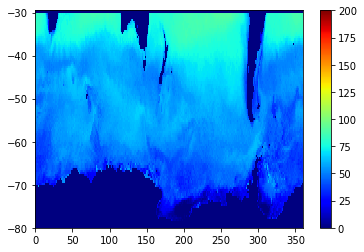

In [230]:
plt.pcolormesh(H_coords[0],H_coords[1],np.nansum(~H_test5_mask[:,:,:,2],axis=2).T,vmin=0,vmax=200,cmap='jet')
plt.colorbar()

In [192]:
np.nansum(H_test2_mask[:,:,:,11],axis=2).max()

114

In [193]:
print(' 115m fixed: days from 1995-1 to 2005-12:',5*np.sum(H[:,:,H_coords[2]<115,:])/npts_here)

 115m fixed: days from 1995-1 to 2005-12: 470.1703492713144


In [249]:
H_here.shape

(721, 101, 150, 11)

In [248]:
H_mask_here.shape

(721, 101, 150, 10)

In [25]:
#------------------------------------------------------------------------------------------------------#
monthly_sum_F1=[]
#H_masked = ~H_test5_mask[:,:,:,:131]
for i in np.arange(12):
    #H_here = H[:,:,:,np.arange(i,131,12).tolist()]
    #H_mask_here = H_masked[:,:,:,np.arange(i,131,12).tolist()]
    #H
    monthly_sum_F1.append(5*np.sum(H[:,:,:,np.arange(i,132,12).tolist()][:,:,H_coords[2]<115])/npts_here)

print('CP1')
monthly_sum_F5=[]
H_masked = ~H_test5_mask[:,:,:,:132]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,132,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,132,12).tolist()]
    monthly_sum_F5.append(5*np.sum(H_here[H_mask_here])/npts_here)    
print('CP2')
monthly_sum_F4=[]
H_masked = ~H_test4_mask[:,:,:,:132]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,132,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,132,12).tolist()]
    monthly_sum_F4.append(5*np.sum(H_here[H_mask_here])/npts_here) 
print('CP3')    
monthly_sum_F3=[]
H_masked = ~H_test3_mask[:,:,:,:132]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,132,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,132,12).tolist()]
    monthly_sum_F3.append(5*np.sum(H_here[H_mask_here])/npts_here) 
print('CP4')    
monthly_sum_F2=[]
H_masked = H_test2_mask[:,:,:,:132]
for i in np.arange(12):
    H_here = H[:,:,:,np.arange(i,132,12).tolist()]
    H_mask_here = H_masked[:,:,:,np.arange(i,132,12).tolist()]
    monthly_sum_F2.append(5*np.sum(H_here[H_mask_here])/npts_here)   
    
    
    


CP1
CP2
CP3
CP4


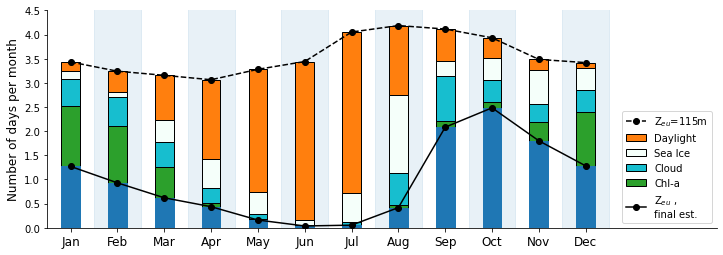

In [51]:
# In below chunk, there are 131 months from 1995-1 to 2005-12, which mean 11 years for Feb-Dec and 10 years for Jan

# Plotting
# Create a 3x1 subplot grid
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,4), gridspec_kw={"width_ratios": [1], "height_ratios": [1],"wspace": 0.0})





# F1
plt.plot(np.arange(1,13), np.array(monthly_sum_F1)/11, '--o', color='k', label='Z$_{eu}$=115m',zorder=10)
plt.hist(np.arange(1,13), bins=np.arange(0.5,15), weights=np.array(monthly_sum_F1)/11, edgecolor='k',color='C1',zorder=1,label='Daylight', rwidth=0.4)

# Loop over the subplots and plot the datak
plt.hist(np.arange(1,13), bins=np.arange(0.5,15), weights=np.array(monthly_sum_F2)/11, edgecolor='k',color='mintcream',zorder=2,label='Sea Ice', rwidth=0.4)

# Loop over the subplots and plot the data
plt.hist(np.arange(1,13), bins=np.arange(0.5,15), weights=np.array(monthly_sum_F3)/11, edgecolor='k',color='C9',zorder=3,label='Cloud', rwidth=0.4)

# Loop over the subplots and plot the data
plt.hist(np.arange(1,13), bins=np.arange(0.5,15), weights=np.array(monthly_sum_F4)/11, edgecolor='k',color='C2',zorder=4,label='Chl-a', rwidth=0.4)

# F5
plt.hist(np.arange(1,13), bins=np.arange(0.5,15), weights=np.array(monthly_sum_F5)/11, edgecolor='C0',color='C0',zorder=5, rwidth=0.4)
plt.plot(np.arange(1,13), np.array(monthly_sum_F5)/11, '-o', color='k', label='Z$_{eu}$ ,\nfinal est.',zorder=10)


# Add labels and title
#ax.set_xlabel('Date')
ax.set_ylabel('Number of days per month',fontsize=12)  # Replace with your desired y-axis label
#ax.set_title('Timeseries Data')  # Replace with your desired title
# Set the x-axis tick positions and labels
tick_positions = np.array([1,2,3,4,5,6,7,8,9,10,11,12])
tick_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels,fontsize=12)

days_here = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12])
'''
for i in [1,3,5,7,9,11]:
    ax.fill_between(days_here[i:i+2]+0.5, [0,0],[400,400], alpha=0.1,zorder=0,color='C0')'''

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#ax.spines['bottom'].set_visible(False)

days_here = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12])
for i in [1,3,5,7,9,11]:
    ax.fill_between(days_here[i:i+2]+0.5, [0,0],[400,400], alpha=0.1,zorder=0,color='C0')


# Show the legend
ax.legend(fontsize=10,loc='lower right')
ax.set_ylim([0,4.5])
ax.set_xlim([0.5,14.8])

# Display the plot
plt.savefig('Discussion_days_per_month_for_5_Factors_ver2_C0bg.png',dpi=500)

In [338]:
Diff_1_2 = np.array(monthly_sum_F1) - np.array(monthly_sum_F2)
Diff_2_3 = np.array(monthly_sum_F2) - np.array(monthly_sum_F3)
Diff_3_4 = np.array(monthly_sum_F3) - np.array(monthly_sum_F4)
Diff_4_5 = np.array(monthly_sum_F4) - np.array(monthly_sum_F5)
#
sum_of_factors = np.array(monthly_sum_F1) - np.array(monthly_sum_F5)
sum_of_all     = np.array(monthly_sum_F1)

sum_of_factors_4s = []
sum_of_all_4s = []
Diff_1_2_4s = []
Diff_2_3_4s = []
Diff_3_4_4s = []
Diff_4_5_4s = []

for ind in [11,0,1],[2,3,4],[5,6,7],[8,9,10]:
    sum_of_factors_4s.append(np.sum((sum_of_factors[ind]))  )
    sum_of_all_4s.append(np.sum((sum_of_all[ind]))   )
    Diff_1_2_4s.append(np.sum((Diff_1_2[ind]))   )
    Diff_2_3_4s.append(np.sum((Diff_2_3[ind]))   )
    Diff_3_4_4s.append(np.sum((Diff_3_4[ind]))   )
    Diff_4_5_4s.append(np.sum((Diff_4_5[ind]))   )
    
print('For DJF,MAM,JJA,SON')
print('F1-F2: \n',Diff_1_2_4s)
print('F2-F3: \n',Diff_2_3_4s)
print('F3-F4: \n',Diff_3_4_4s)
print('F4-F5: \n',Diff_4_5_4s)

print('sum_of_factors_4s: \n',sum_of_factors_4s)
print('sum_of_all_4s: \n',sum_of_all_4s)

For DJF,MAM,JJA,SON
F1-F2: 
 [7.919167058433118, 56.020436381737234, 88.80921434694838, 14.20411493044994]
F2-F3: 
 [7.943502668620887, 16.85406930118083, 25.045352728077212, 16.299328005309583]
F3-F4: 
 [17.823898675368493, 10.263267055667711, 8.382373275075357, 19.27546251486408]
F4-F5: 
 [39.01938552584276, 7.953181604491026, 0.6006471059981744, 7.031470368629183]
sum_of_factors_4s: 
 [72.70595392826526, 91.09095434307679, 122.8375874560991, 56.81037581925278]
sum_of_all_4s: 
 [111.00688587151905, 104.49296203091728, 128.4517850723155, 126.8336052653411]


# Plotting the chl-a field we use in this research

In [4]:
npzfile = np.load('/g/data/jk72/yx9454/occci-v6.0-climatology_GFDL_combined/occci_chl_v6_3600x931_combine_GFDL.npz')

In [ ]:
for mm in [8]:
    #Plotting
    plt.close()
    cmin,cmax = 0,1.5
    c_min,c_max = 0,1.5
    fig = plt.figure(num=1,figsize=(15,15))
    ax = plt.subplot(projection=ccrs.SouthPolarStereo())

    c_minc_max = cmin,cmax
    levels = np.arange(cmin,cmax)

    #X,Y = np.meshgrid(npzfile['lat'],npzfile['lon'])

    plt.pcolormesh(xt_ocean,yt_ocean[:930],npzfile[npzfile.files[mm-1]],cmap='jet',vmax=c_max,vmin=c_min,zorder=5,
                  transform=ccrs.PlateCarree())
    #ax.colorbar()


    # Isobath and background
    X,Y = np.meshgrid(xt_ocean,yt_extend)
    ax.contourf(X,Y,np.ma.masked_greater(ocean_depth_extend,0),colors='gray',zorder=11,transform=ccrs.PlateCarree()) #Land Mask cmap=cmap_ice
    ax.contour(X, Y,ocean_depth_extend,[1],colors='black',linewidths=0.5,zorder=12,transform=ccrs.PlateCarree()) #isoheight of ocean

    ax.set_extent([-180, 180, -90, -29.5], ccrs.PlateCarree())
    '''
    # Set the global extent to the plot
    ax.set_global()'''

    # Add grid lines
    ax.gridlines(draw_labels=False, linewidth=2, color='gray', alpha=1, linestyle='--',transform=ccrs.PlateCarree(),zorder=10)
    ax.margins(0)
    #
    #plt.title(title)
    plt.savefig('occci_chl_v6_721x101_month_'+str(mm)+'_cRange_'+str(cmin)+'_'+str(cmax)+'.png',format='png',dpi=300)
    plt.show()

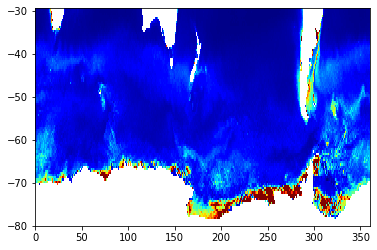

In [12]:
plt.pcolormesh(npzfile['lon'],npzfile['lat'],occci_chl_v6_721x101[mm-1].T,cmap='jet',vmax=c_max,vmin=c_min)

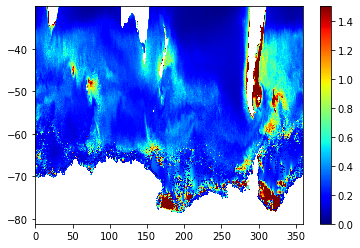

In [31]:
plt.pcolormesh(xt_ocean,yt_ocean[:930],npzfile[npzfile.files[10]],cmap='jet',vmax=1.5,vmin=0)
plt.colorbar()

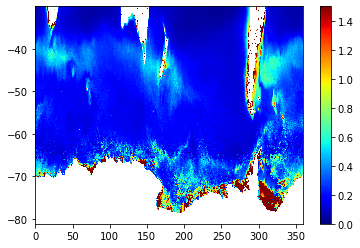

In [32]:
plt.pcolormesh(xt_ocean,yt_ocean[:930],npzfile[npzfile.files[3]],cmap='jet',vmax=1.5,vmin=0)
plt.colorbar()

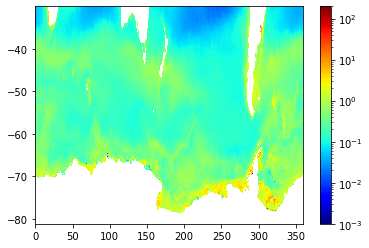

In [19]:
import matplotlib.colors as colors
c_min,c_max = 0.001, 200
cmin,cmax = 0.001, 200
levels = np.logspace(np.log10(cmin), np.log10(cmax), 100)  # Logarithmic levels

norm = colors.LogNorm(vmin=c_min, vmax=c_max)  # Logarithmic normalization

plt.pcolormesh(xt_ocean,yt_ocean[:930],npzfile[npzfile.files[1]], cmap='jet', norm=norm)
plt.colorbar()